In [1]:
from utils import *

grid_rf = {
    'n_estimators': [100, 200, 300],
     'max_depth': [10, 20, 30],
     'min_samples_split': [2, 5, 10],
     'min_samples_leaf': [1, 2, 4]
}

grid_xgb = {
    'n_estimators': [50, 100, 150],
    'min_child_weight': [1, 3, 5],
    'max_leaves': [5, 20, 100]
}

# Caso
caso = 'amanda'
diferenciales = [1, 2] 

dataset = pd.concat([pd.read_csv(f'dataset_{caso}_{diferencial}.csv') for diferencial in diferenciales])
dataset

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


,gender,sel_Ind1,sel_Grup,sel_Ind2,comment_Ind1,comment_Grup,comment_Ind2,summary
0,M,1,3,1,algoritmo x parece mejor elegir población dent...,perjudicar nadie elegimos 3 cosa algoritmo x a...,opción cambio etapa 3 puesto todavía pienso pr...,alo hola hola holaa q procede
1,M,3,2,2,extranjeros normalmente jóvenes población asen...,creemos debería ser 2 pues acuerdo debería ser...,aunque preferible población migrante joven pro...,wenas holis 2
2,M,4,3,3,pienso cualquier servicio especialmente relaci...,inicialmente habia optado poner 4 ahora cambio...,caso postura cambio tomando cuenta algoritmo x...,ola hola aloo saludos cordiales compañeros 4
3,M,3,2,4,parecer aunque algoritmo x potencialmente gene...,parecer aunque algoritmo x potencialmente gene...,finalmente tomando discusión anterior postura ...,holaa holaa holaa hola
4,M,3,3,3,deberia escoger levemente algoritmo x algoritm...,grupo analizaron distintas opiniones llego con...,mantengo firmemente postura mejor opcion elegi...,holaa holaa holaaa wenaaa hola
...,...,...,...,...,...,...,...,...
494,M,1,3,2,mejor diga exactitud enfermedad diga verdad si...,mayor exactitud podria saber si alguien enferm...,cambie postura punto si bien mas importante ge...,q chat hola puse dos 1
495,F,3,3,3,si bien necesaria explicabilidad pues dice ext...,creo debería escoger algoritmo w pues razonó a...,pregunta concordamos misma valoración debería ...,ª creo deberíamos elegir algoritmo x w olas
496,M,2,2,2,ahora creo igualmente algoritmo posea mayor ex...,creemos tener alta exactitud pasaria segundo p...,aquí varios misma postura excepto compañero cr...,buenas buenas lel parecer primera pondria punt...
497,F,2,3,2,pues si aunque necesario saber ocurriendo si f...,si bien w capacitado explicar asegura funciona...,misma postura principio decir mientras certeza...,hola hola oal ando calle


# Todos los diferenciales

## Modelo base

In [2]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=False, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__155,Ind1__2,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [3]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2'])])

In [4]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AACE9A97D0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AACE9A97D0>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AACE9A97D0>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AACE9A97D0>),
                                 'summary')])

In [5]:
df_train

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__155,Ind1__2,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       1.00      0.12      0.22        49
         0.0       0.51      1.00      0.68        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.53       182
   macro avg       0.50      0.37      0.30       182
weighted avg       0.52      0.53      0.39       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.76      0.78      0.77        49
         0.0       0.72      0.74      0.73        90
         1.0       0.67      0.60      0.63        43

    accuracy                           0.72       182
   macro avg       0.72      0.71      0.71       182
weighted avg       0.72      0.72      0.72       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


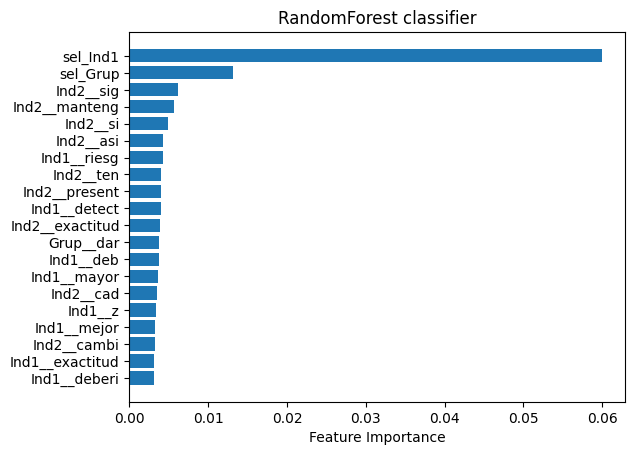

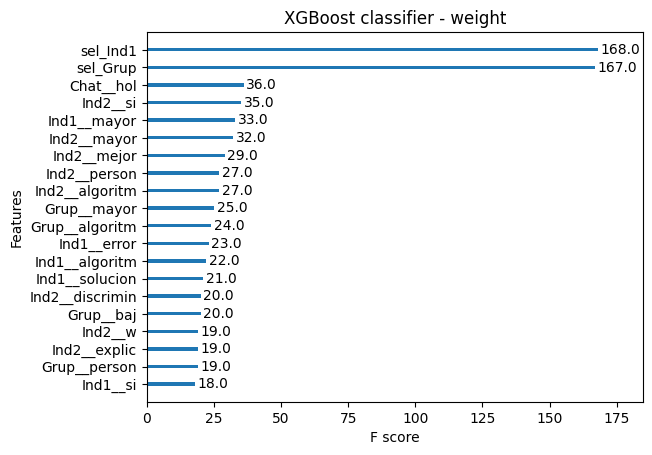

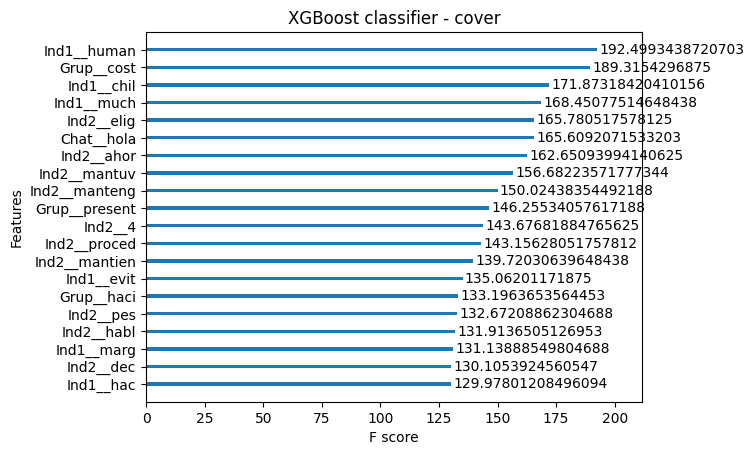

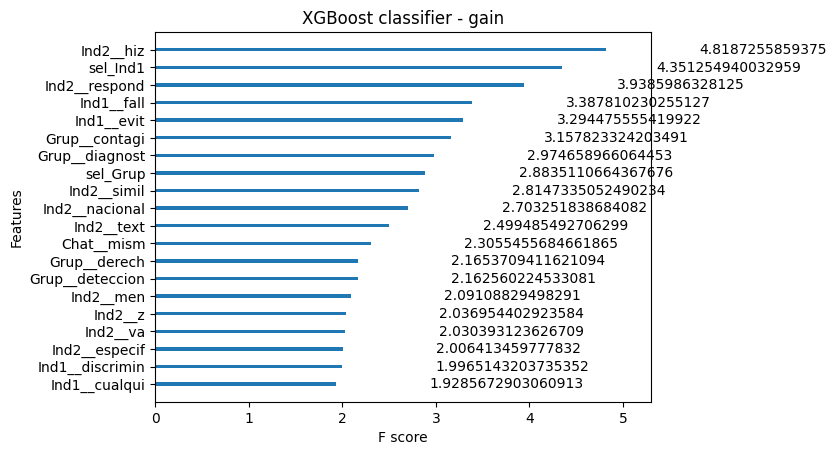

In [7]:
plot_importance_models(rf_best_model, xgb_best_model)

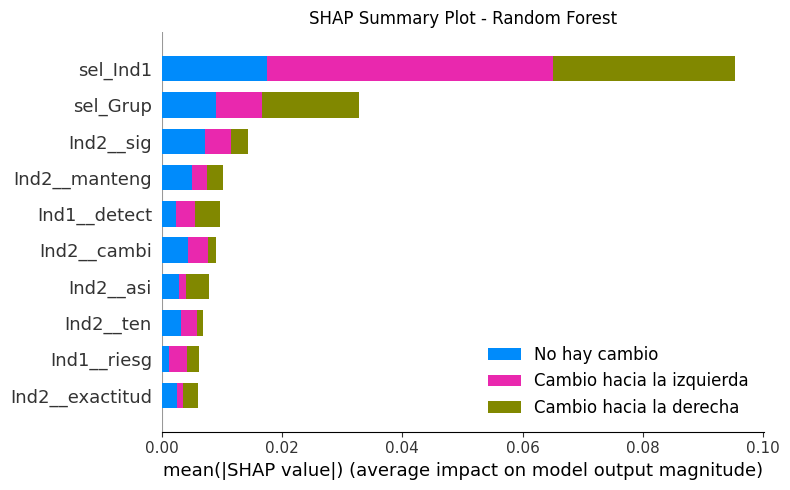

In [8]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[22:47:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


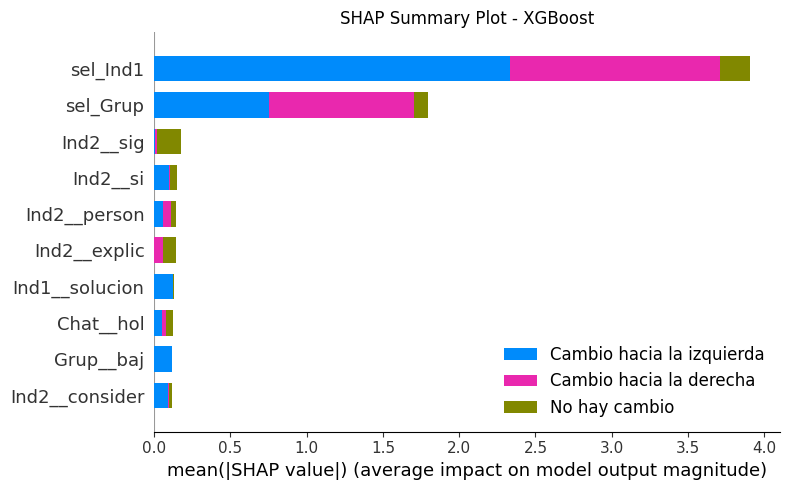

In [9]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

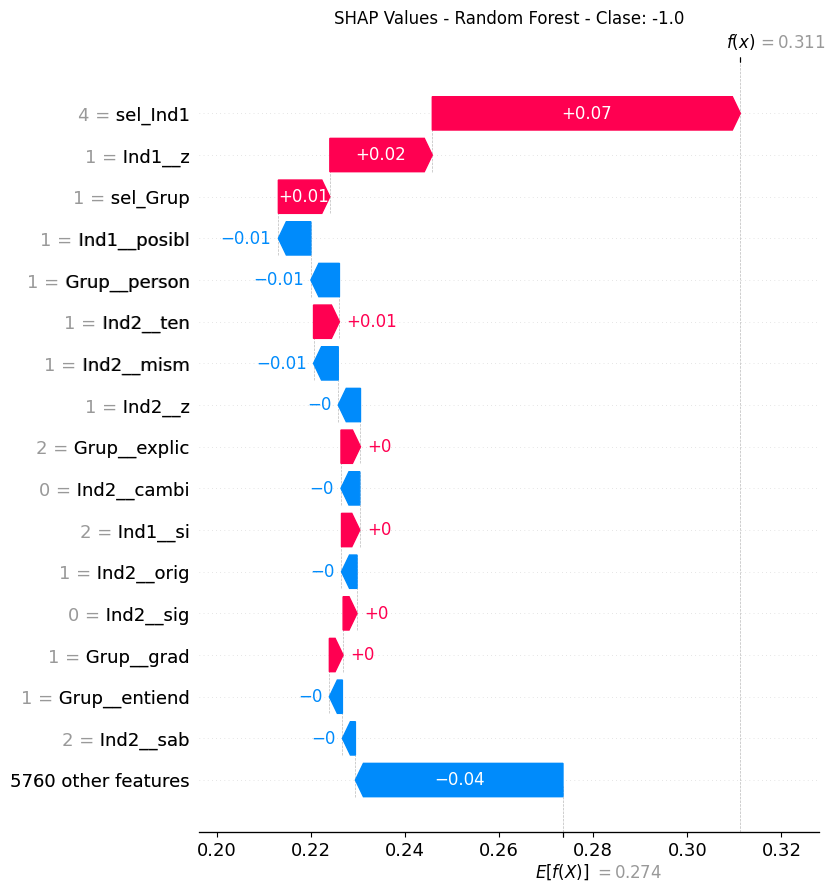

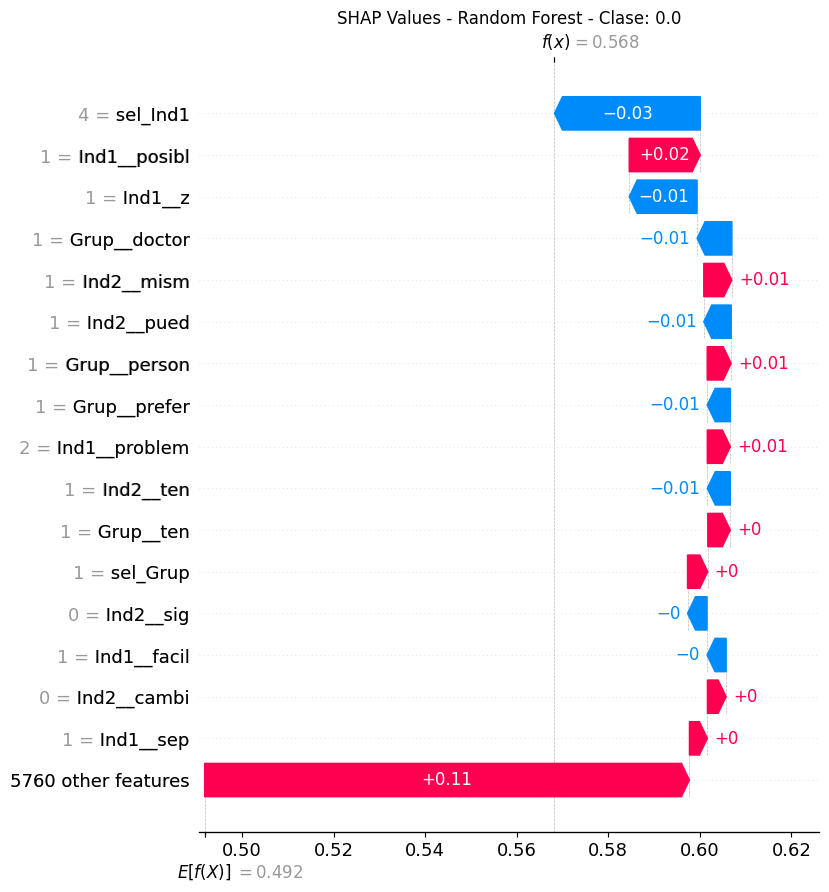

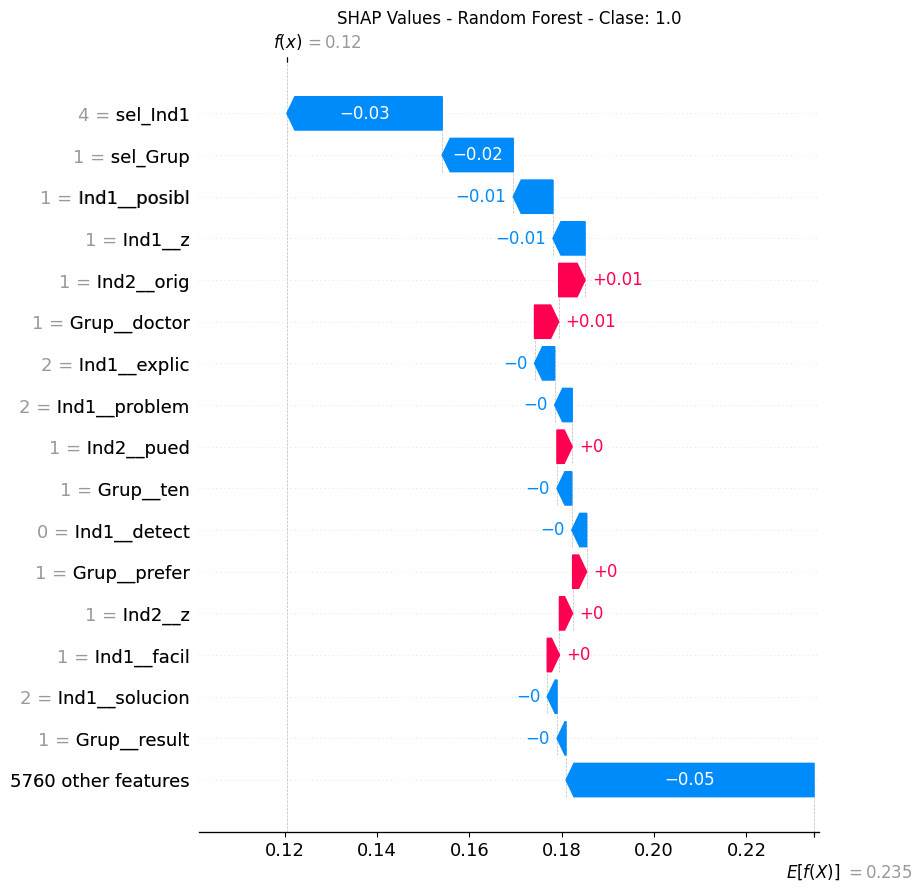

In [10]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[22:47:55] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


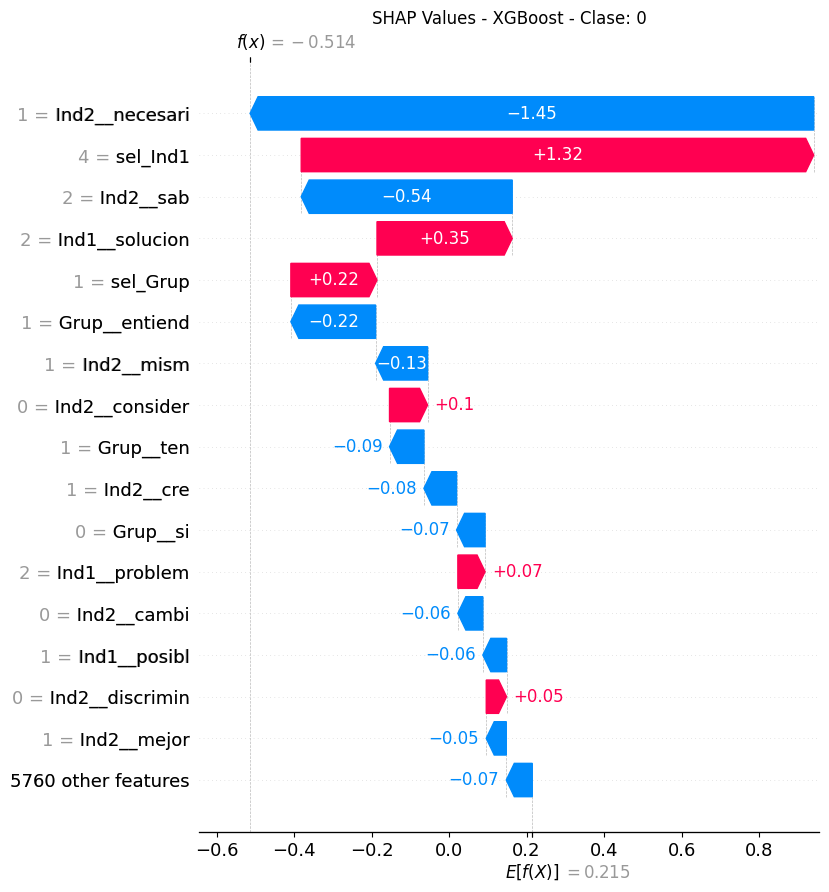

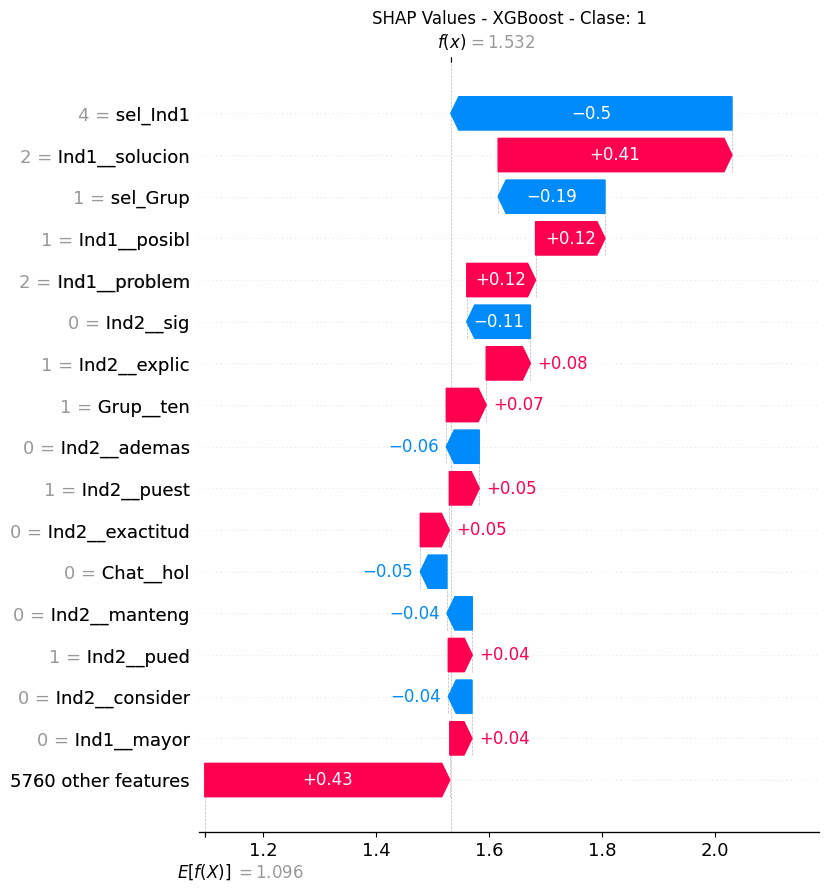

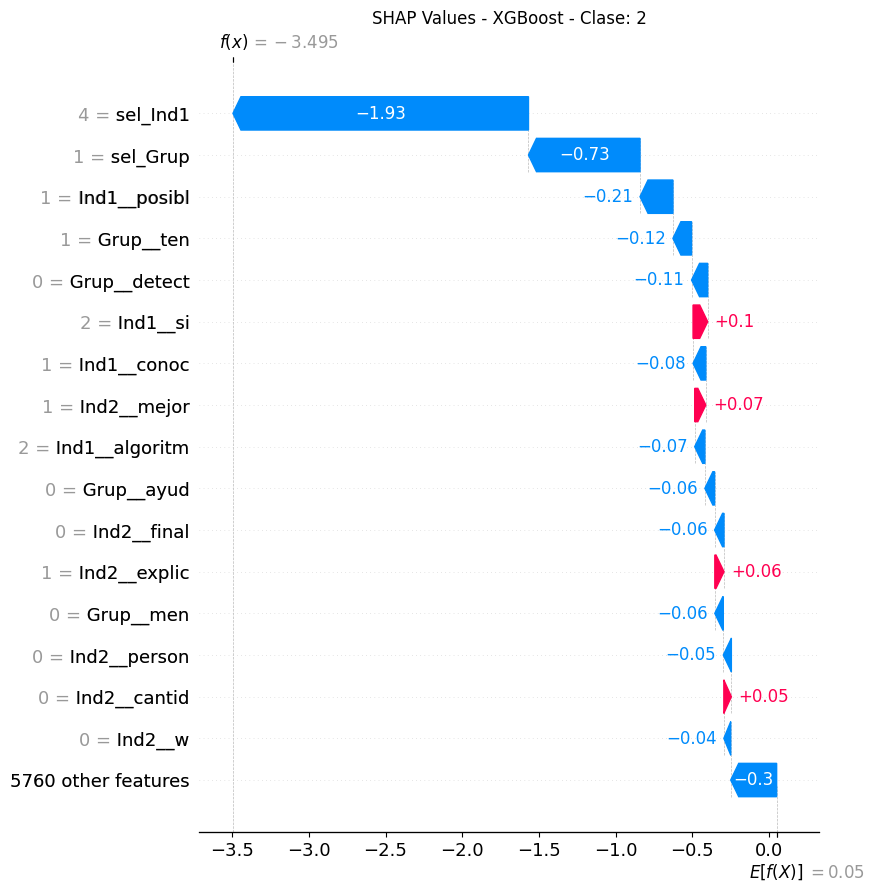

In [11]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 2. Agregar género

In [12]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [14]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD849A790>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD849A790>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD849A790>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD849A790>),
                                 'summary')])

In [15]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
              precision    recall  f1-score   support

        -1.0       1.00      0.06      0.12        49
         0.0       0.50      1.00      0.67        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.51       182
   macro avg       0.50      0.35      0.26       182
weighted avg       0.52      0.51      0.36       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.73      0.78      0.75        49
         0.0       0.69      0.69      0.69        90
         1.0       0.60      0.56      0.58        43

    accuracy                           0.68       182
   macro avg       0.67      0.67      0.67       182
weighted avg       0.68      0.68      0.68       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


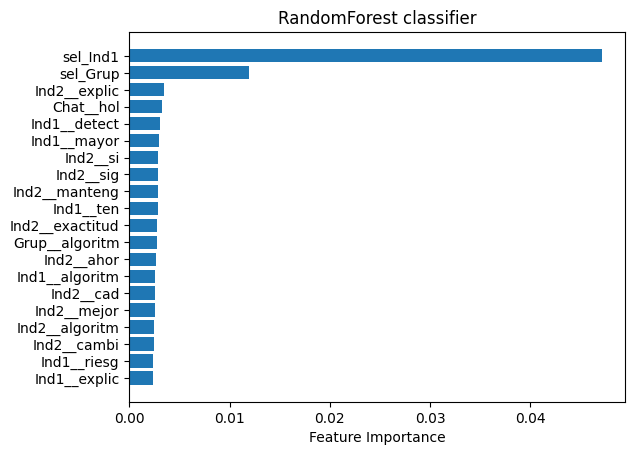

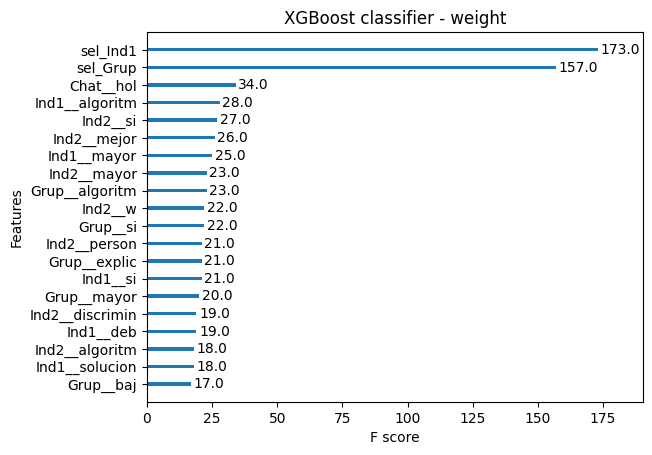

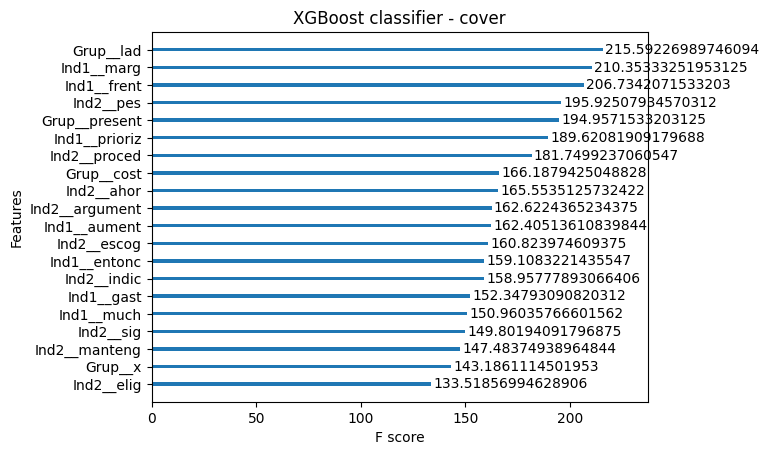

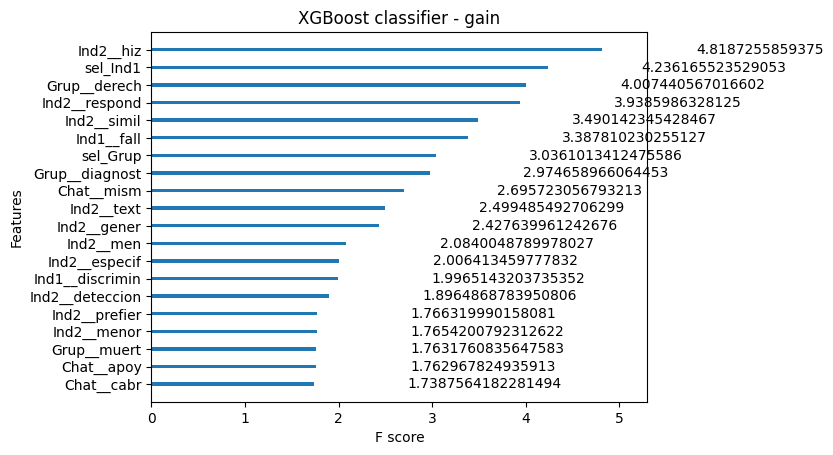

In [16]:
plot_importance_models(rf_best_model, xgb_best_model)

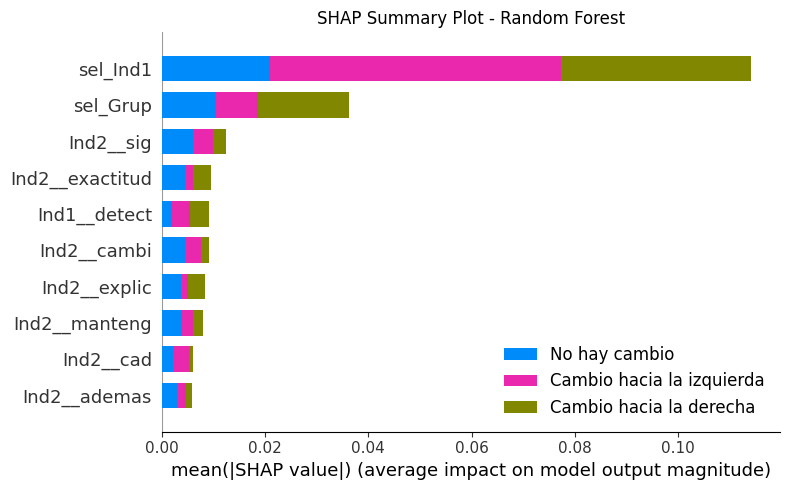

In [17]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[22:52:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


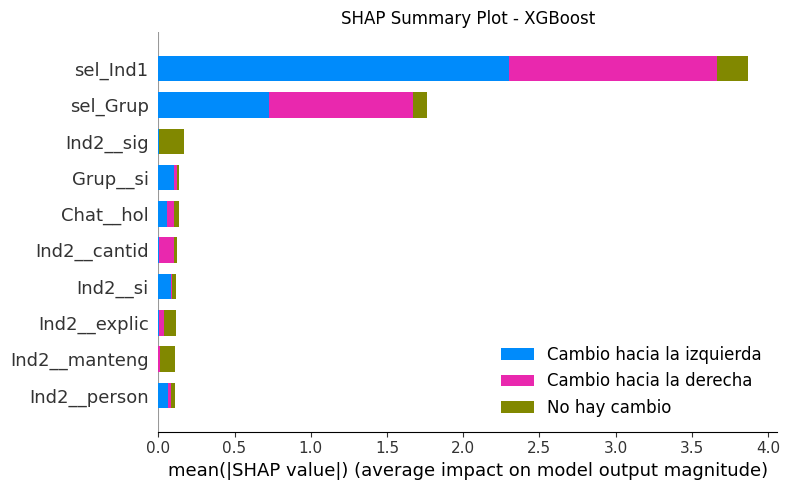

In [18]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

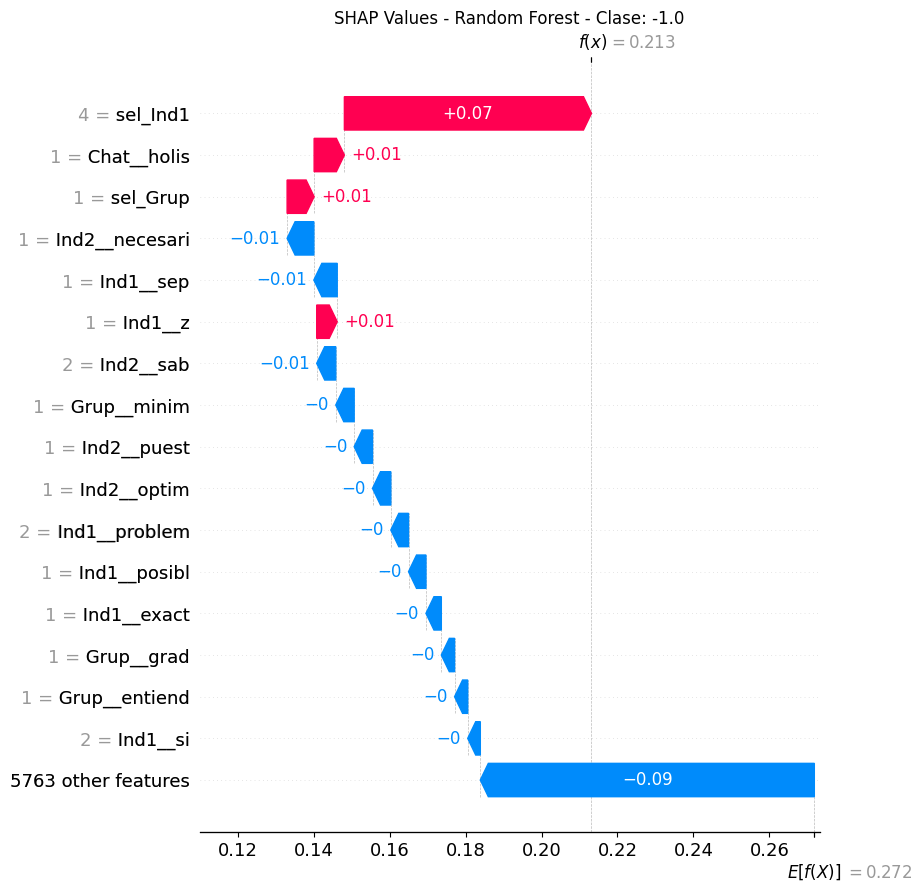

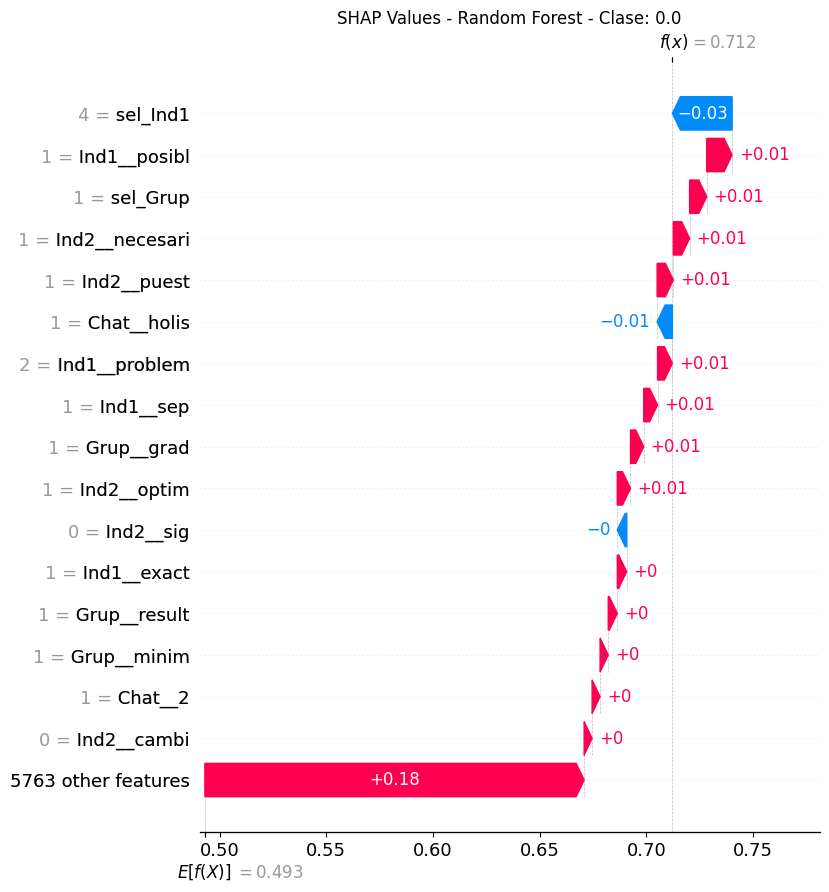

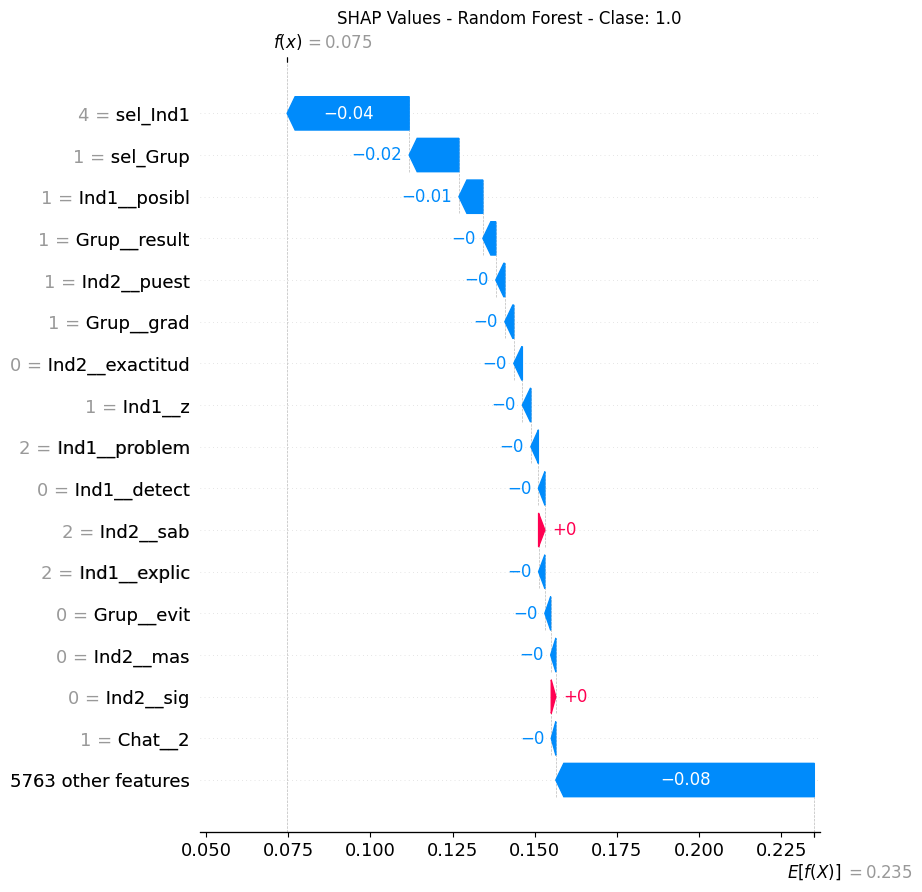

In [19]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[22:53:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


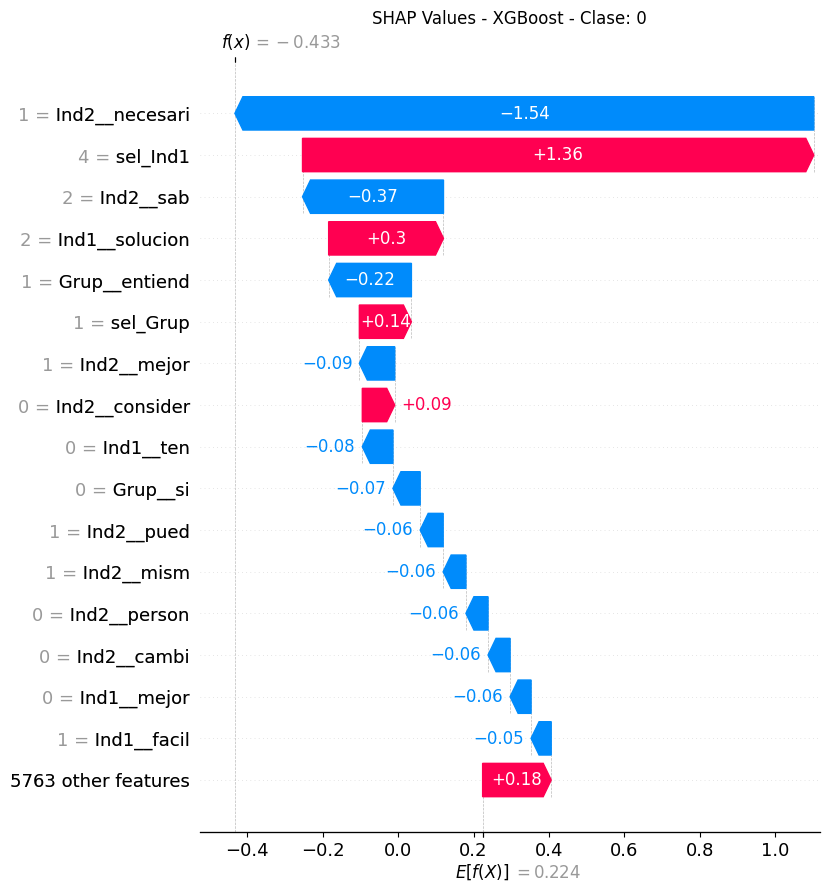

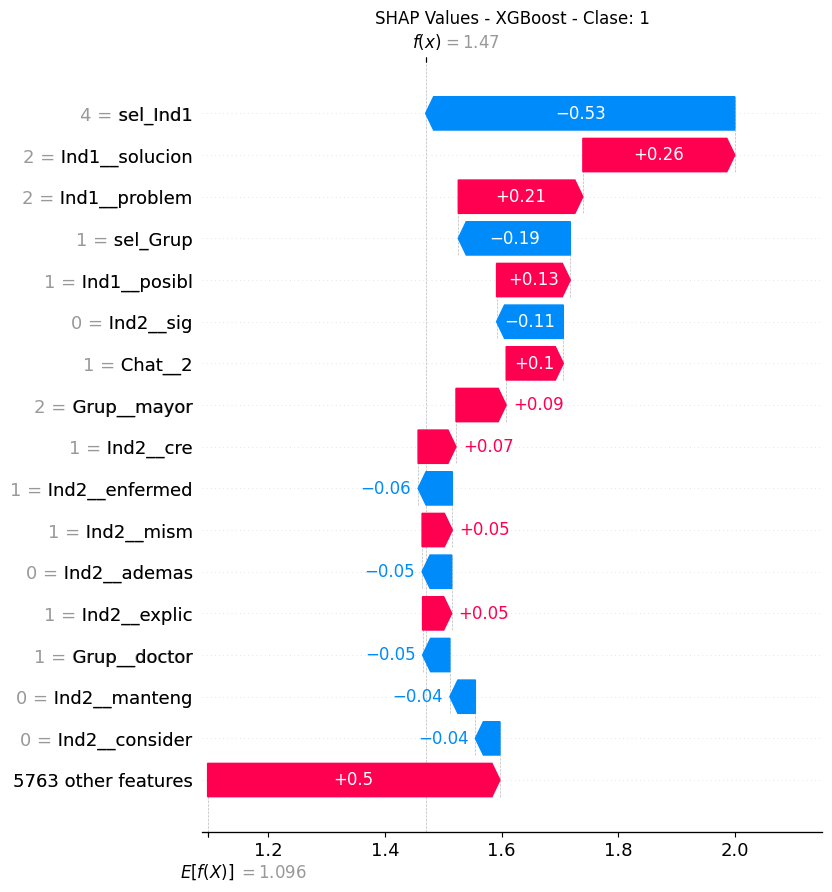

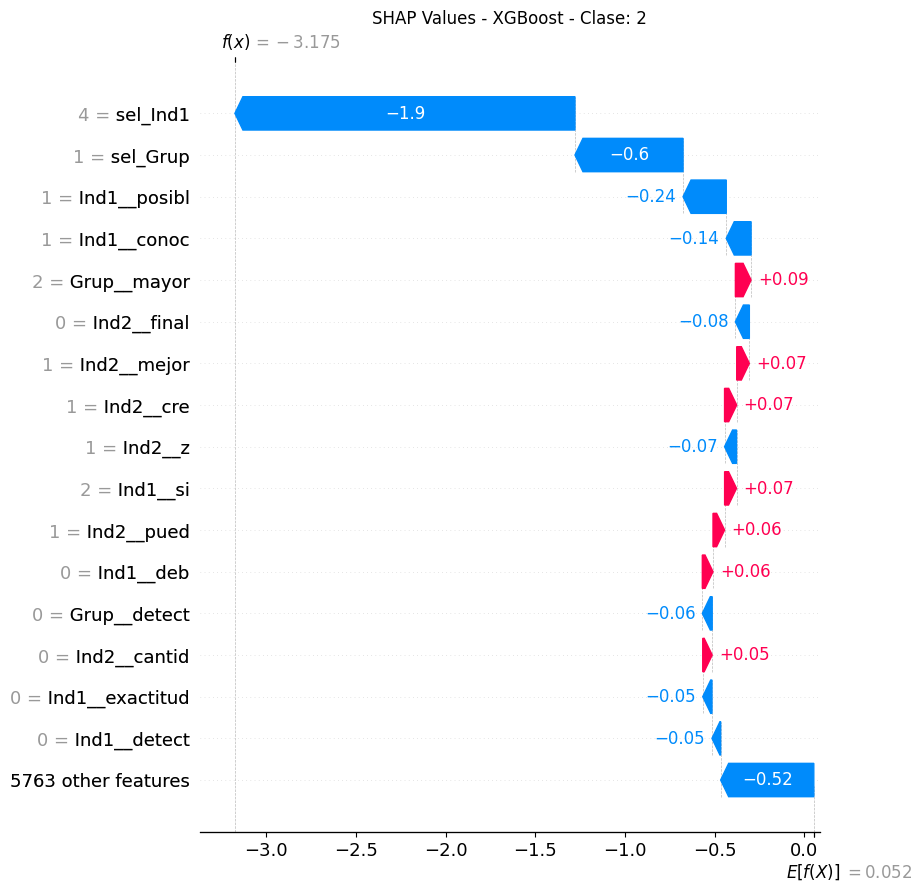

In [20]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 3. Quitar selección 1

In [21]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=False
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,3.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,1.0,1.0,0.0,0.0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
905,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [23]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA814A3ED0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA814A3ED0>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA814A3ED0>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA814A3ED0>),
                                 'summary')])

In [24]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 200}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 1, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.52      0.22      0.31        49
         0.0       0.52      0.80      0.63        90
         1.0       0.35      0.19      0.24        43

    accuracy                           0.50       182
   macro avg       0.46      0.40      0.40       182
weighted avg       0.48      0.50      0.45       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


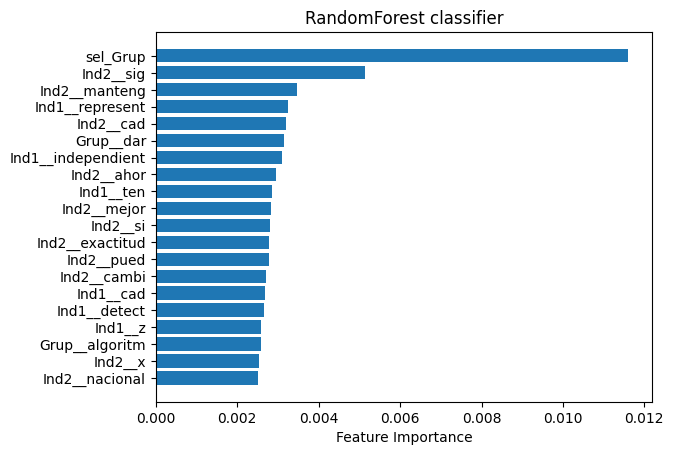

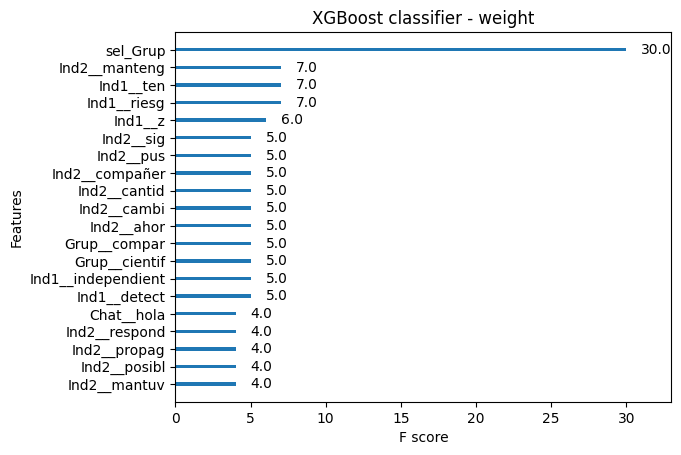

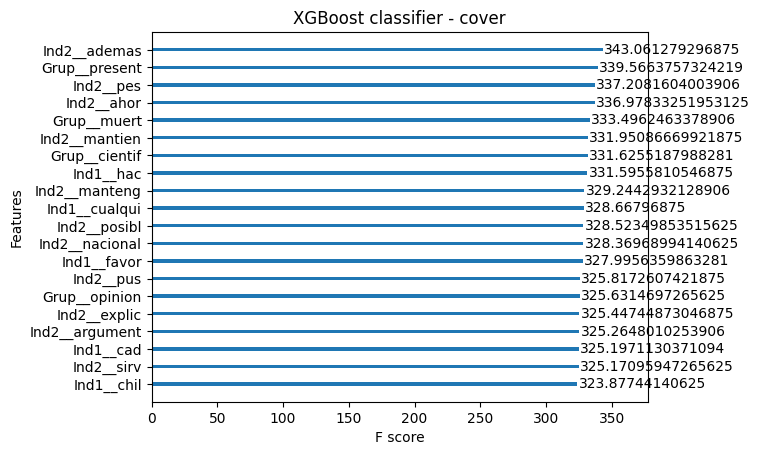

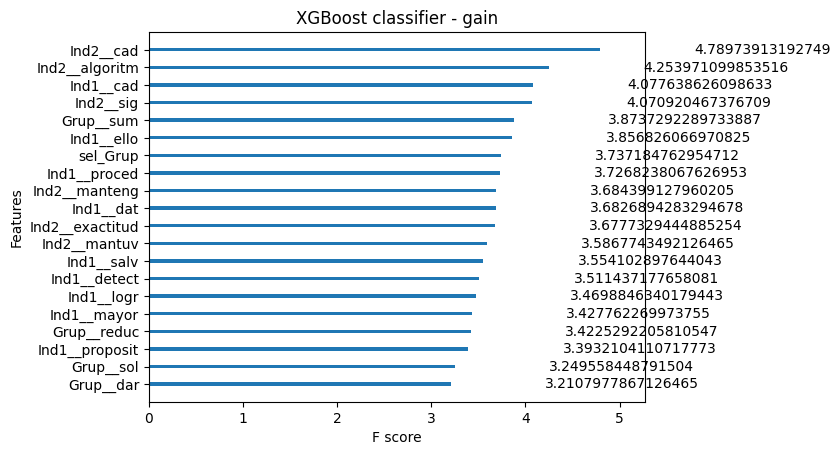

In [25]:
plot_importance_models(rf_best_model, xgb_best_model)

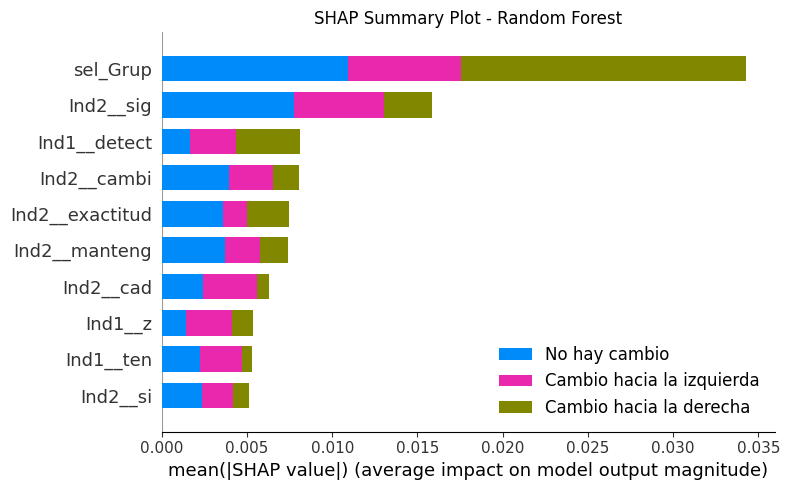

In [26]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[22:57:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


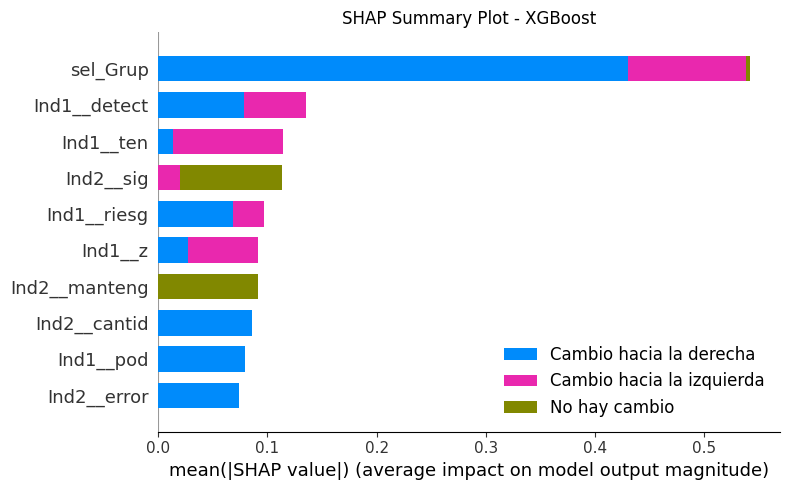

In [27]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

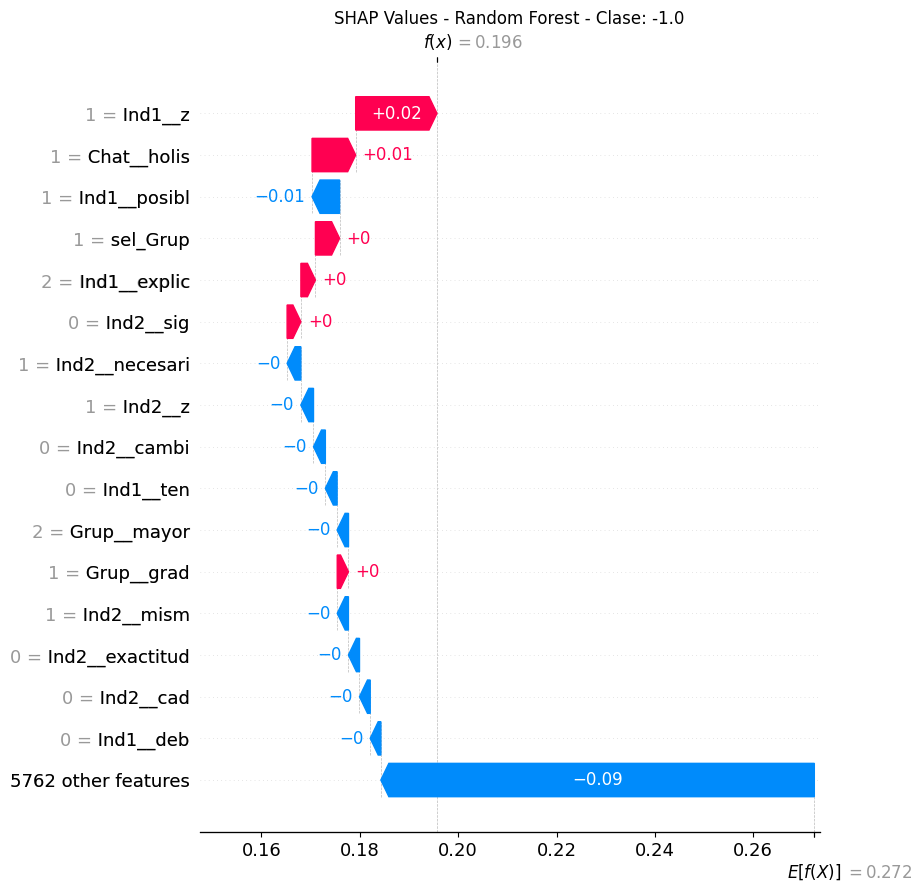

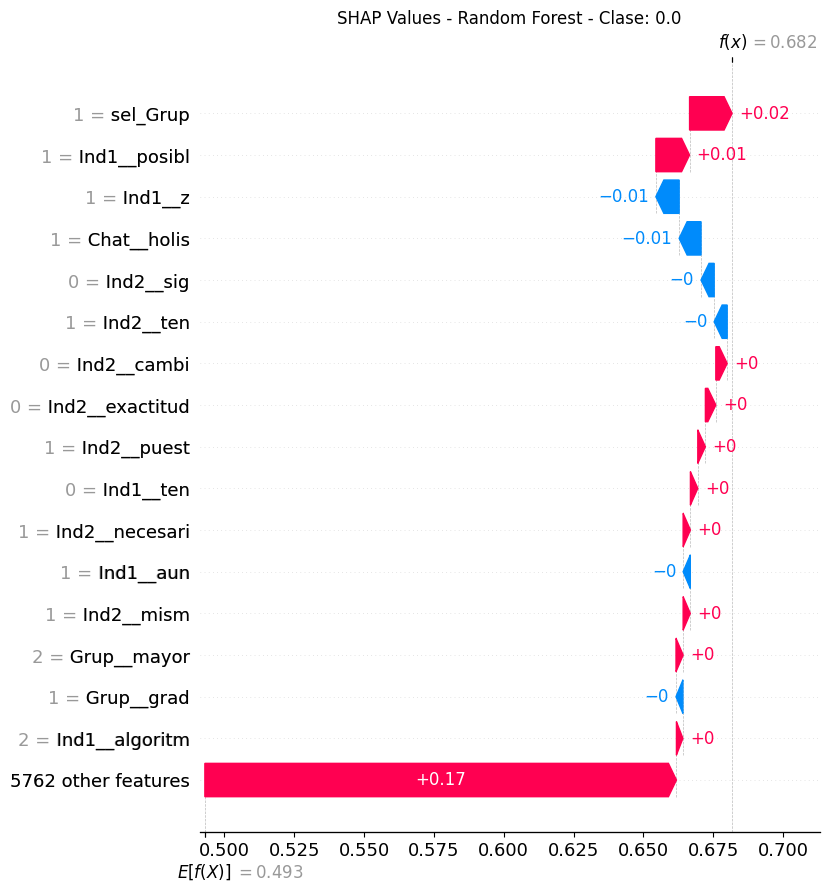

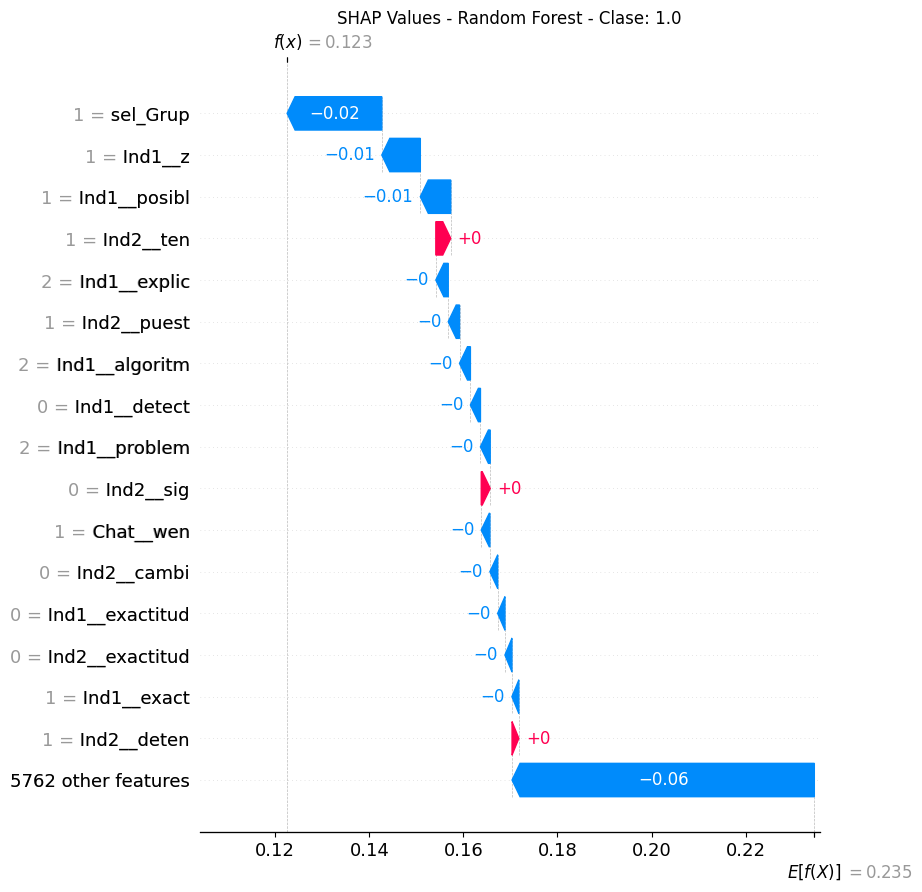

In [28]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[22:57:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


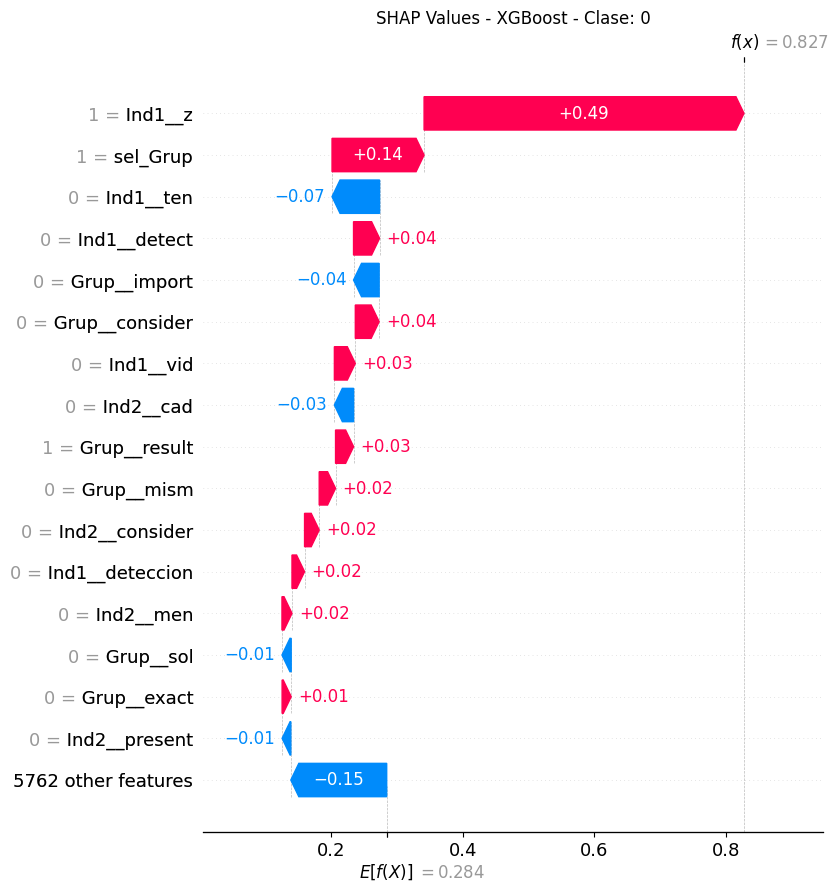

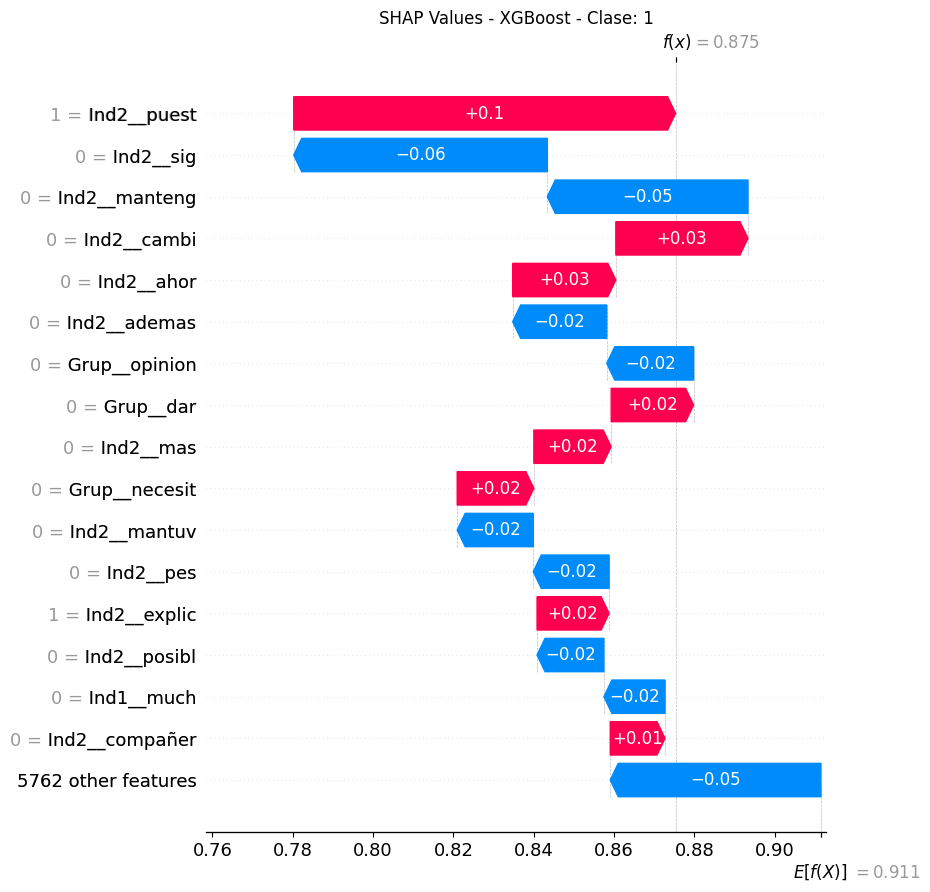

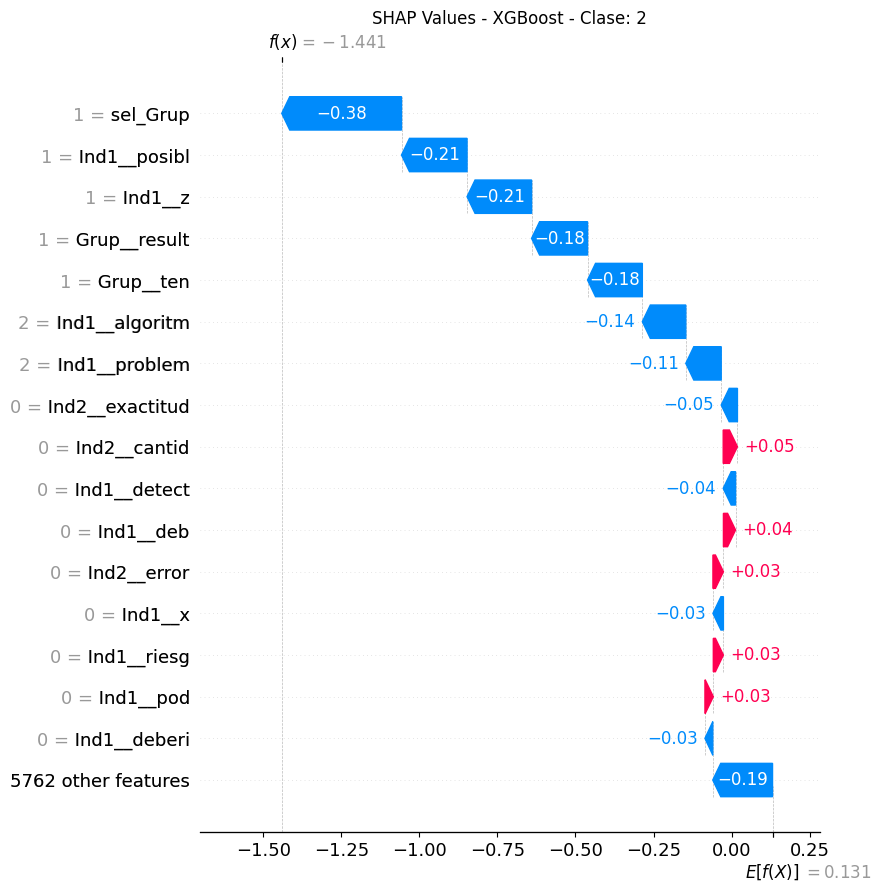

In [29]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 4. Quitar justificación individual 2

In [30]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=False, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
572,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
798,4.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
596,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
905,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
389,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
142,2.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
476,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [31]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [32]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD84D68D0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD84D68D0>),
                                 'comment_Grup'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD84D68D0>),
                                 'summary')])

In [33]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        49
         0.0       0.49      1.00      0.66        90
         1.0       0.00      0.00      0.00        43

    accuracy                           0.49       182
   macro avg       0.16      0.33      0.22       182
weighted avg       0.24      0.49      0.33       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.71      0.10      0.18        49
         0.0       0.51      0.98      0.67        90
         1.0       1.00      0.02      0.05        43

    accuracy                           0.52       182
   macro avg       0.74      0.37      0.30       182
weighted avg       0.68      0.52      0.39       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 1, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.71      0.69      0.70        49
         0.0       0.67      0.70      0.68        90
         1.0       0.68      0.63      0.65        43

    accuracy                           0.68       182
   macro avg       0.68      0.67      0.68       182
weighted avg       0.68      0.68      0.68       182



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


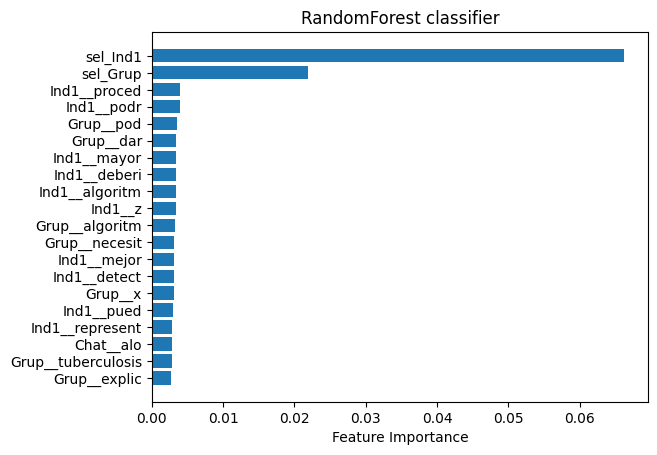

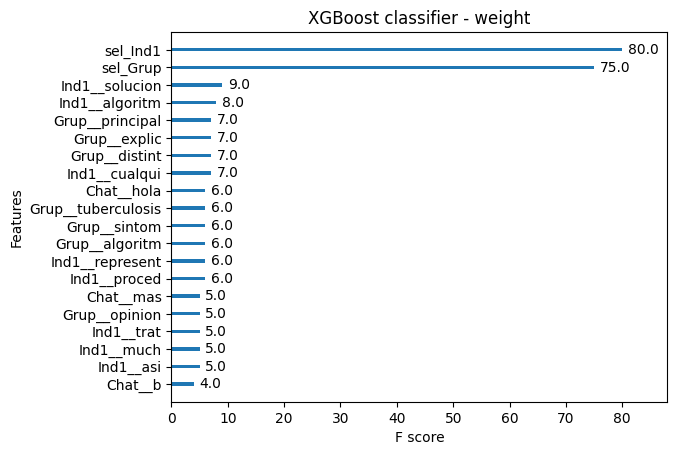

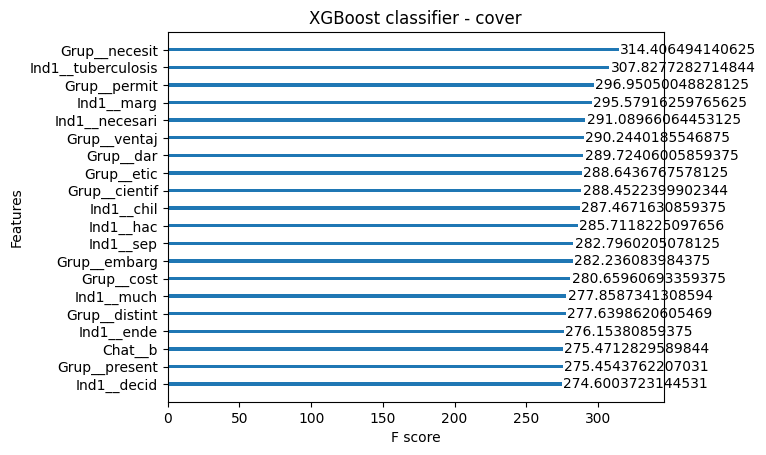

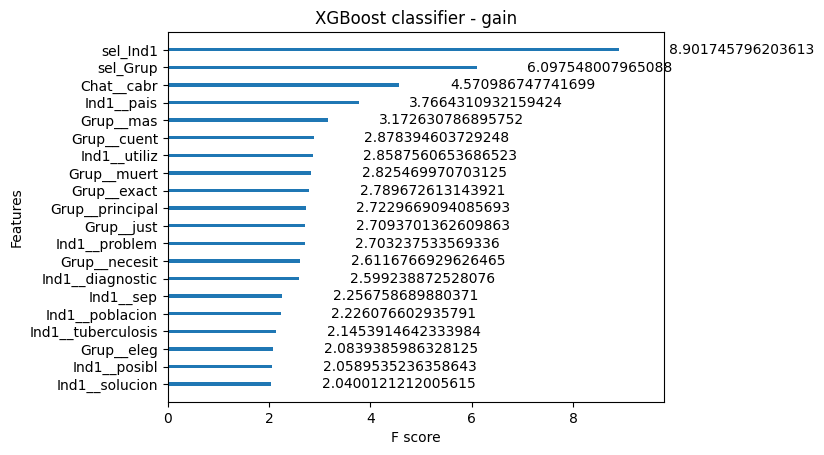

In [34]:
plot_importance_models(rf_best_model, xgb_best_model)

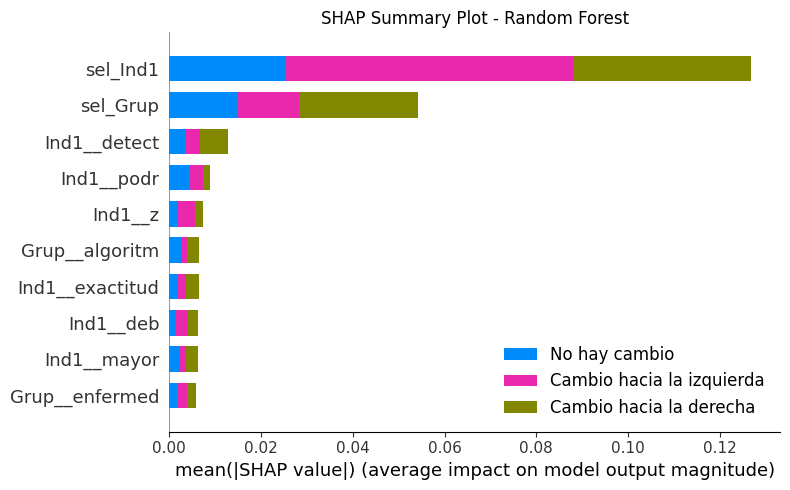

In [35]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest')

[23:00:32] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


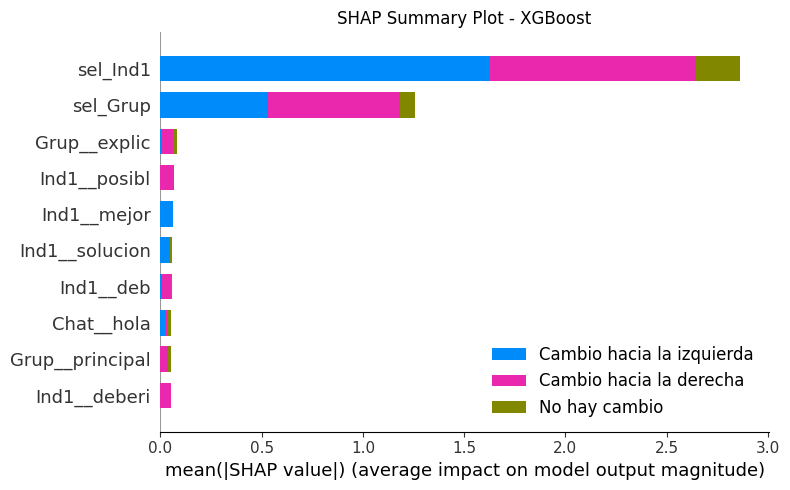

In [36]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost')

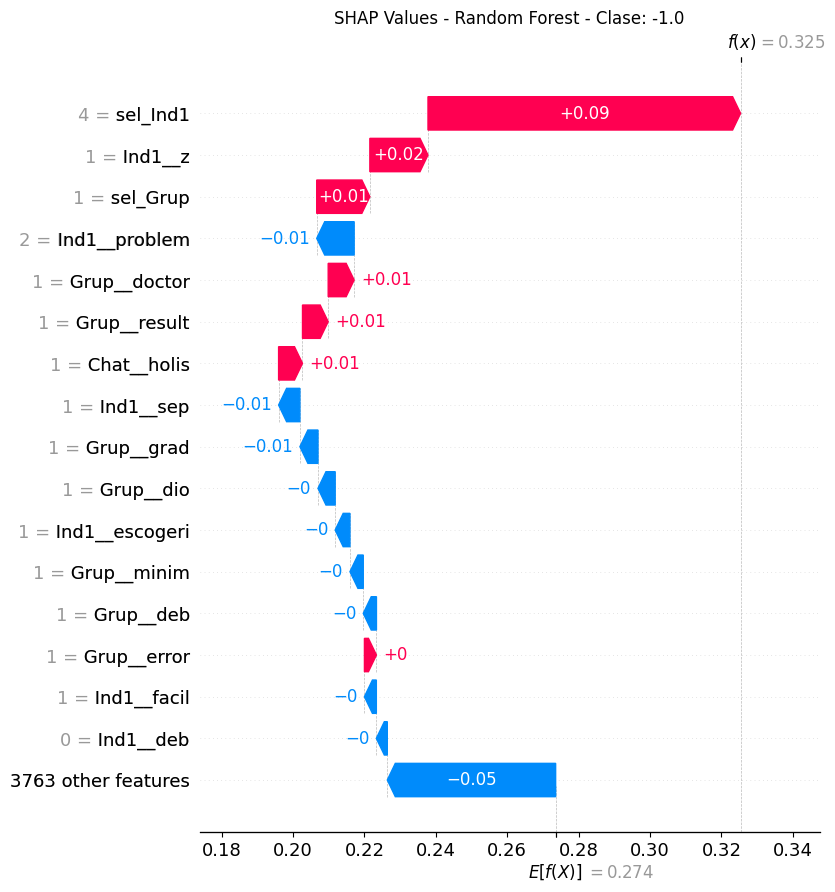

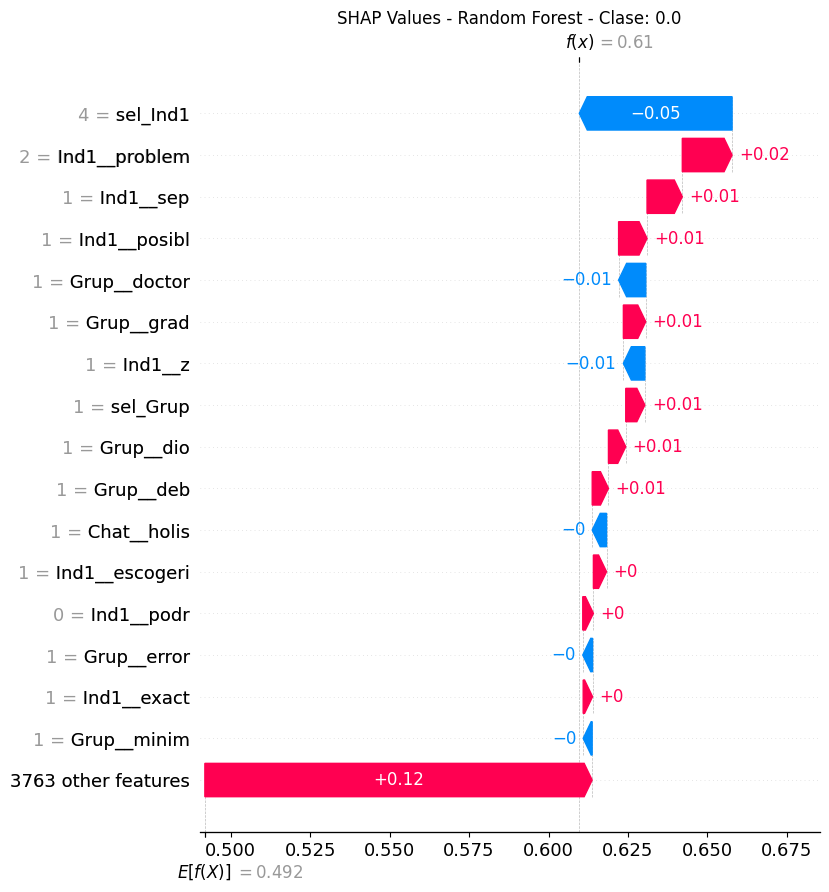

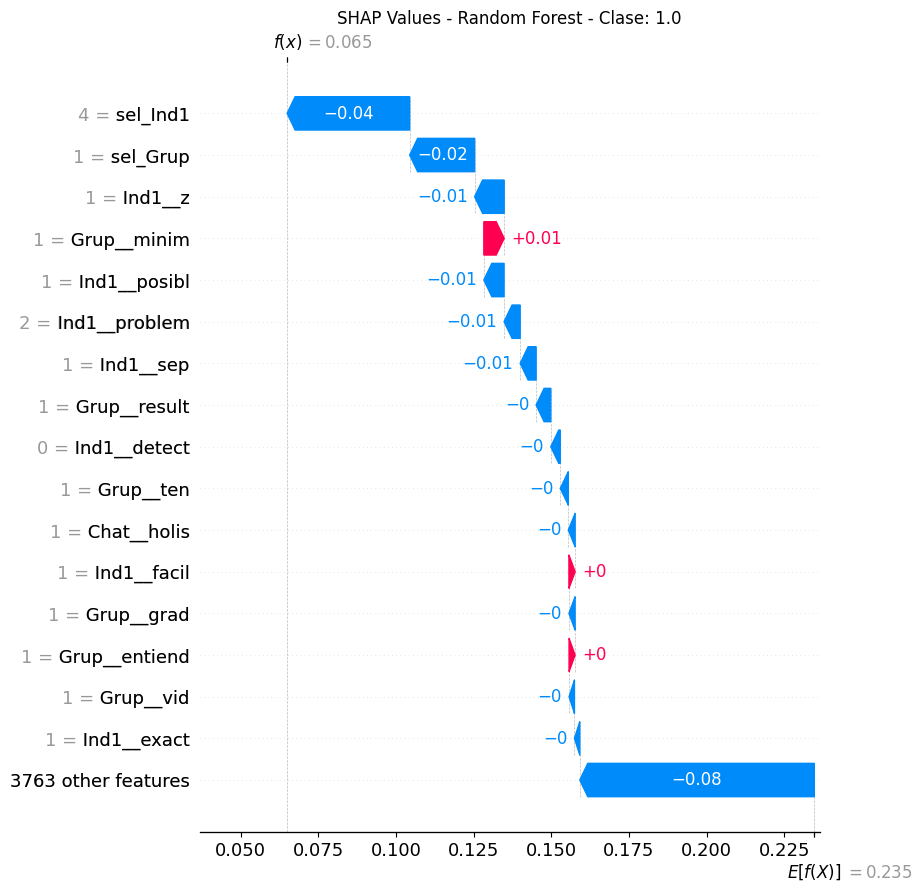

In [37]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:00:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


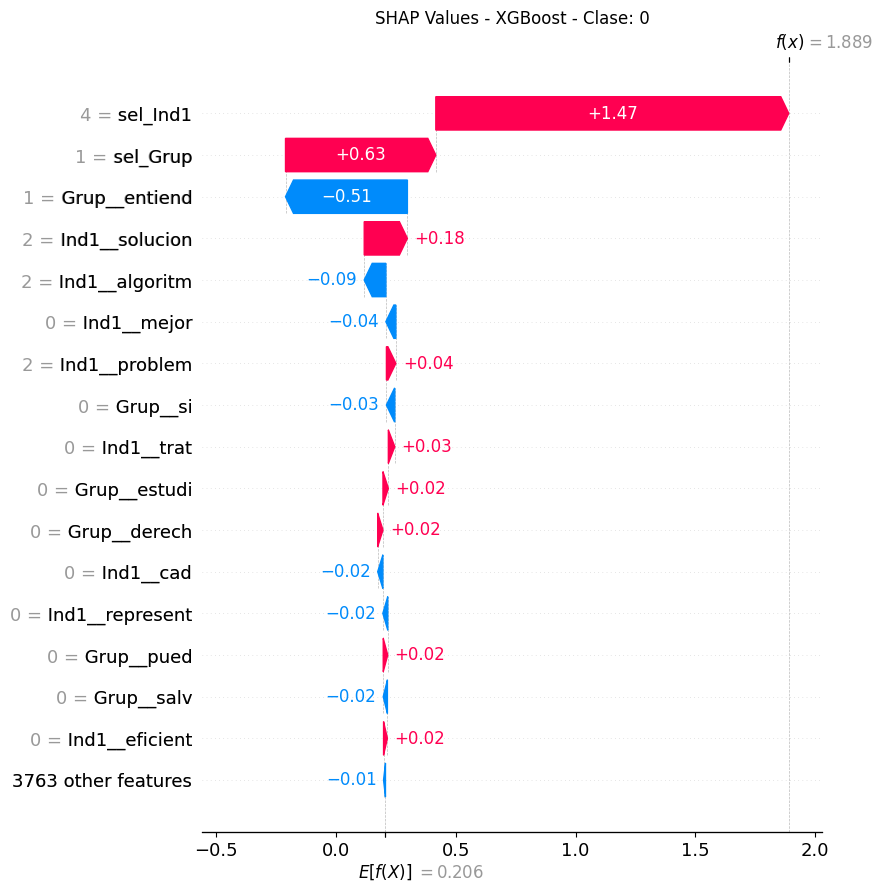

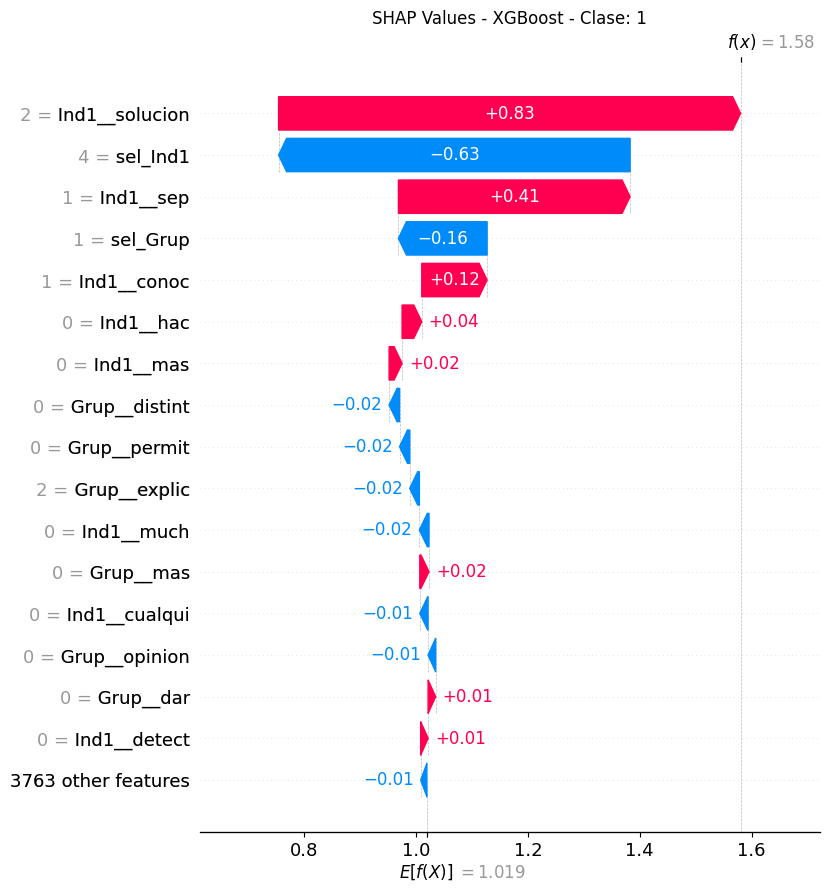

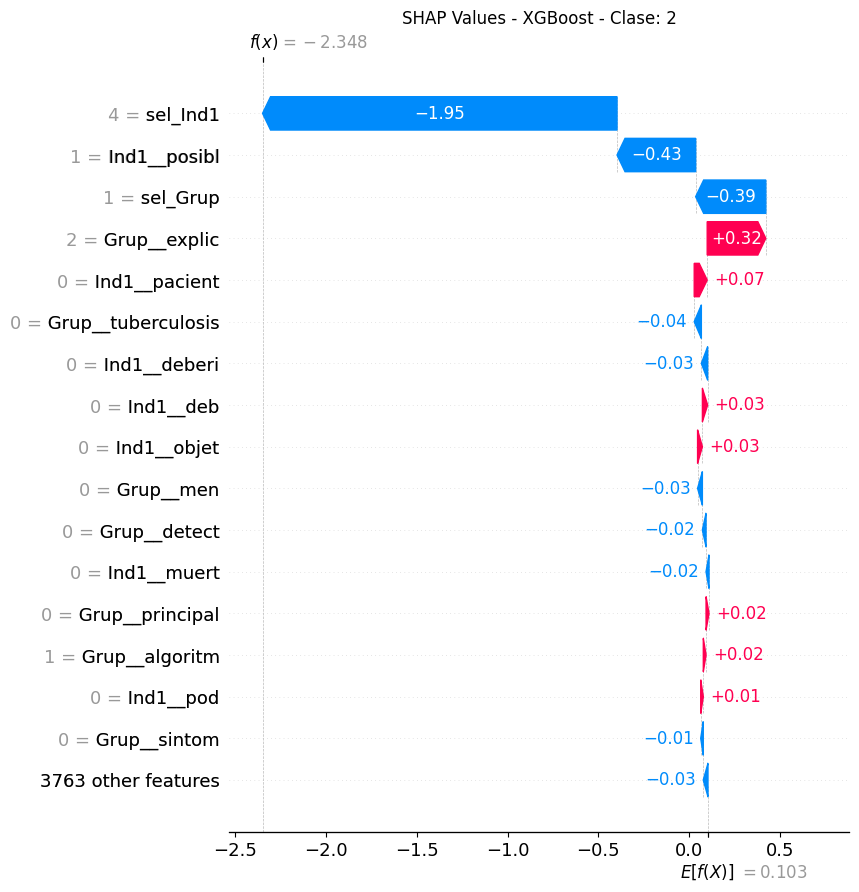

In [38]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

# Diferencial 1

In [39]:
dataset = pd.read_csv(f'dataset_{caso}_1.csv')

## Modelo base

In [40]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=False, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,Ind1__2,Ind1__3,Ind1__39,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [41]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2'])])

In [42]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAE98CA0D0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAE98CA0D0>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAE98CA0D0>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAE98CA0D0>),
                                 'summary')])

In [43]:
df_train

,sel_Ind1,sel_Grup,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,Ind1__2,Ind1__3,Ind1__39,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [44]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.33      0.05      0.08        22
         0.0       0.53      0.95      0.68        44
         1.0       1.00      0.06      0.11        17

    accuracy                           0.53        83
   macro avg       0.62      0.35      0.29        83
weighted avg       0.58      0.53      0.41        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 5, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.76      0.86      0.81        22
         0.0       0.68      0.68      0.68        44
         1.0       0.43      0.35      0.39        17

    accuracy                           0.66        83
   macro avg       0.62      0.63      0.63        83
weighted avg       0.65      0.66      0.66        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


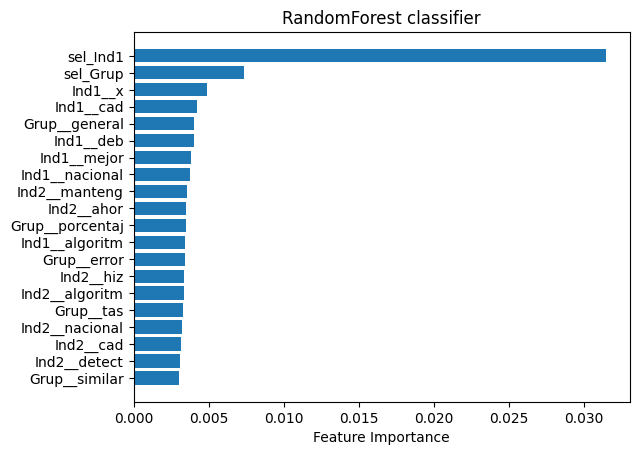

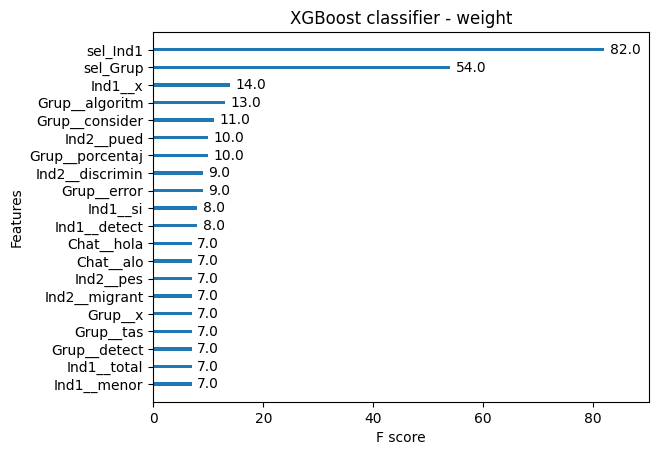

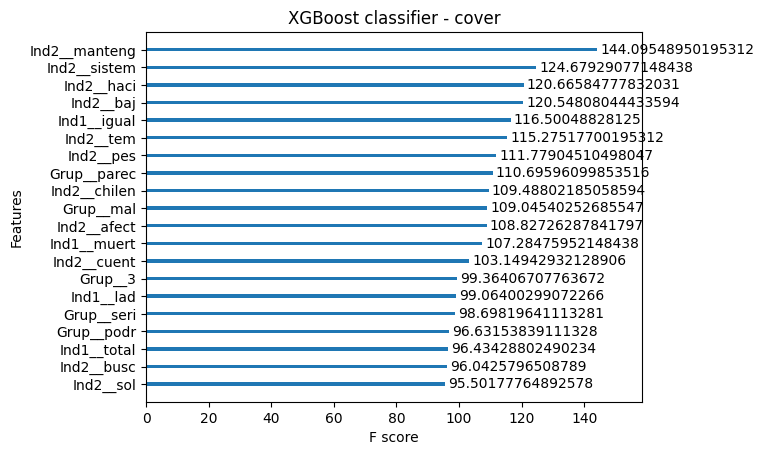

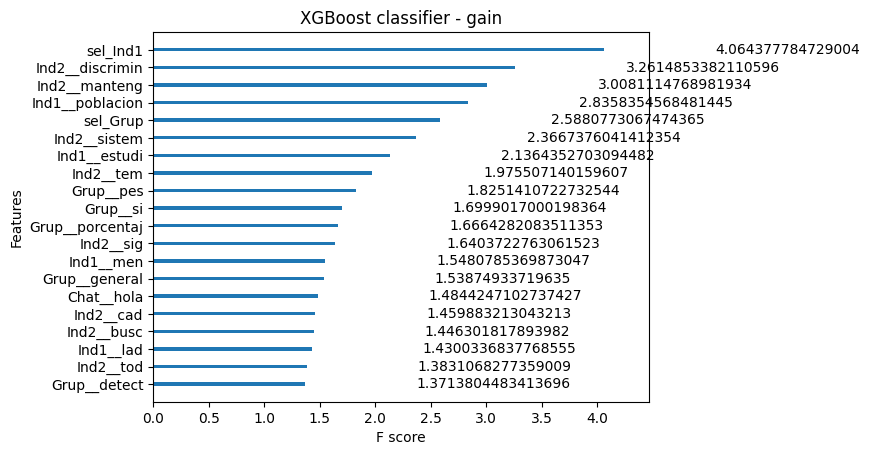

In [45]:
plot_importance_models(rf_best_model, xgb_best_model)

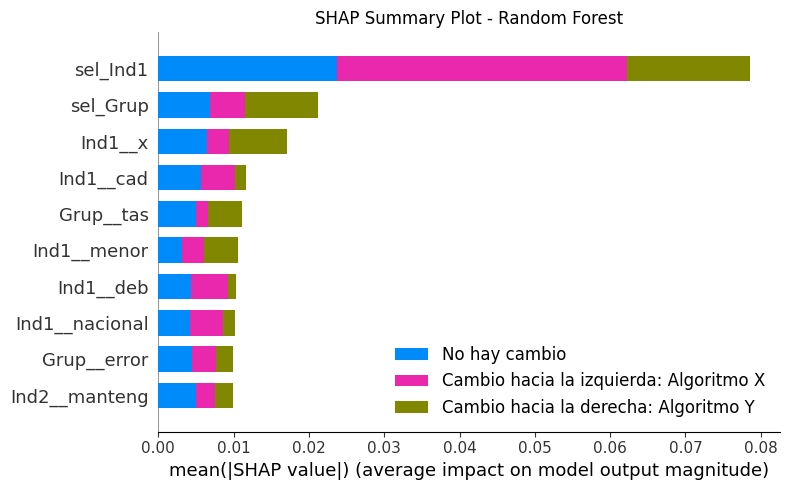

In [46]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[23:02:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


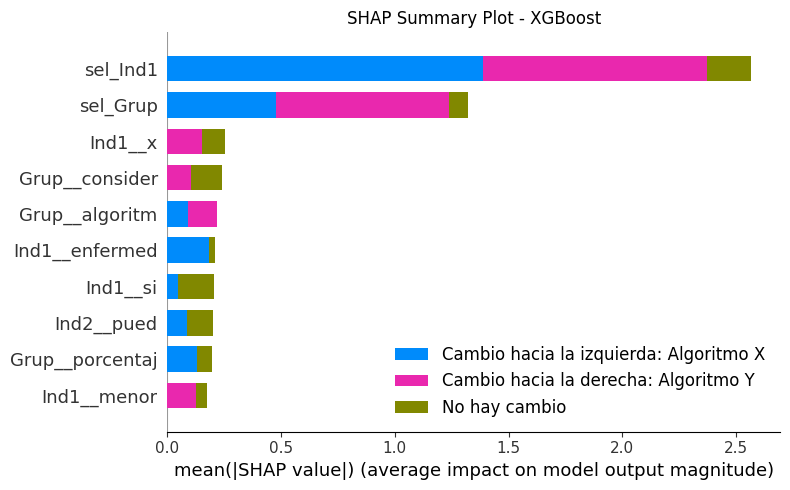

In [47]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

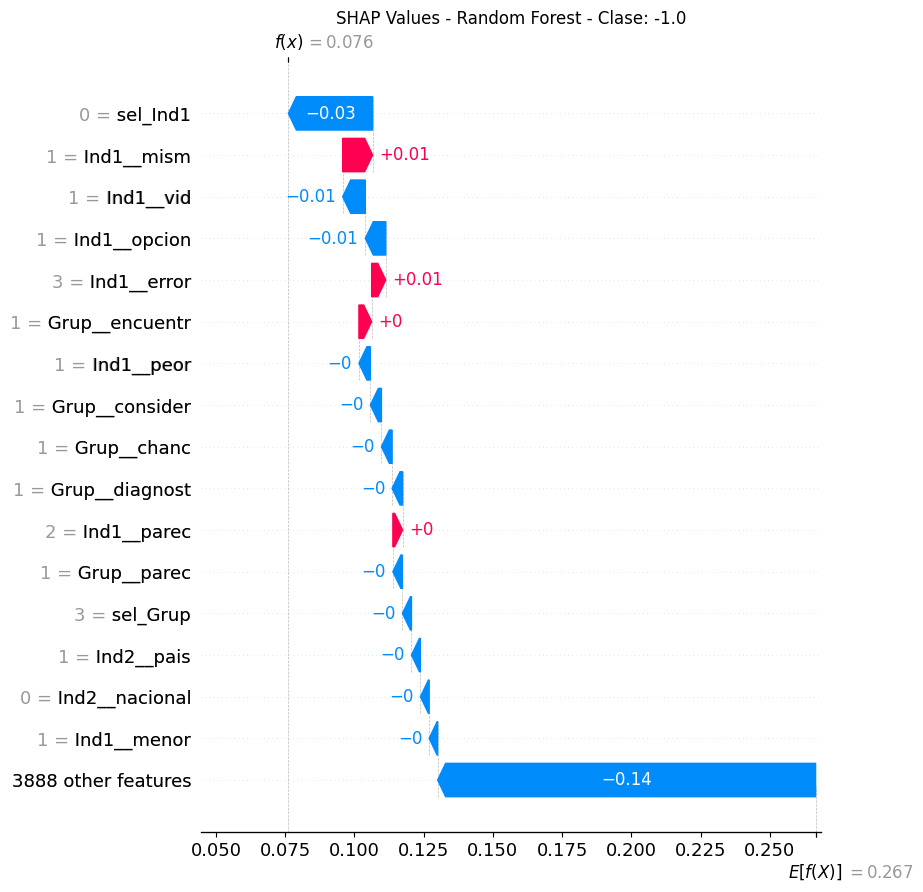

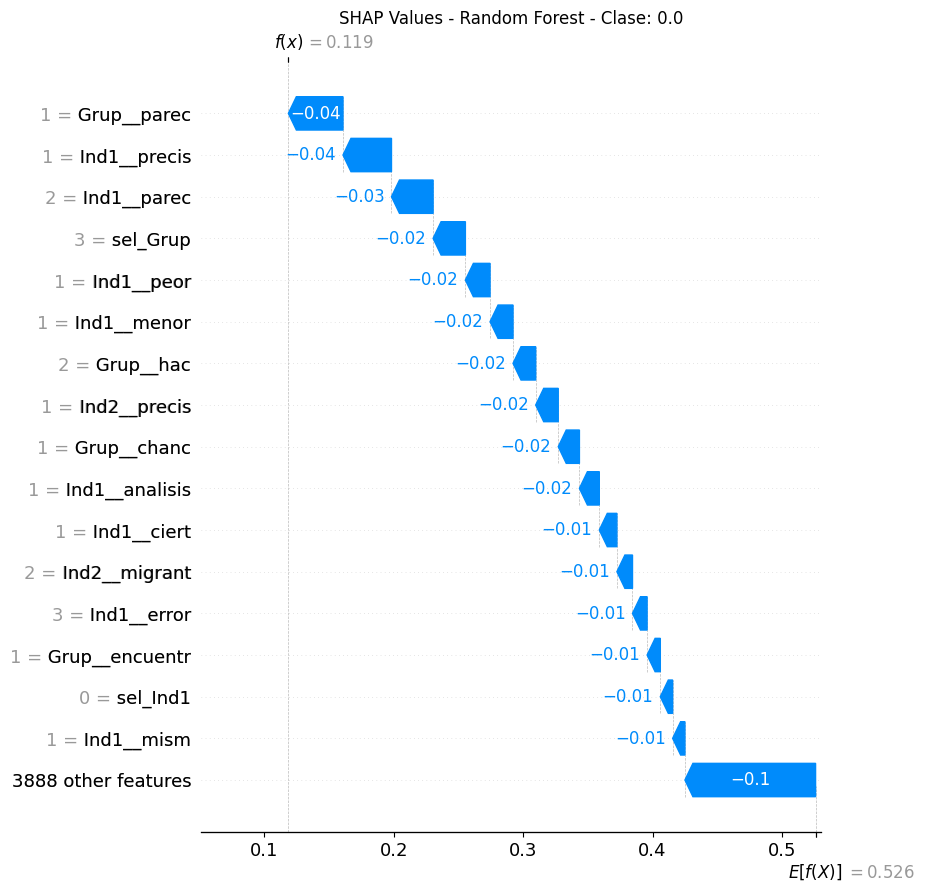

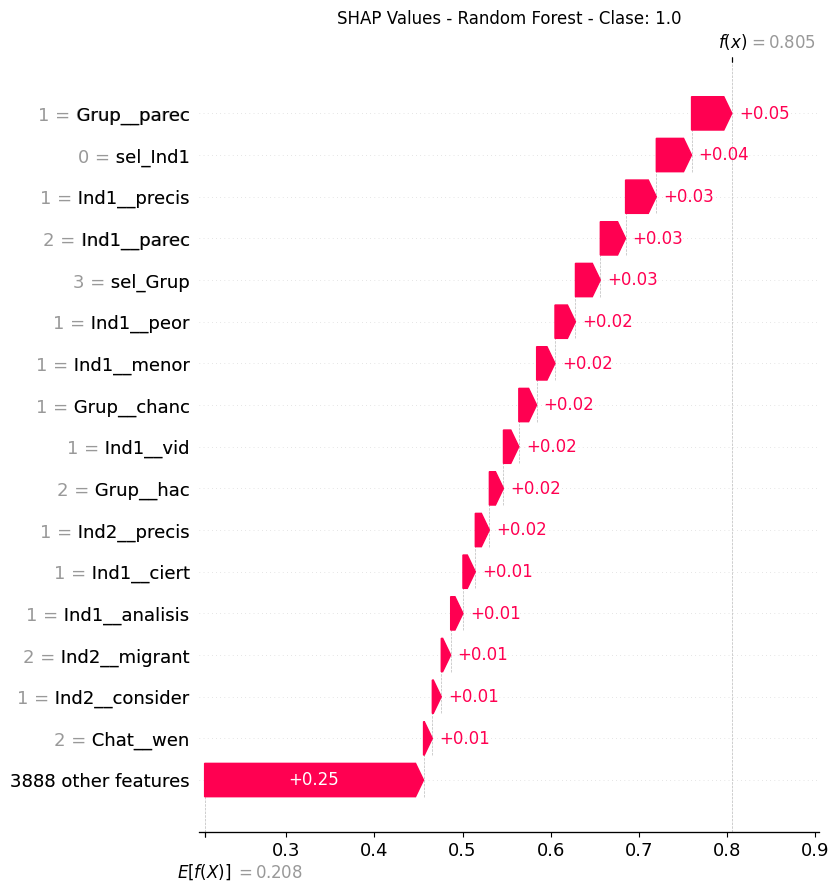

In [48]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:02:48] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


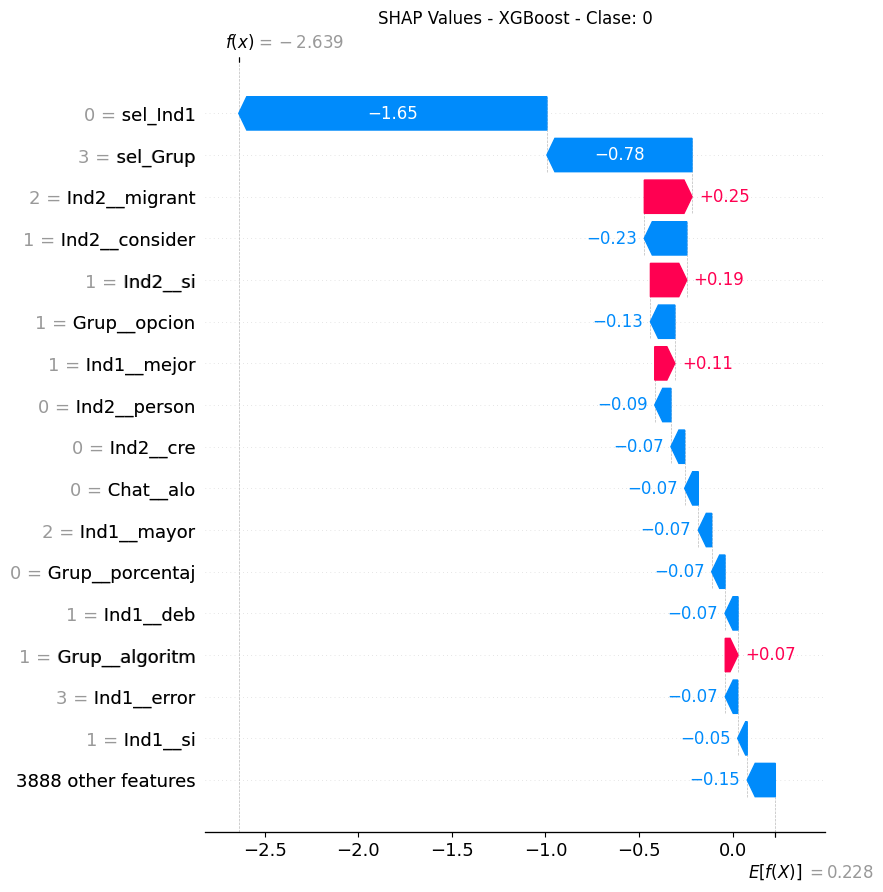

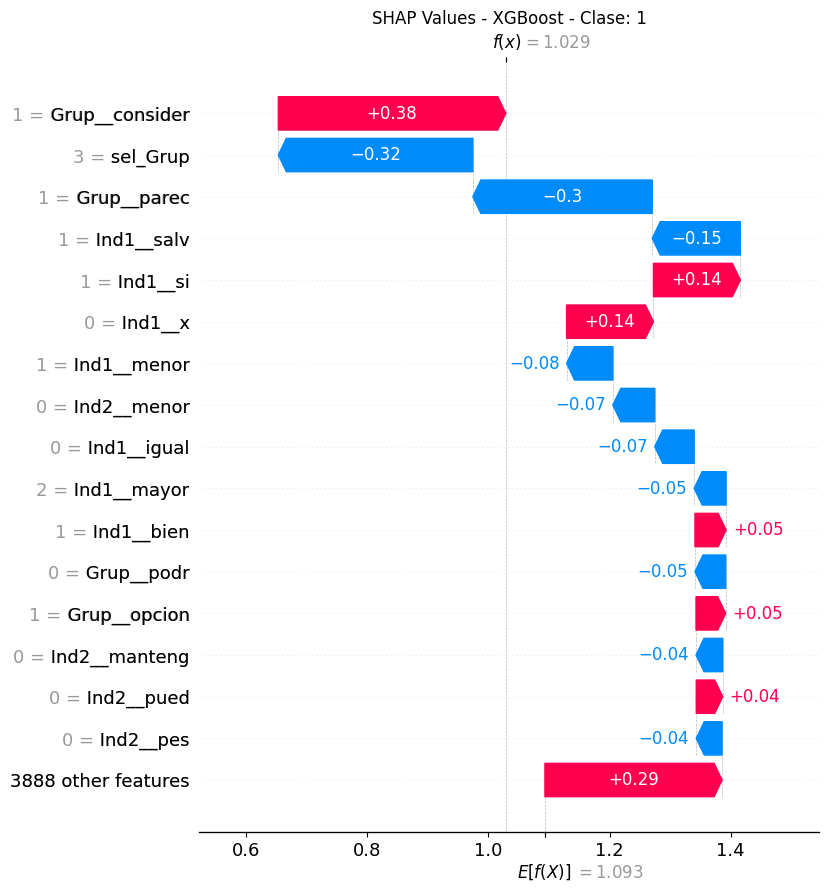

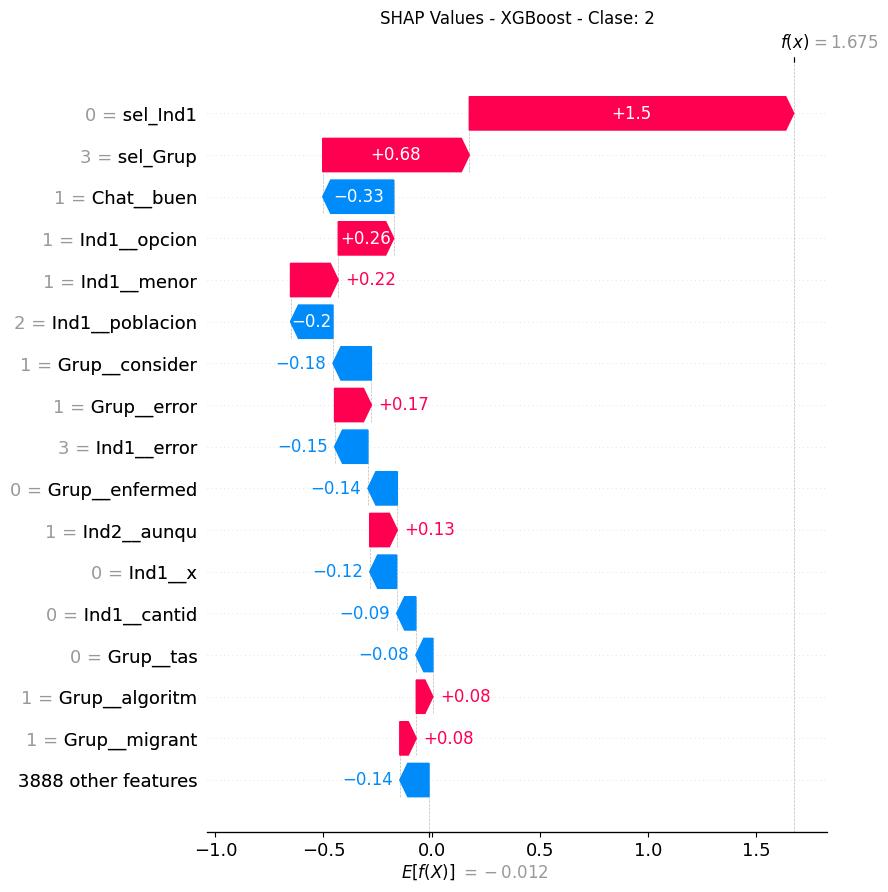

In [49]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 2. Agregar género

In [50]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [52]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7FBA790>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7FBA790>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7FBA790>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7FBA790>),
                                 'summary')])

In [53]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 3, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.64      0.73      0.68        22
         0.0       0.64      0.68      0.66        44
         1.0       0.55      0.35      0.43        17

    accuracy                           0.63        83
   macro avg       0.61      0.59      0.59        83
weighted avg       0.62      0.63      0.62        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


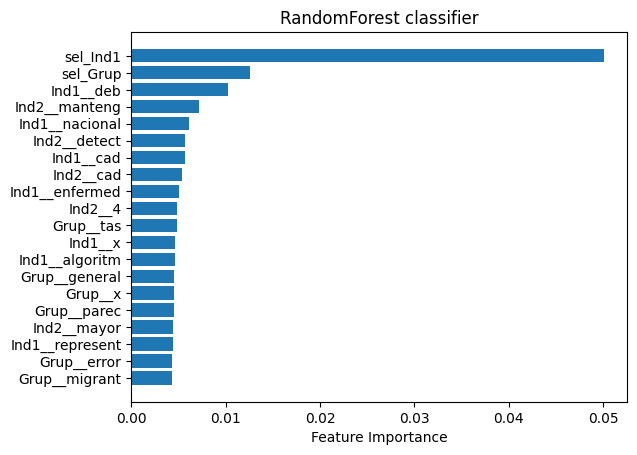

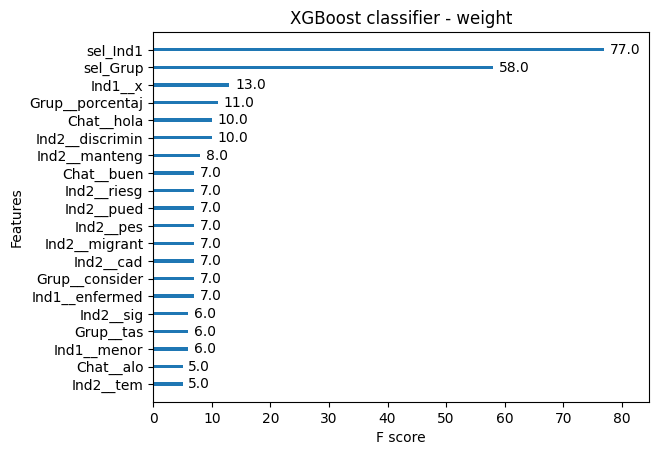

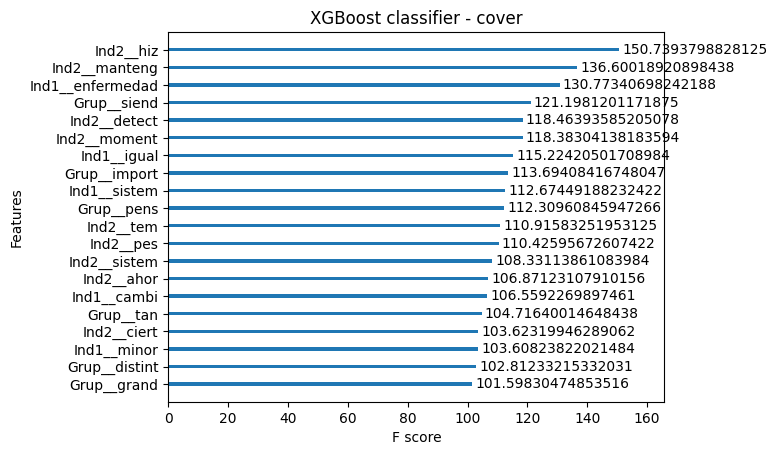

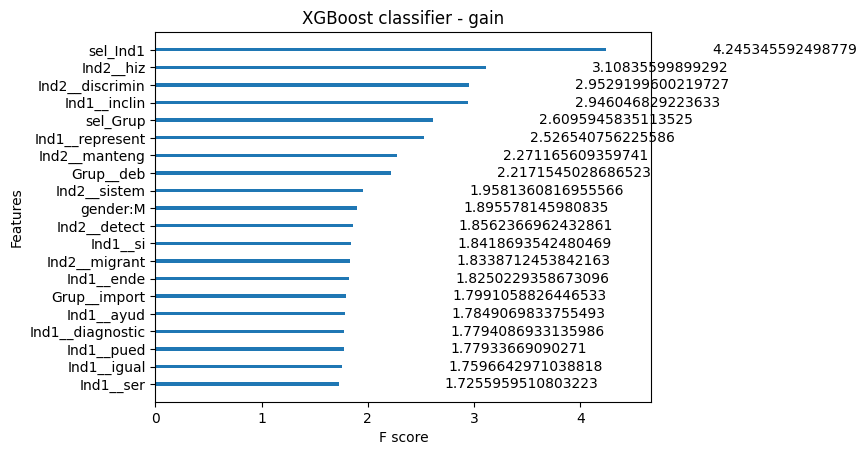

In [54]:
plot_importance_models(rf_best_model, xgb_best_model)

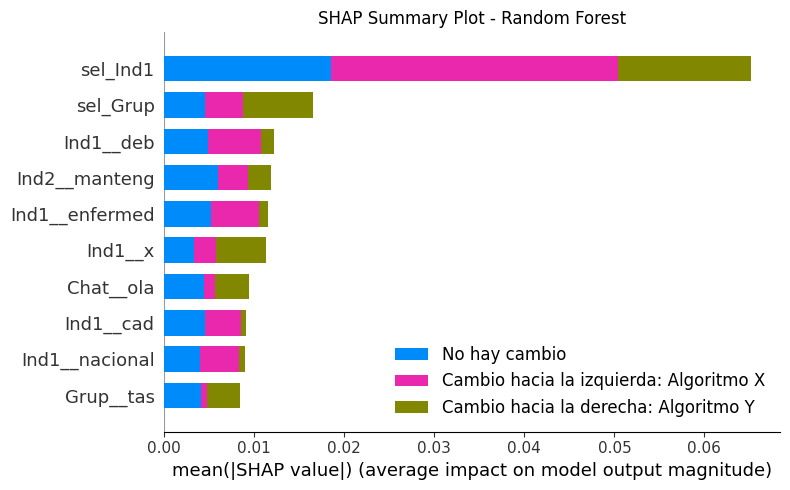

In [55]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[23:04:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


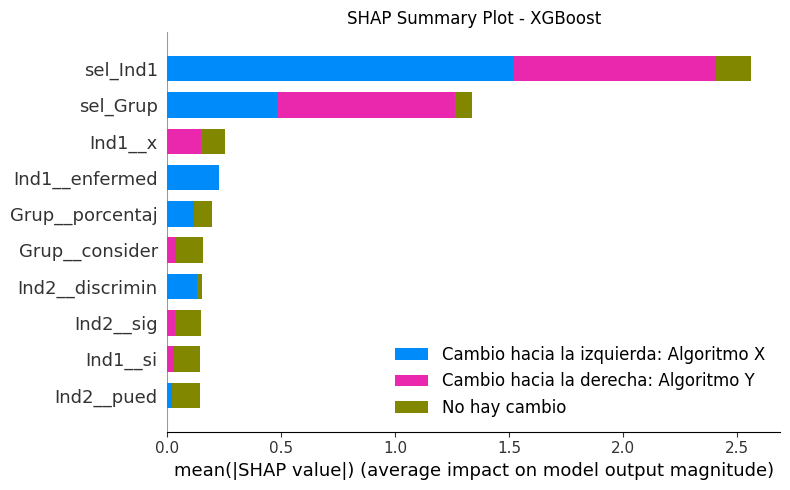

In [56]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

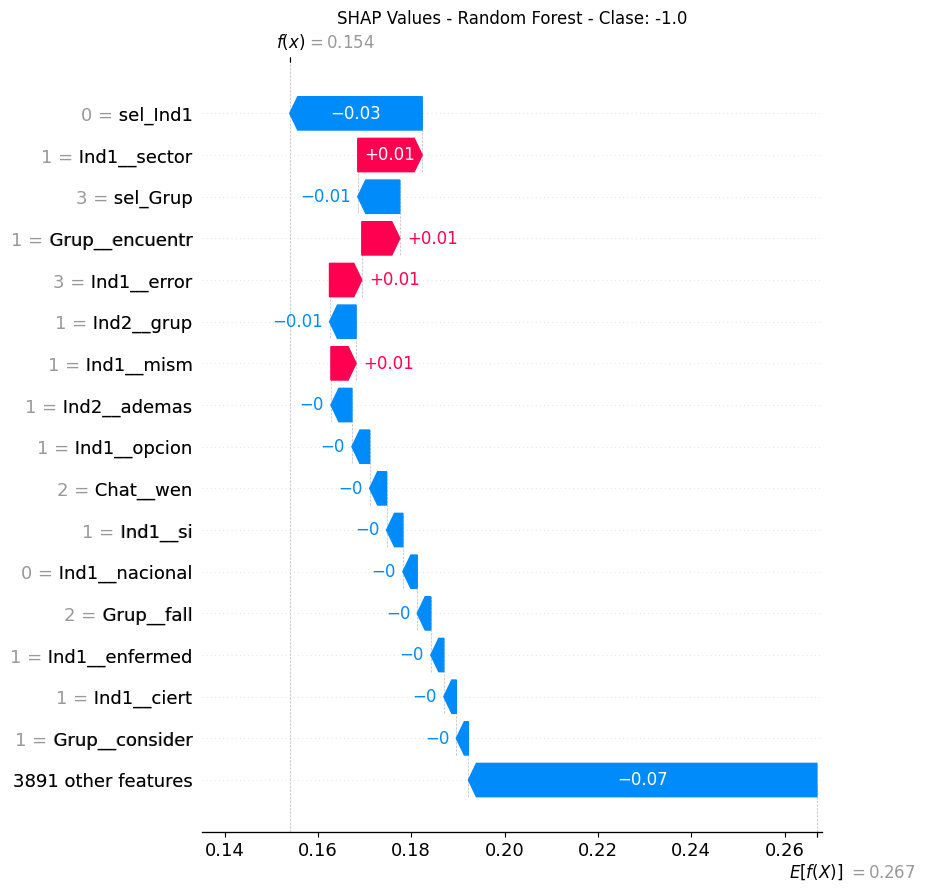

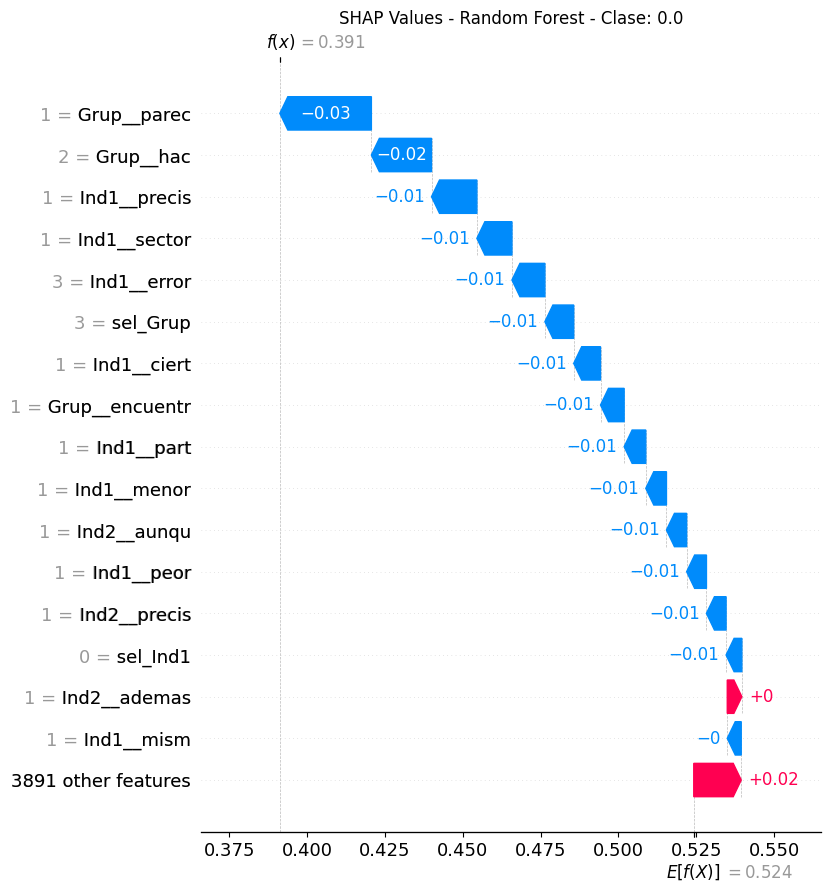

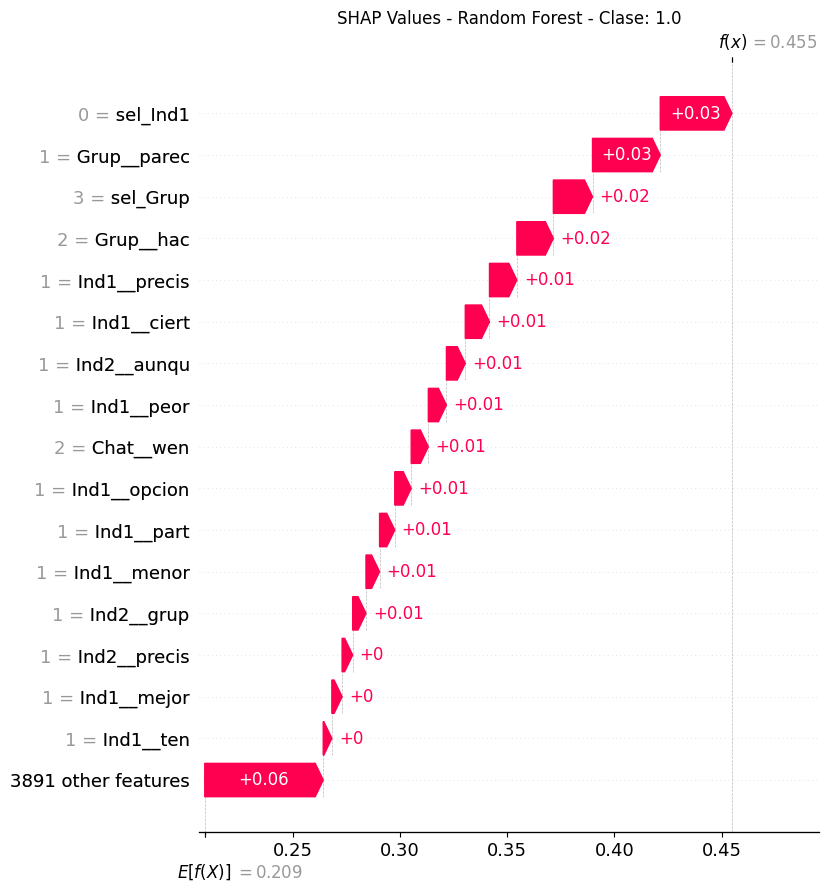

In [57]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:04:45] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


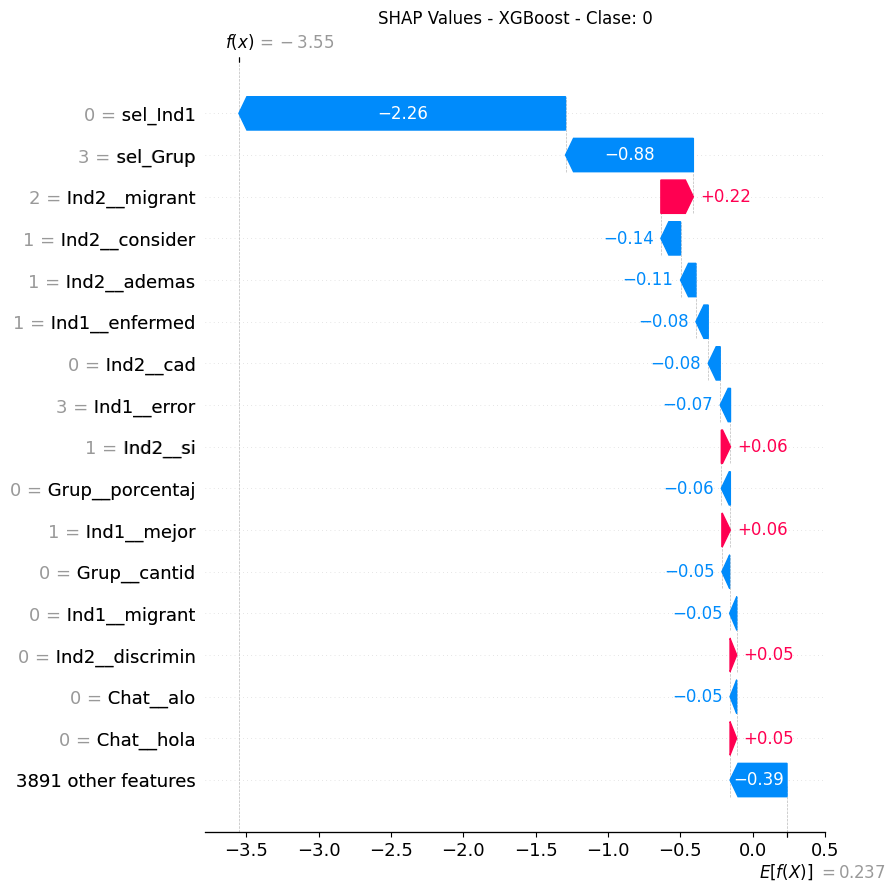

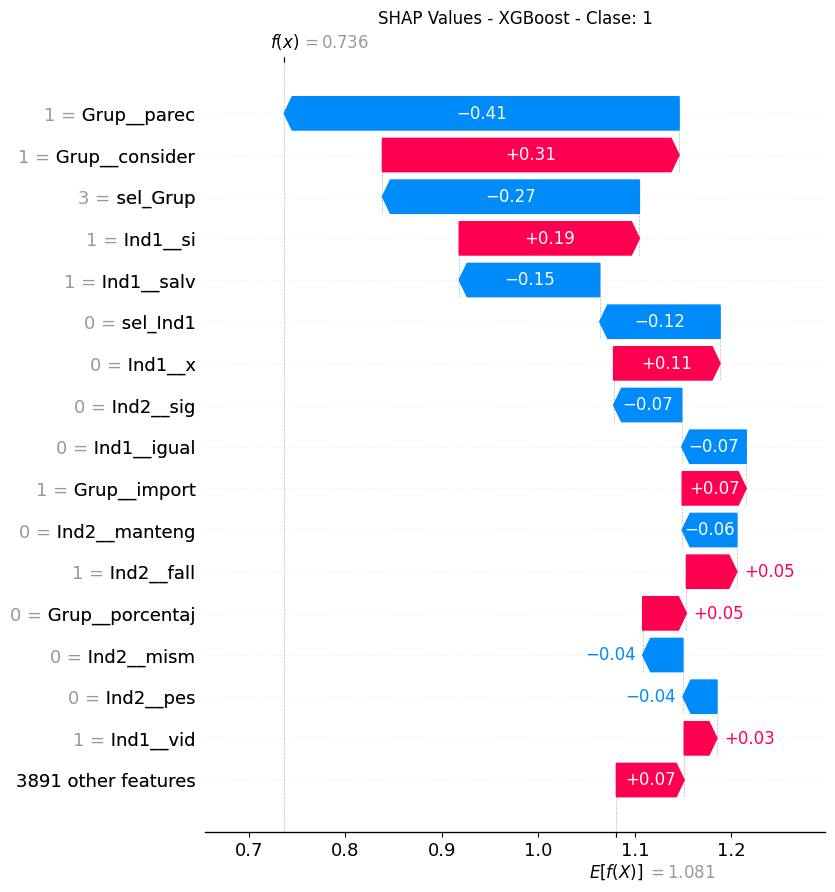

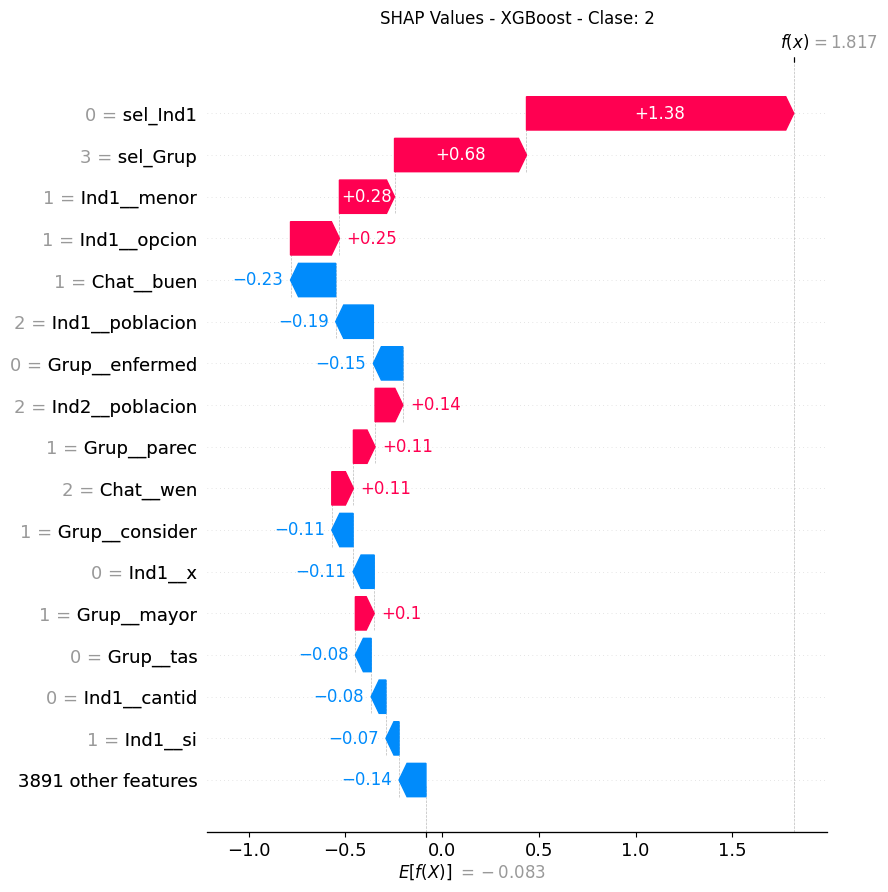

In [58]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 3. Quitar selección 1

In [59]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=False
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,Ind1__2,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,3.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,1.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,0.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,4.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,3.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [60]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [61]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA829CE290>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA829CE290>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA829CE290>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA829CE290>),
                                 'summary')])

In [62]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.52      0.98      0.68        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.52        83
   macro avg       0.17      0.33      0.23        83
weighted avg       0.28      0.52      0.36        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 20, 'min_child_weight': 3, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.39      0.32      0.35        22
         0.0       0.51      0.68      0.58        44
         1.0       0.17      0.06      0.09        17

    accuracy                           0.46        83
   macro avg       0.35      0.35      0.34        83
weighted avg       0.41      0.46      0.42        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


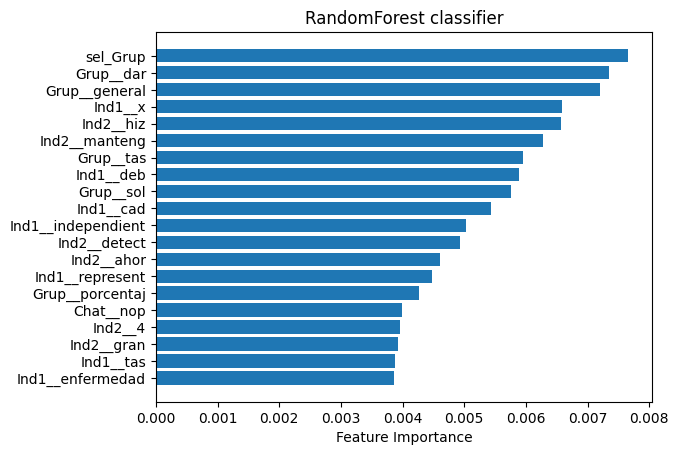

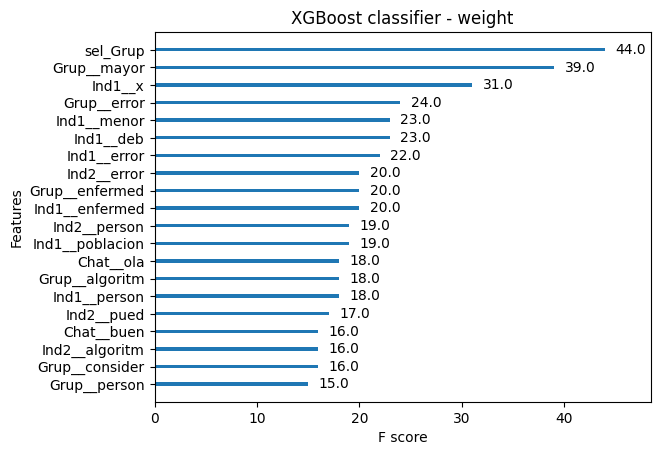

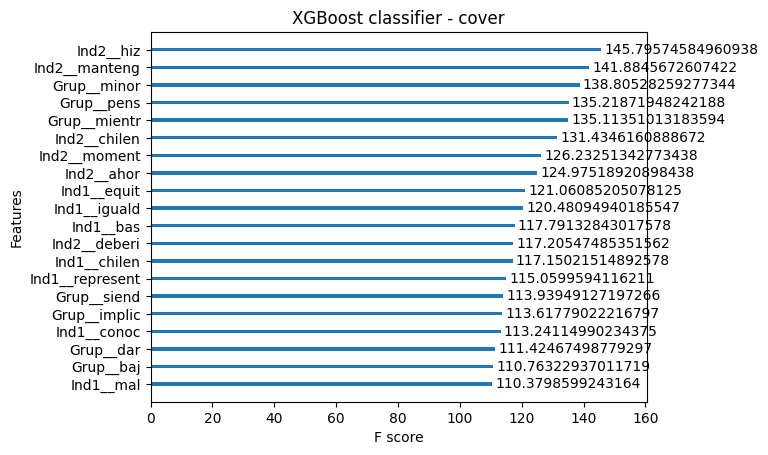

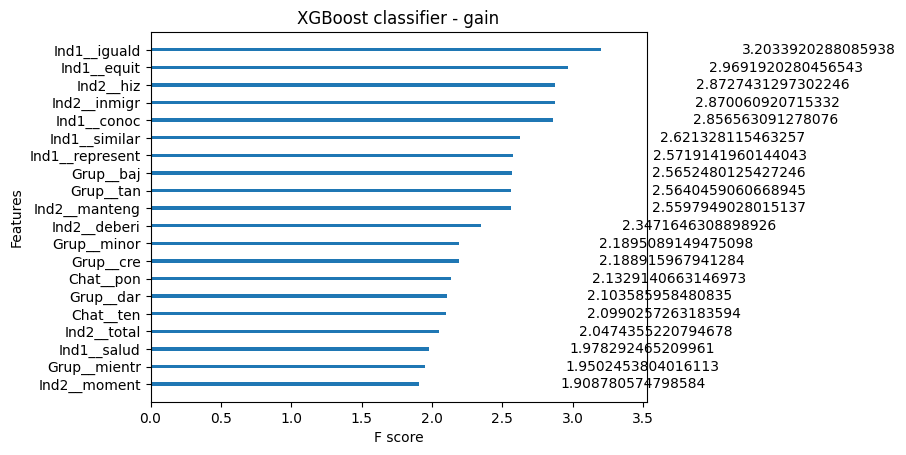

In [63]:
plot_importance_models(rf_best_model, xgb_best_model)

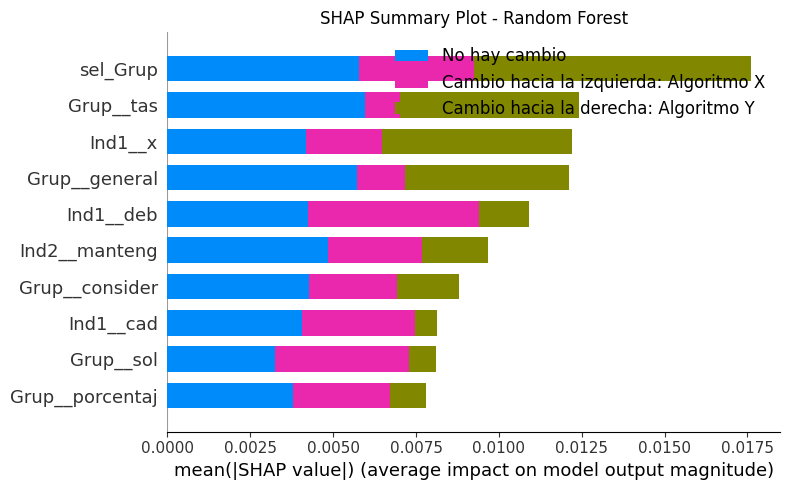

In [64]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[23:06:36] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


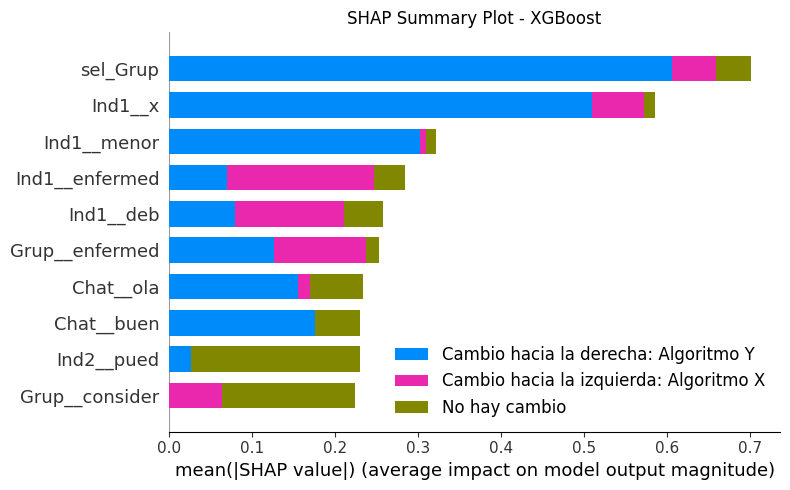

In [65]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

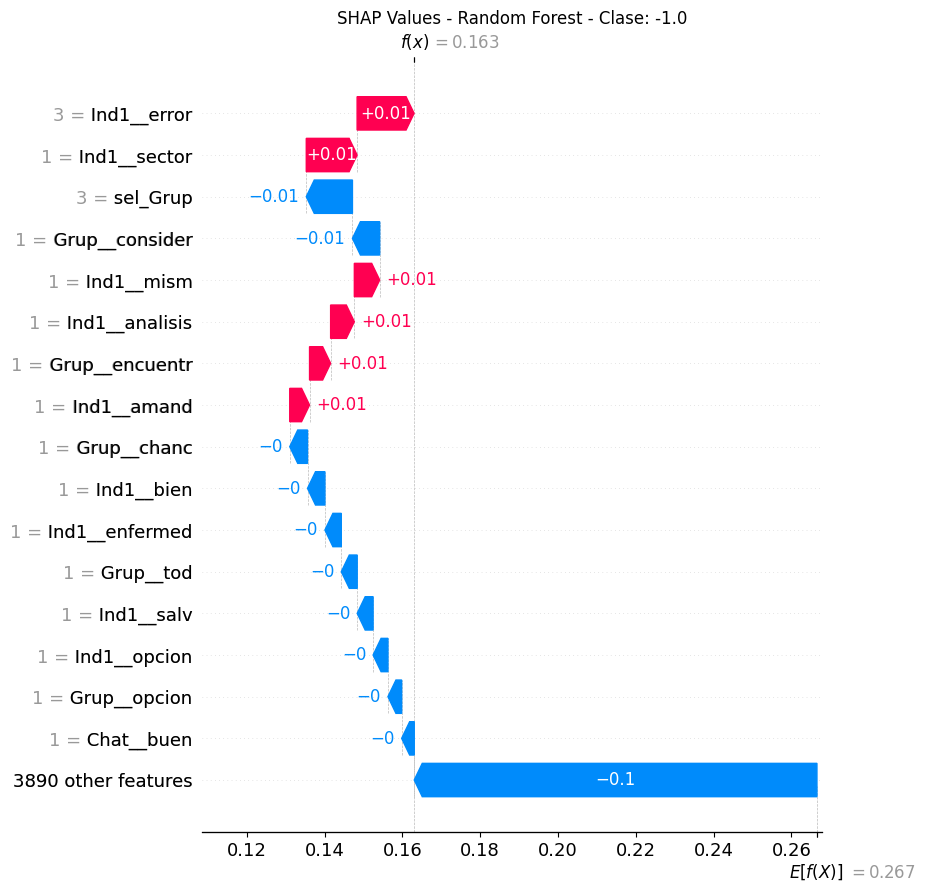

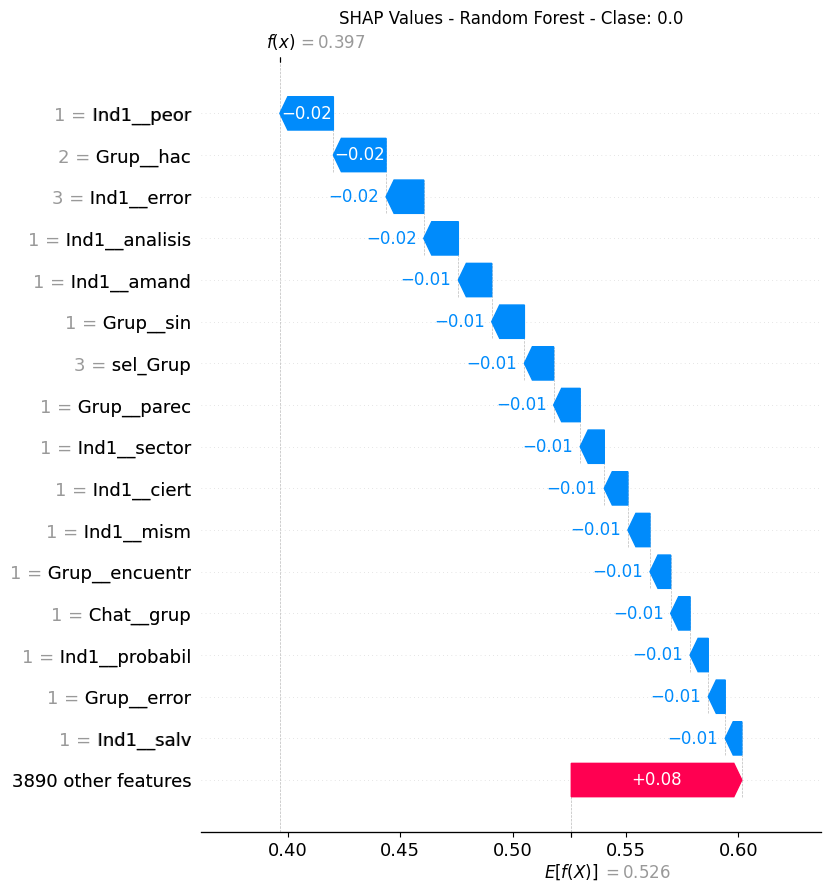

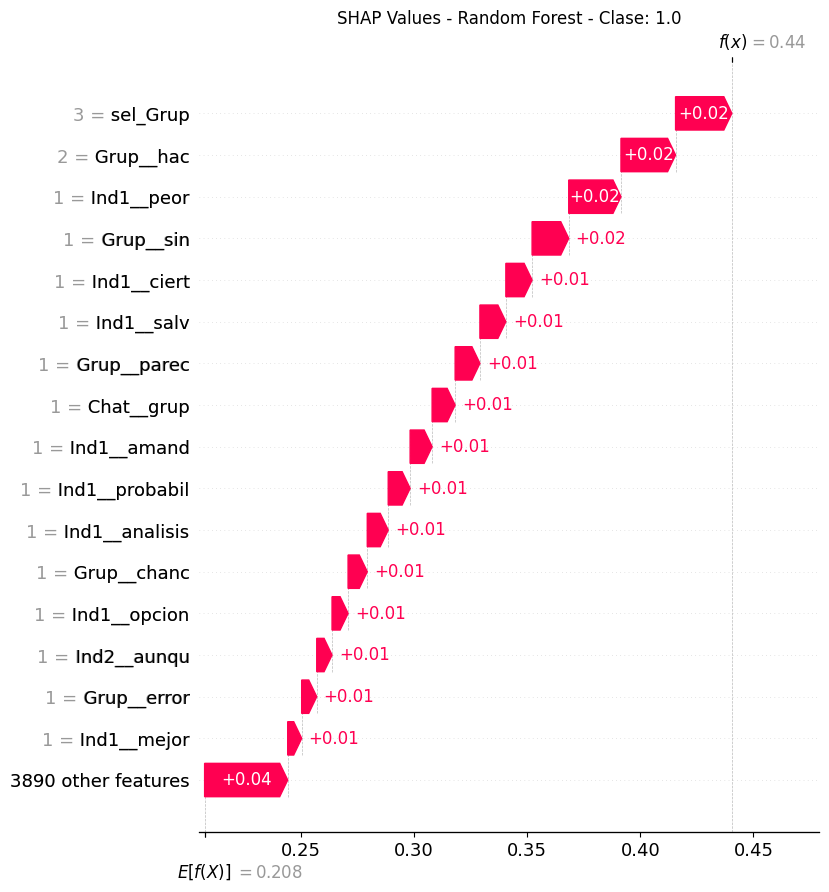

In [66]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:06:40] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


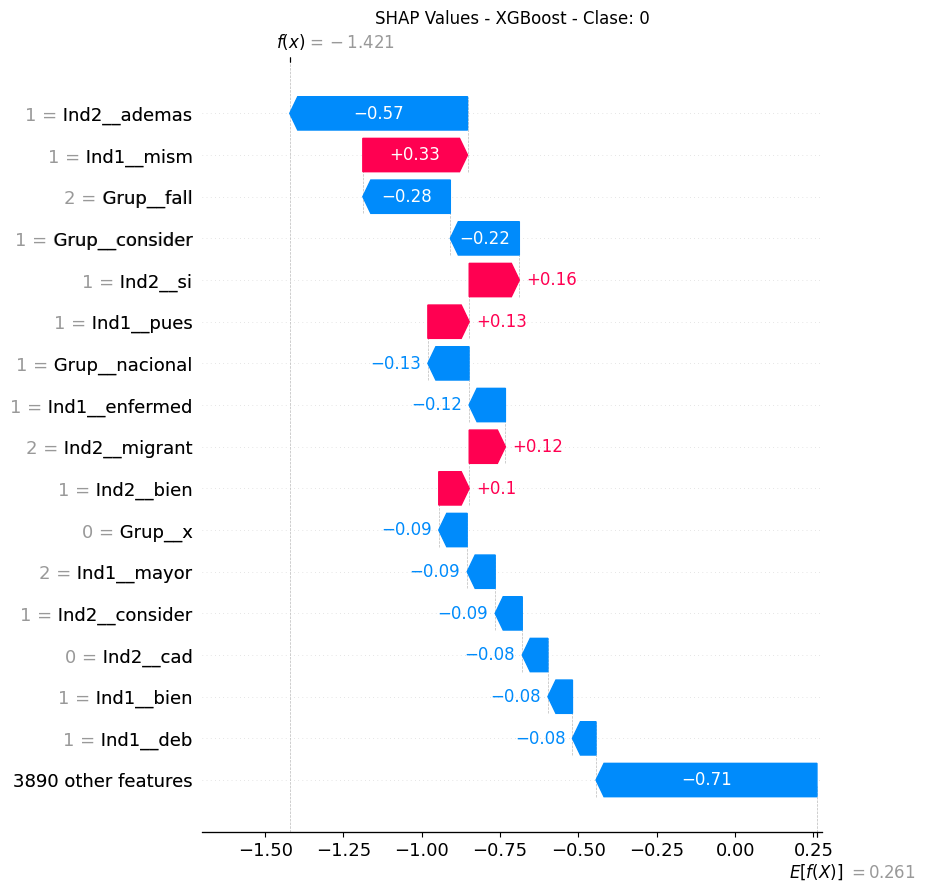

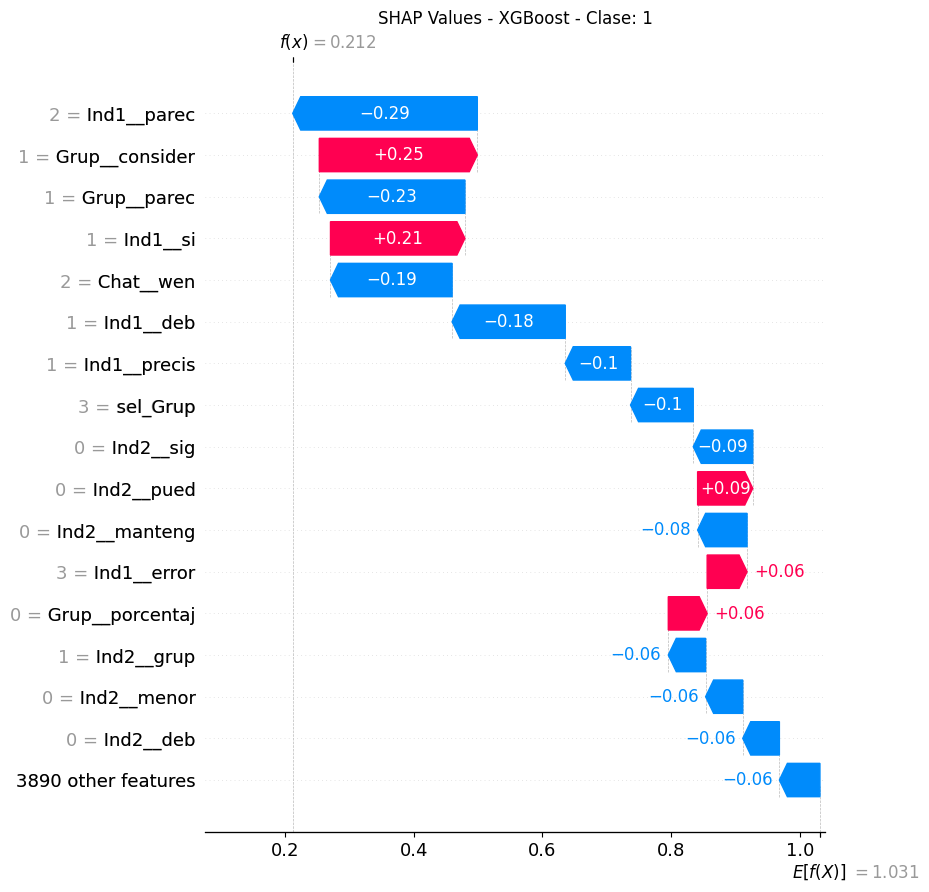

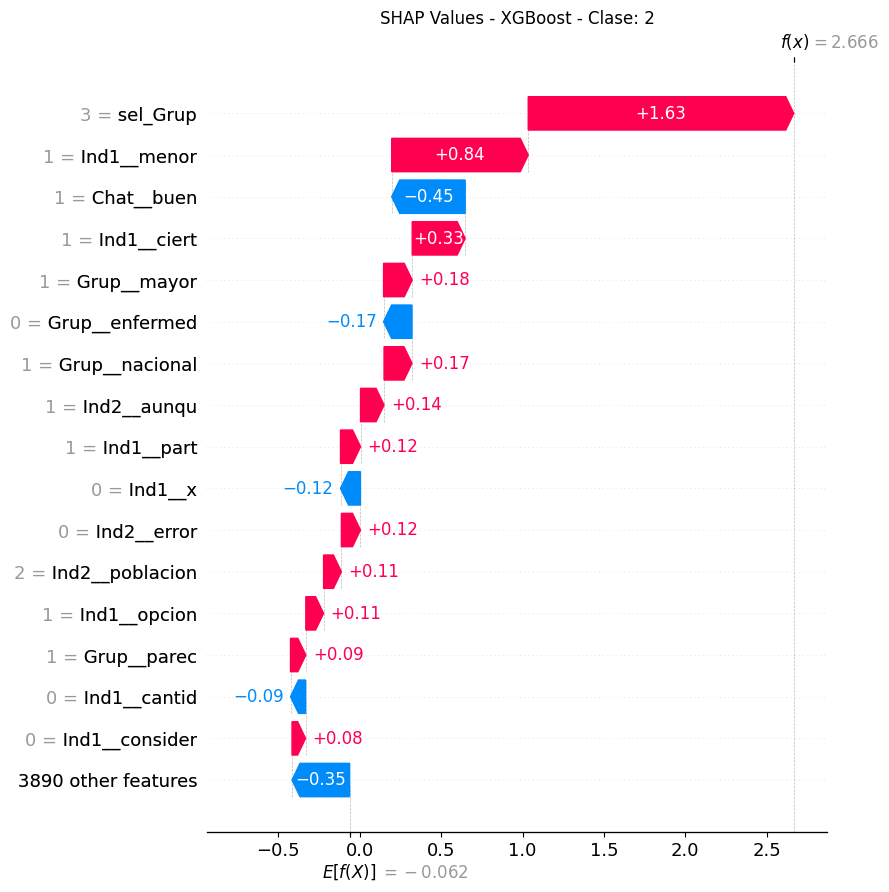

In [67]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 4. Quitar justificación individual 2

In [68]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=False, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__0si,Ind1__1,Ind1__100,Ind1__15,Ind1__155,...,Chat__wenap,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª
180,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
201,0.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
174,1.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
195,2.0,1.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
187,1.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
102,1.0,4.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
189,2.0,3.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
239,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [69]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [70]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7EB3050>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7EB3050>),
                                 'comment_Grup'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7EB3050>),
                                 'summary')])

In [71]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.53      1.00      0.69        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.53        83
   macro avg       0.18      0.33      0.23        83
weighted avg       0.28      0.53      0.37        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        22
         0.0       0.51      0.91      0.65        44
         1.0       0.00      0.00      0.00        17

    accuracy                           0.48        83
   macro avg       0.17      0.30      0.22        83
weighted avg       0.27      0.48      0.34        83

XGBoost classifier
Best Hyperparameters: {'max_leaves': 5, 'min_child_weight': 1, 'n_estimators': 150}
              precision    recall  f1-score   support

        -1.0       0.77      0.91      0.83        22
         0.0       0.69      0.66      0.67        44
         1.0       0.40      0.35      0.38        17

    accuracy                           0.66        83
   macro avg       0.62      0.64      0.63        83
weighted avg       0.65      0.66      0.66        83



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


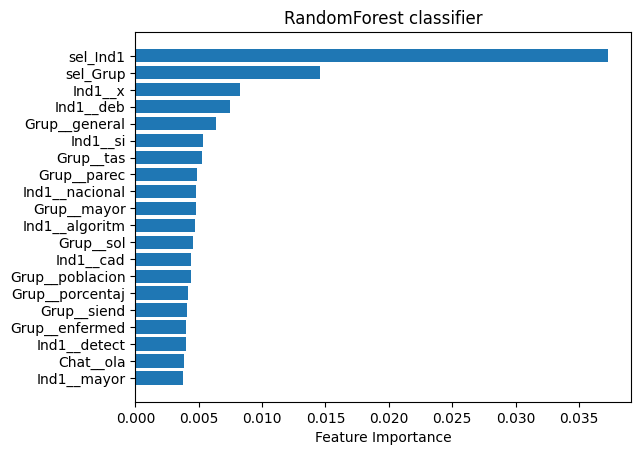

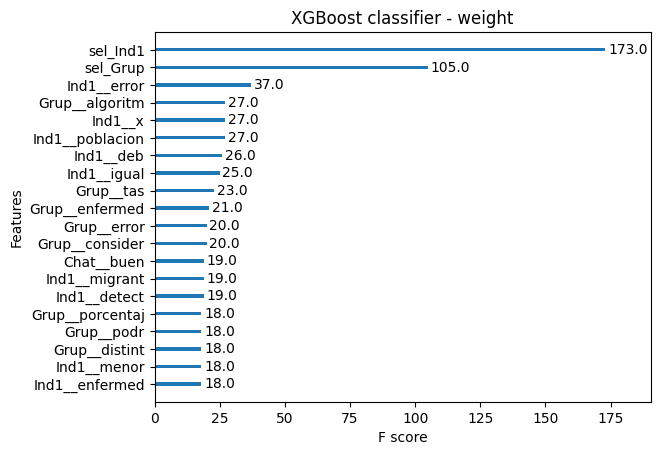

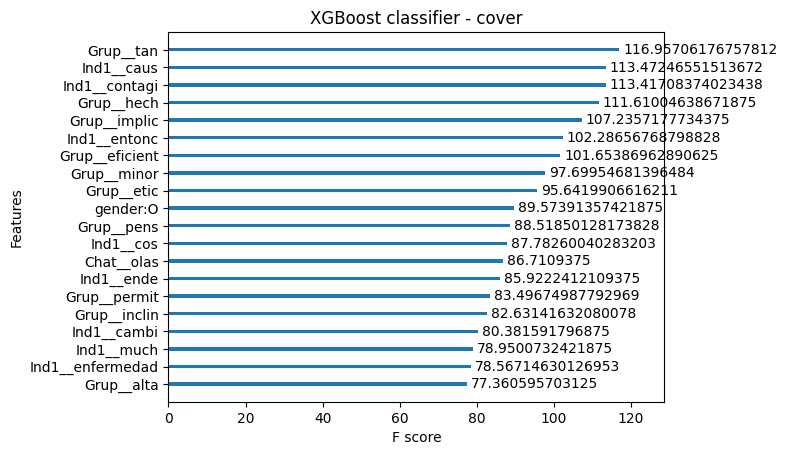

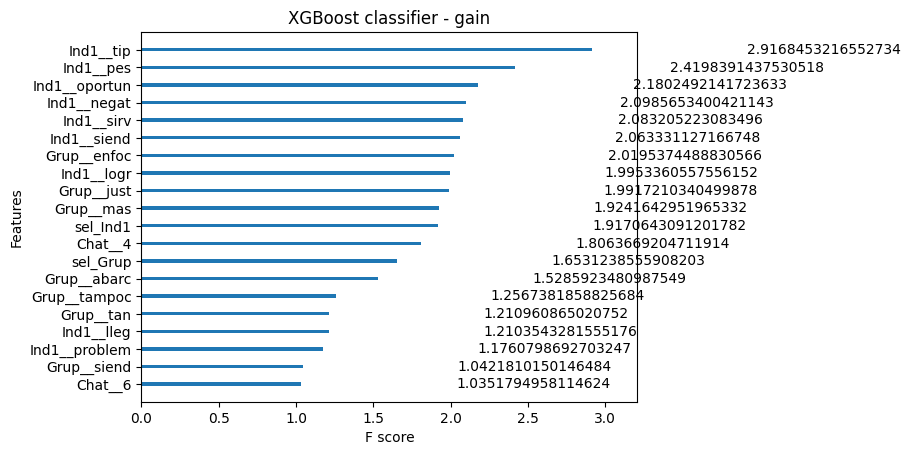

In [72]:
plot_importance_models(rf_best_model, xgb_best_model)

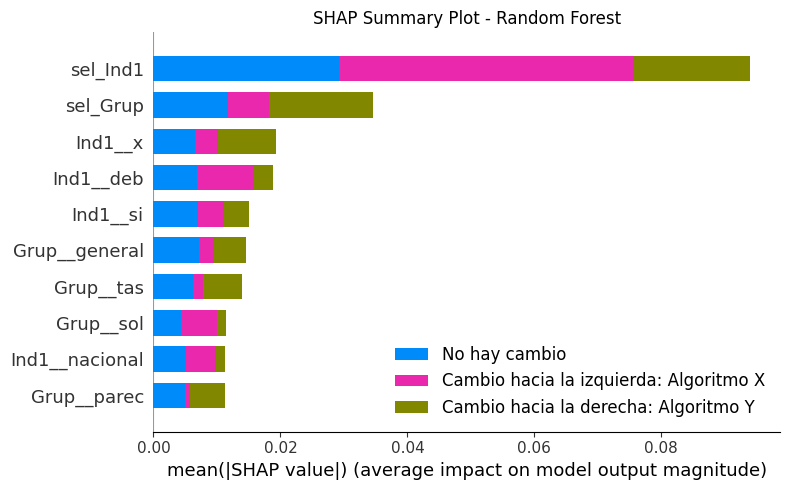

In [73]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=1)

[23:08:08] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


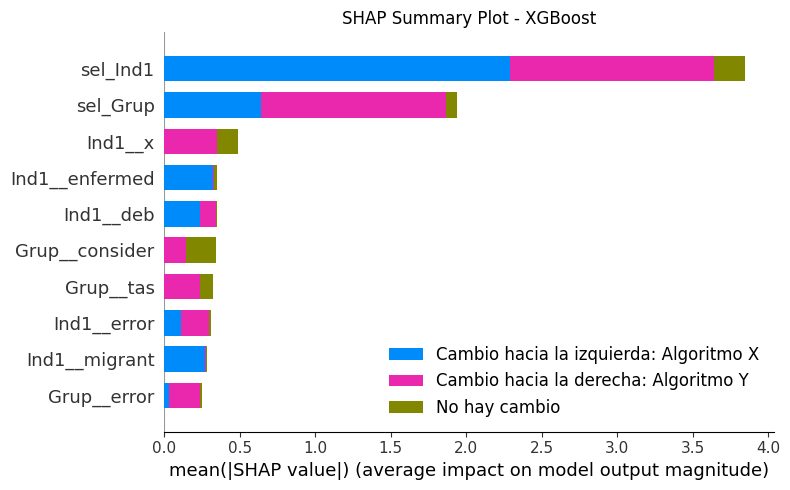

In [74]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=1)

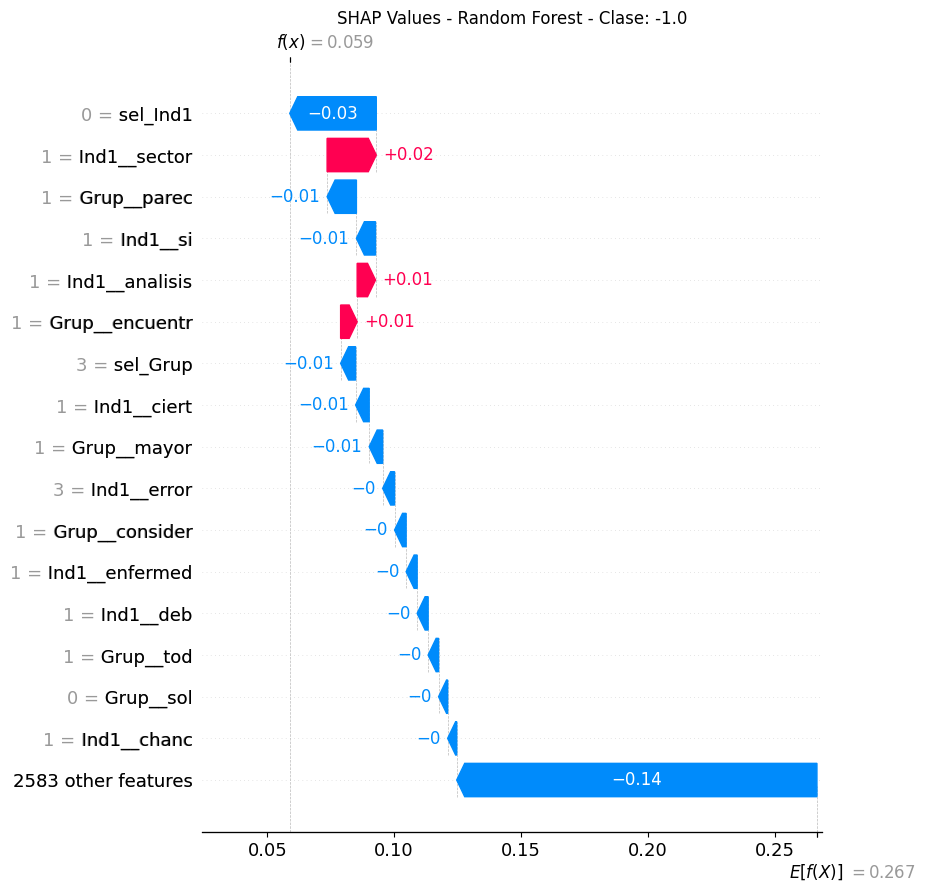

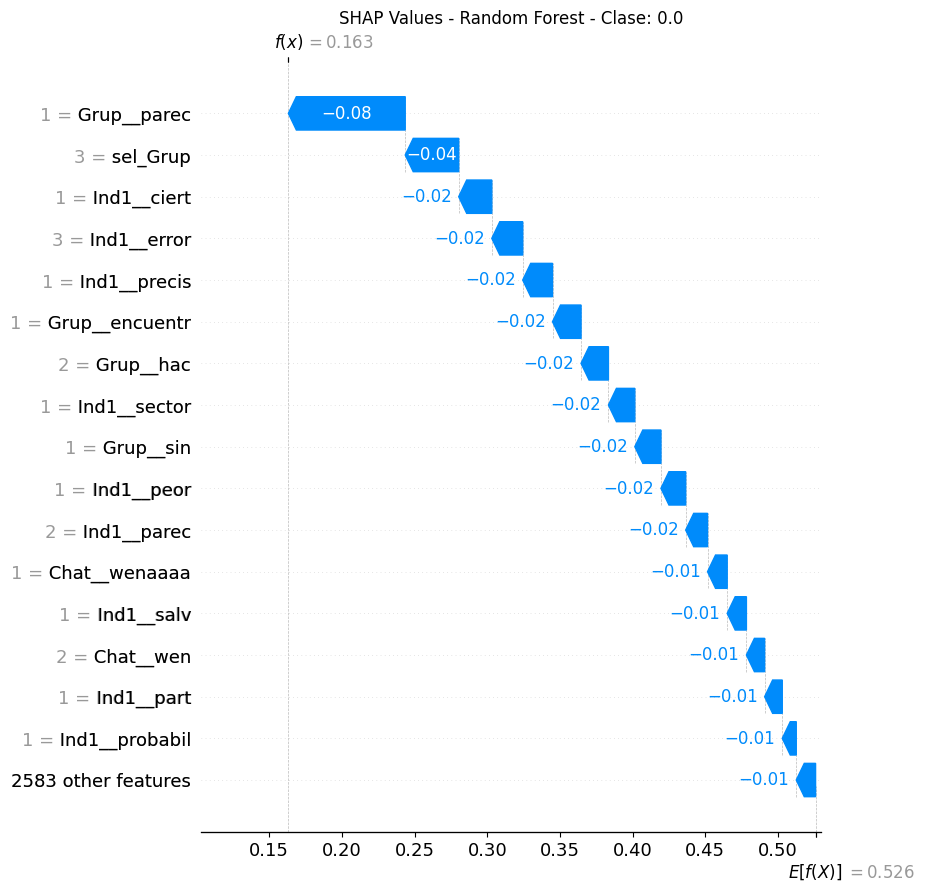

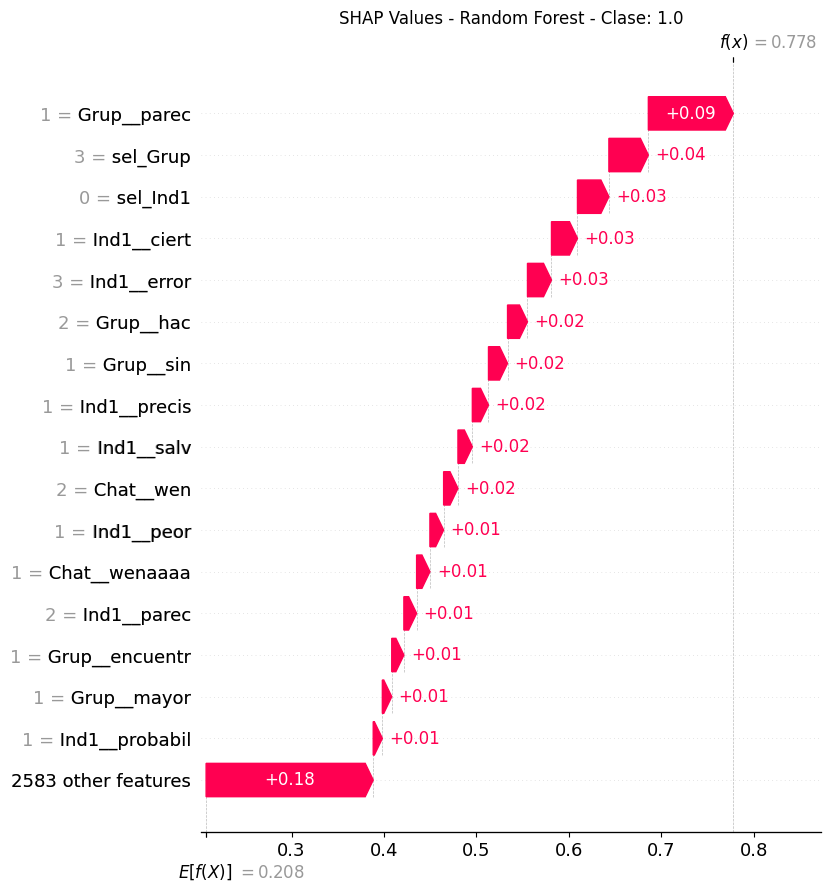

In [75]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:08:15] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


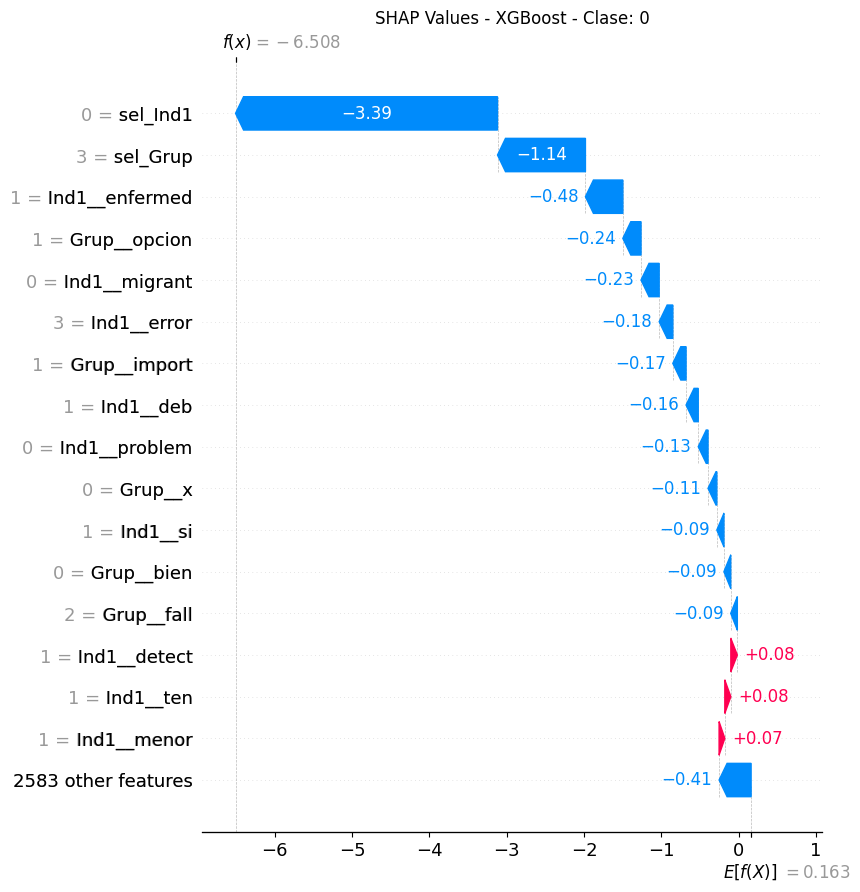

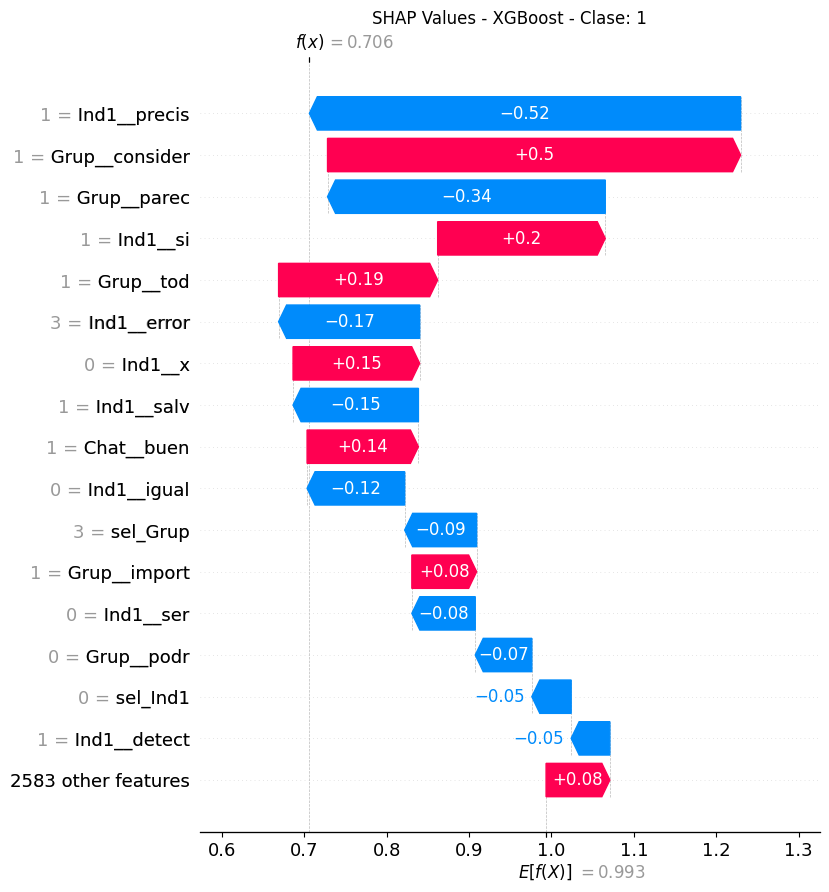

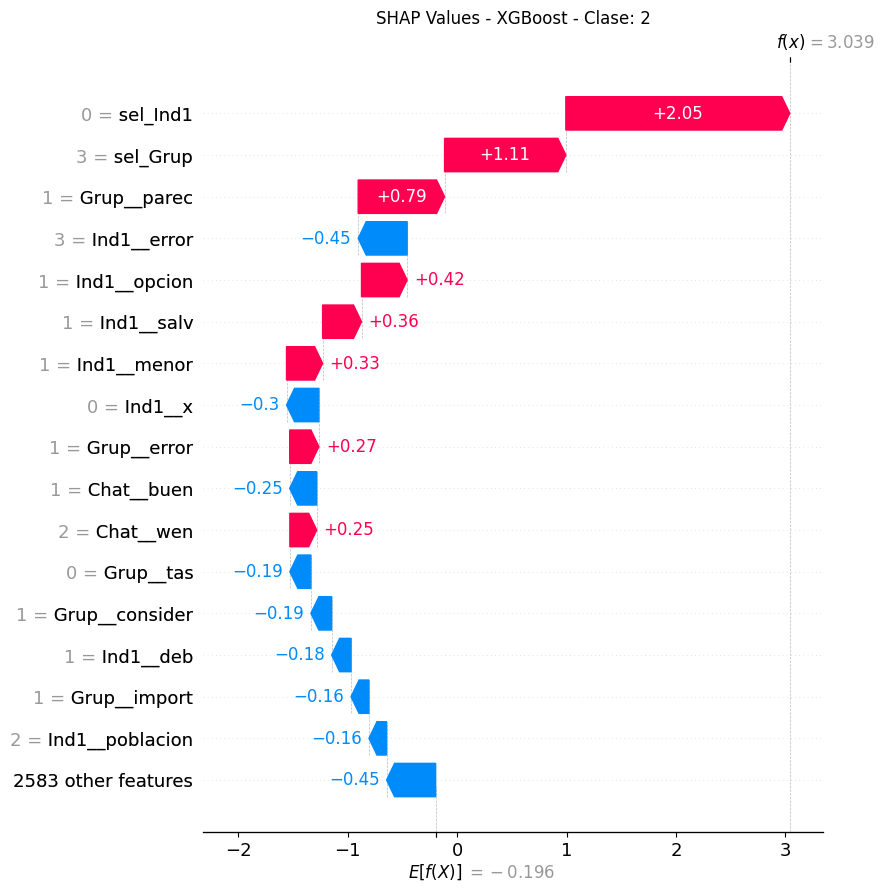

In [76]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

# Diferencial 2

In [77]:
dataset = pd.read_csv(f'dataset_{caso}_2.csv')

## Modelo base

In [78]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=False, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__2,Ind1__2da,Ind1__3,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [79]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2'])])

In [80]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD6805010>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD6805010>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD6805010>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD6805010>),
                                 'summary')])

In [81]:
df_train

,sel_Ind1,sel_Grup,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__2,Ind1__2da,Ind1__3,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [82]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.58      0.26      0.36        27
         0.0       0.48      0.89      0.63        47
         1.0       1.00      0.04      0.07        26

    accuracy                           0.50       100
   macro avg       0.69      0.40      0.35       100
weighted avg       0.64      0.50      0.41       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 20, 'min_child_weight': 1, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.75      0.78      0.76        27
         0.0       0.72      0.70      0.71        47
         1.0       0.73      0.73      0.73        26

    accuracy                           0.73       100
   macro avg       0.73      0.74      0.73       100
weighted avg       0.73      0.73      0.73       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


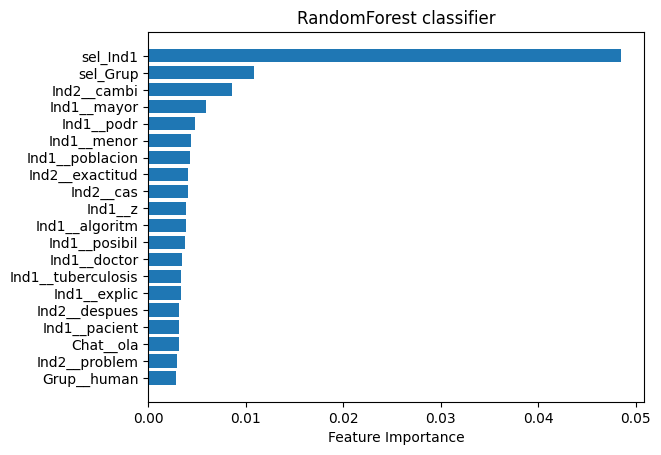

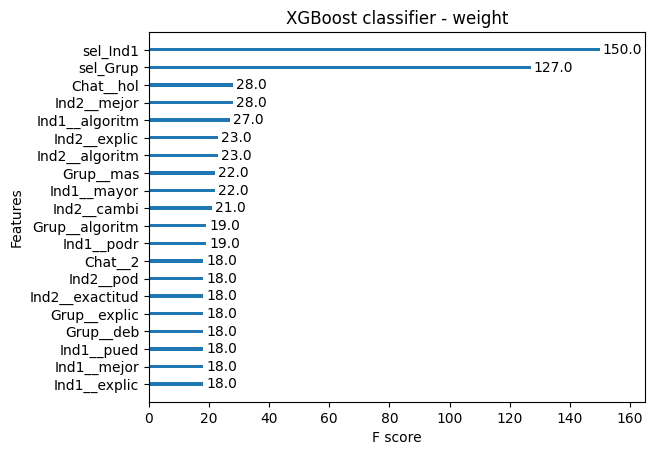

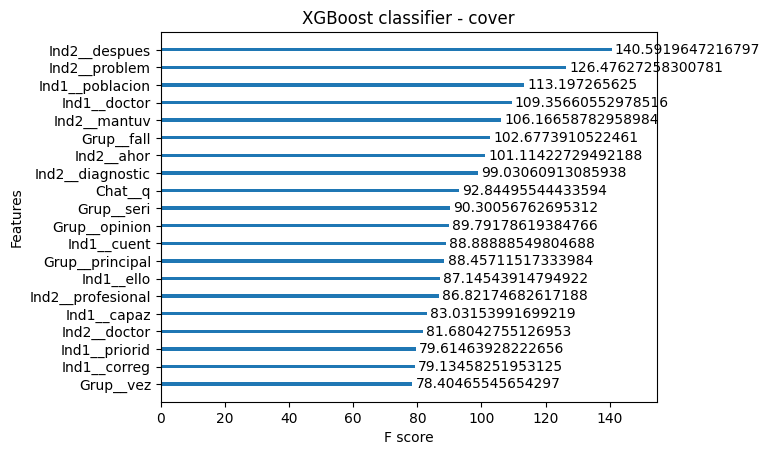

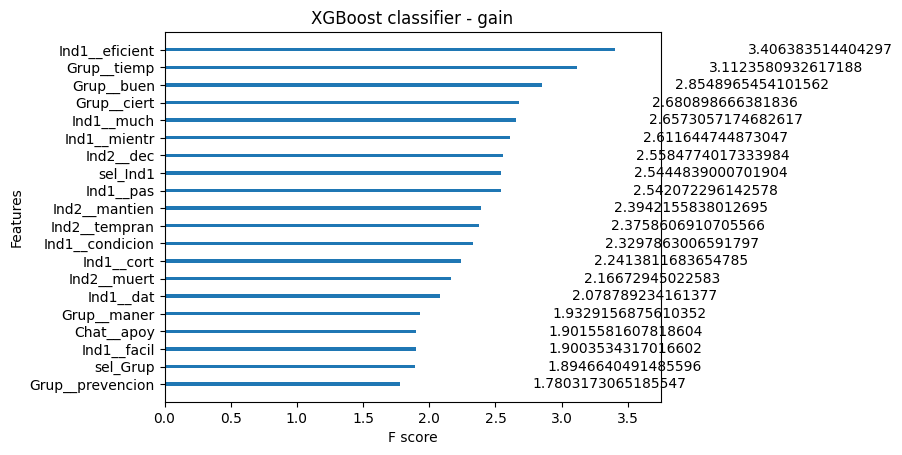

In [83]:
plot_importance_models(rf_best_model, xgb_best_model)

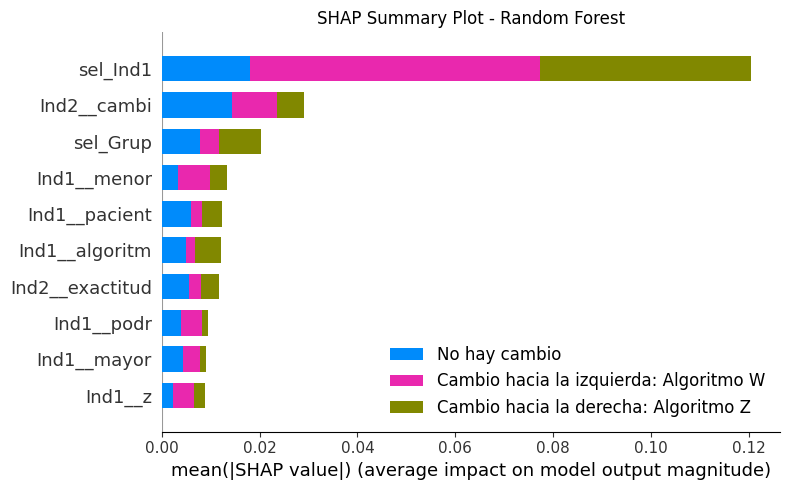

In [84]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[23:10:27] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


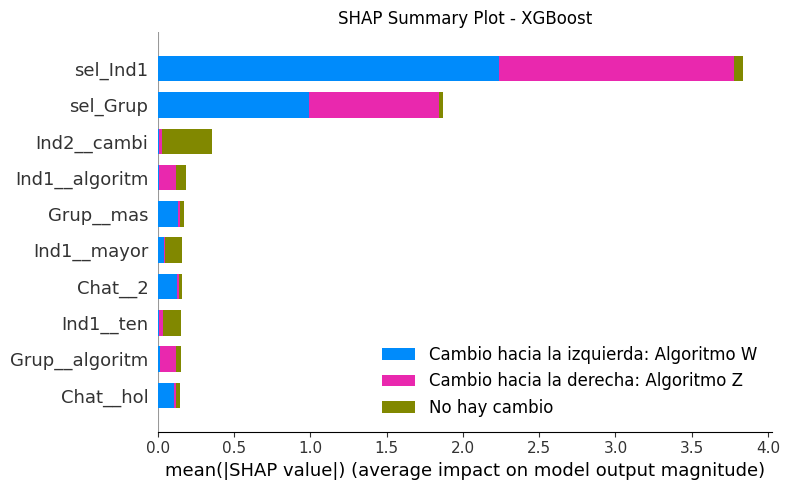

In [85]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

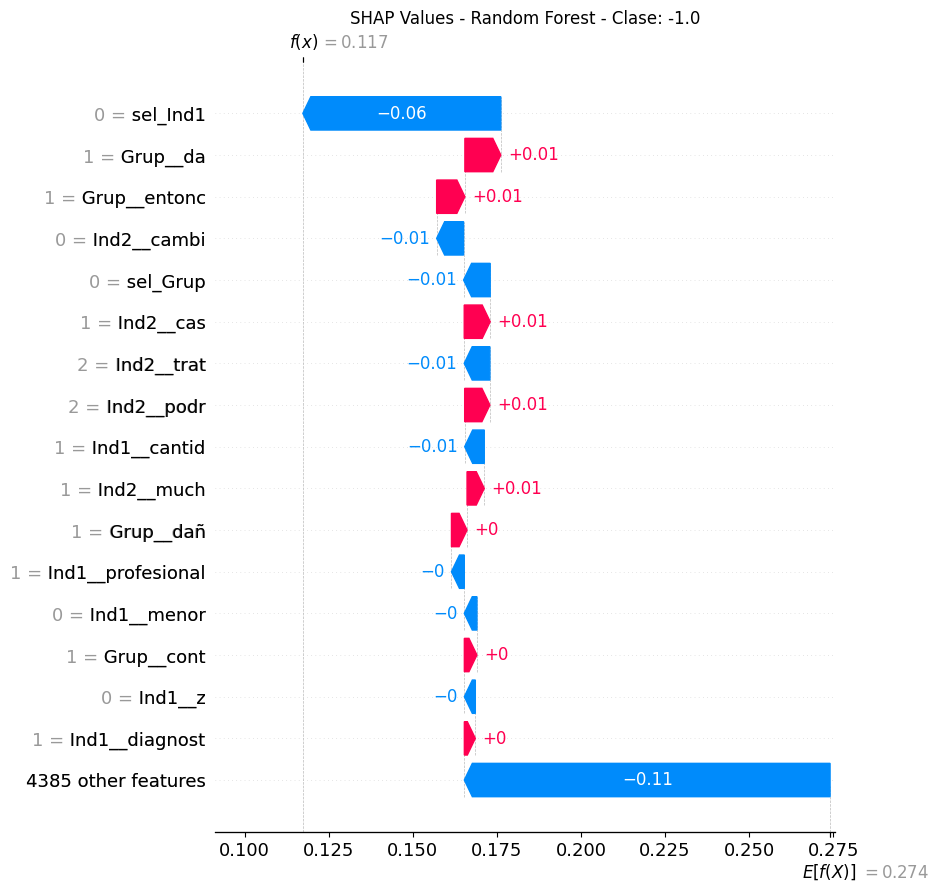

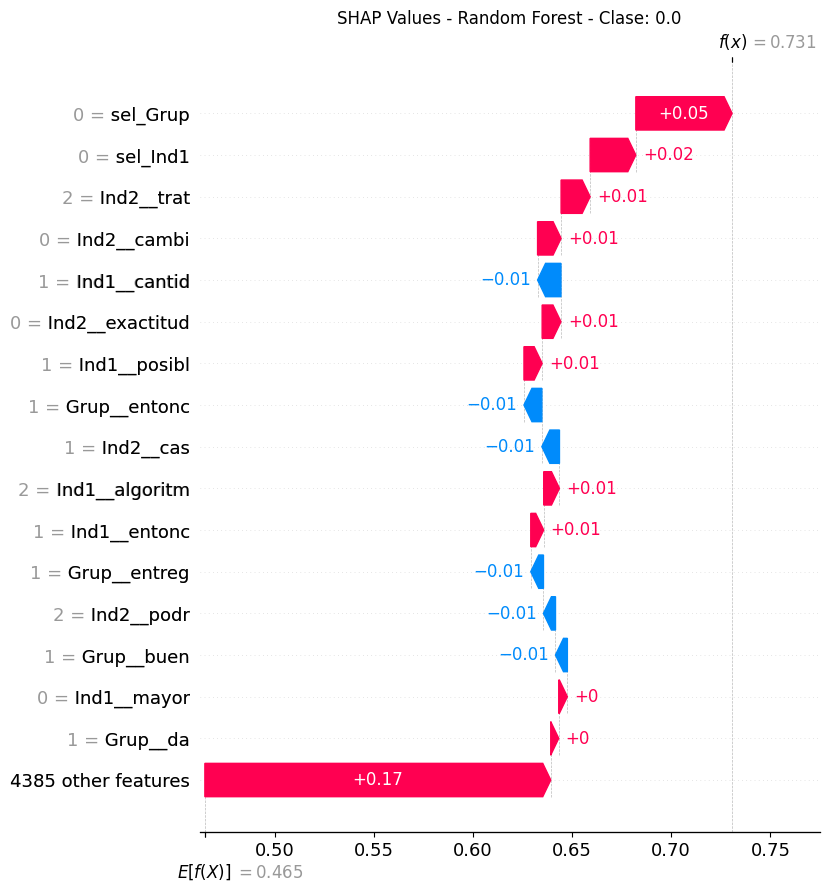

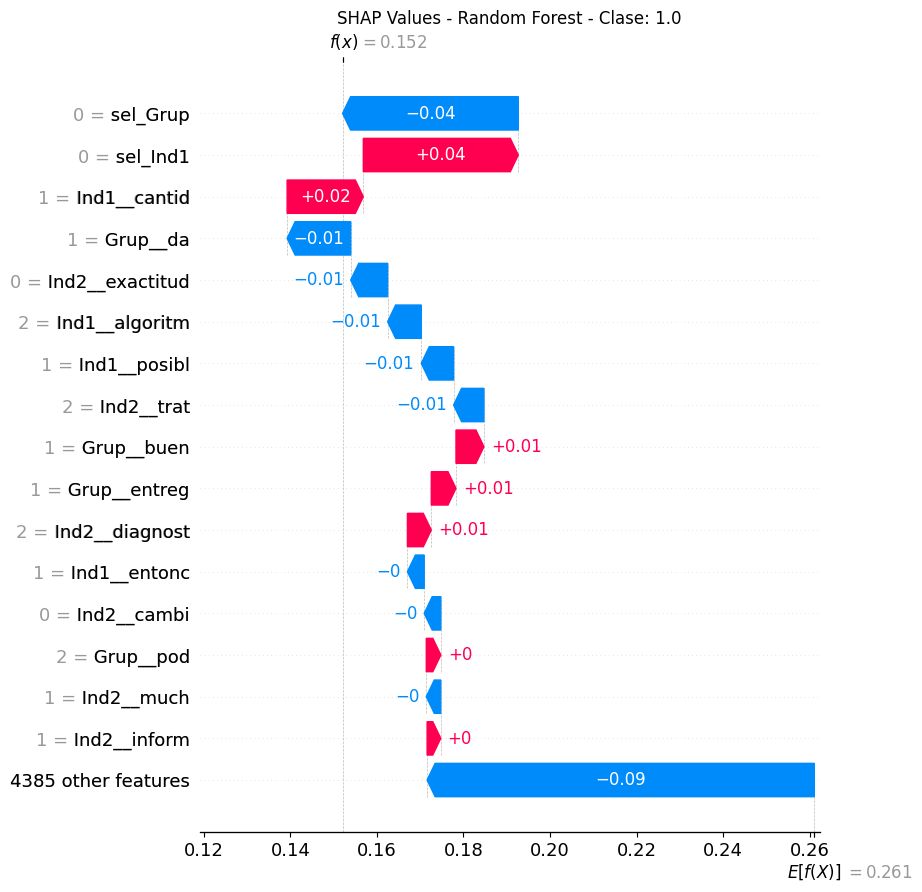

In [86]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:10:34] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


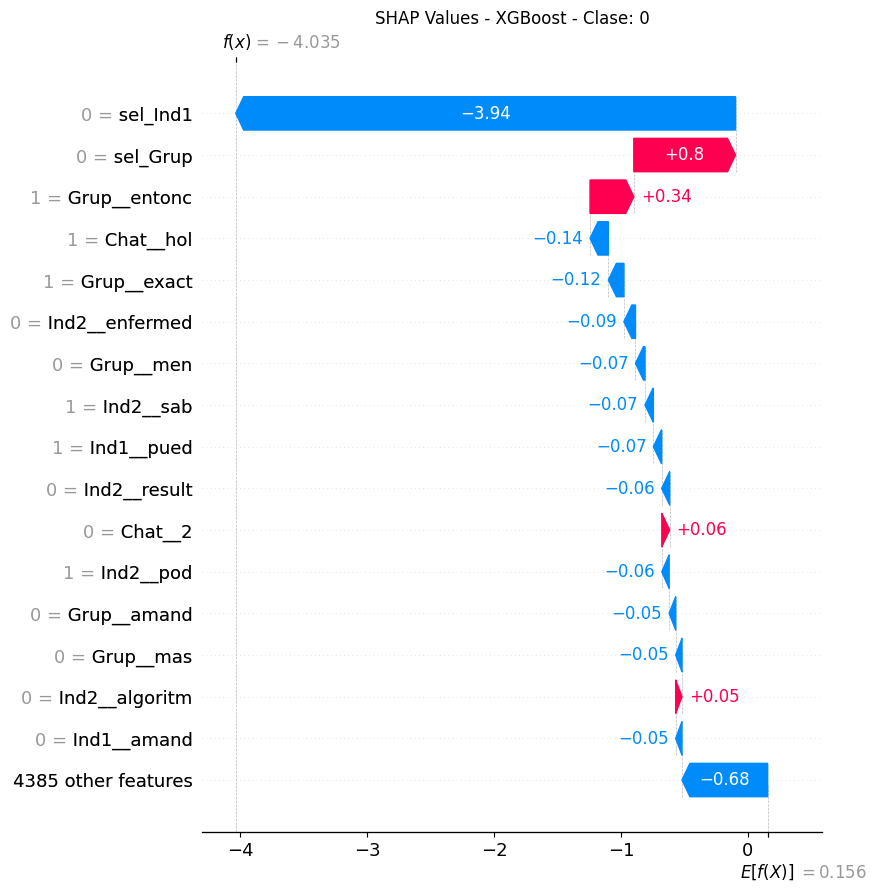

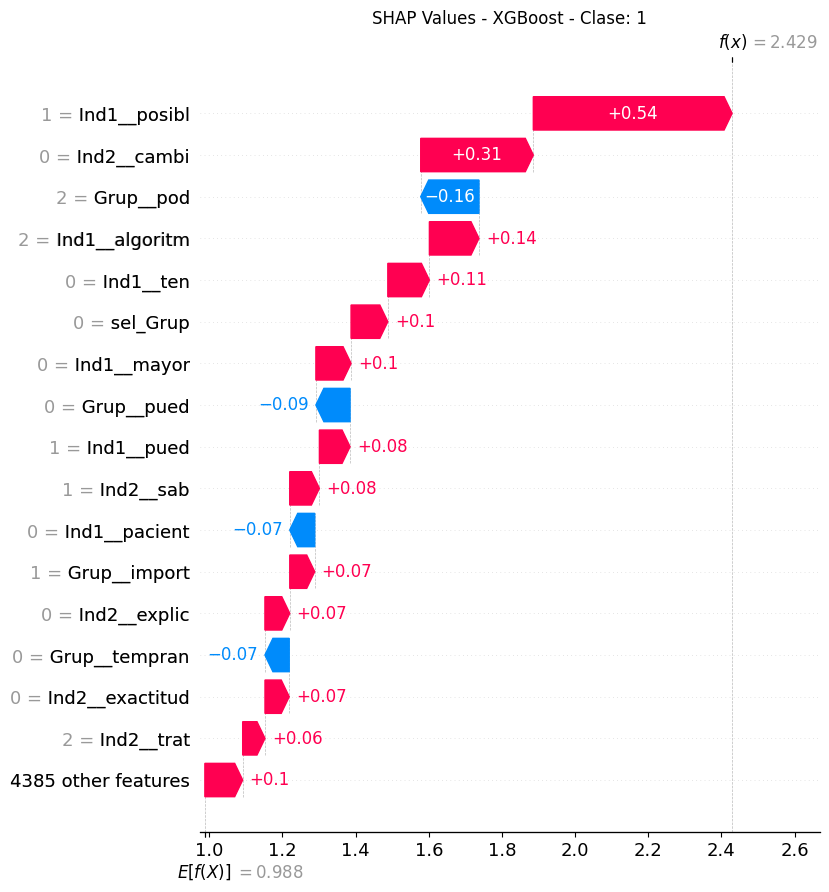

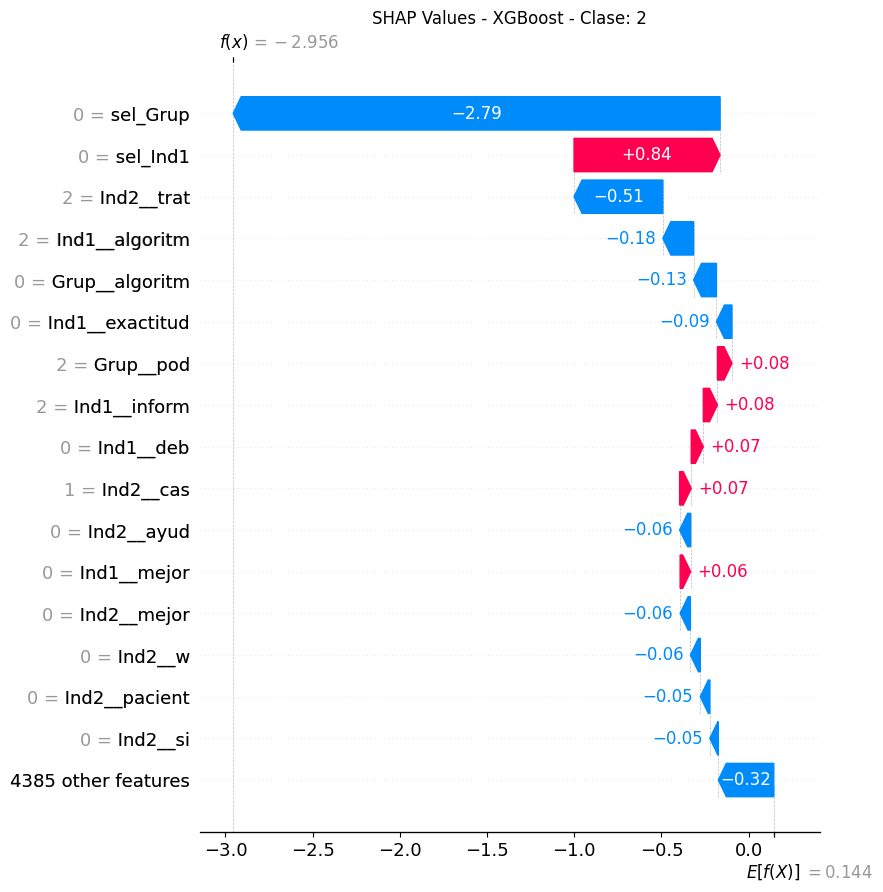

In [87]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 2. Agregar género

In [88]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [89]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [90]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7F5ECD0>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7F5ECD0>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7F5ECD0>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AAD7F5ECD0>),
                                 'summary')])

In [91]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.60      0.11      0.19        27
         0.0       0.47      0.94      0.63        47
         1.0       0.50      0.04      0.07        26

    accuracy                           0.48       100
   macro avg       0.52      0.36      0.30       100
weighted avg       0.51      0.48      0.36       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 20, 'min_child_weight': 1, 'n_estimators': 50}
              precision    recall  f1-score   support

        -1.0       0.72      0.78      0.75        27
         0.0       0.71      0.68      0.70        47
         1.0       0.73      0.73      0.73        26

    accuracy                           0.72       100
   macro avg       0.72      0.73      0.73       100
weighted avg       0.72      0.72      0.72       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


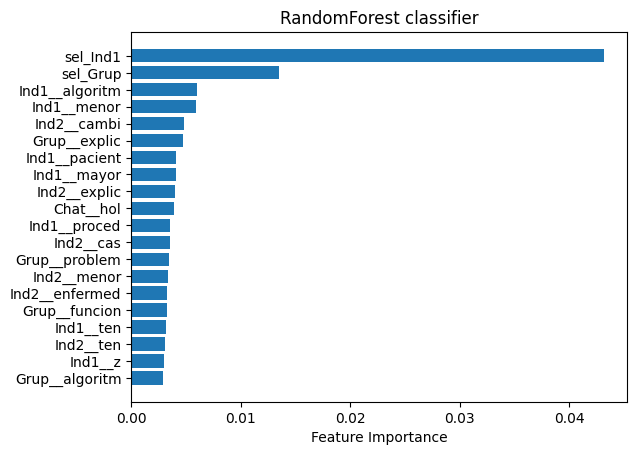

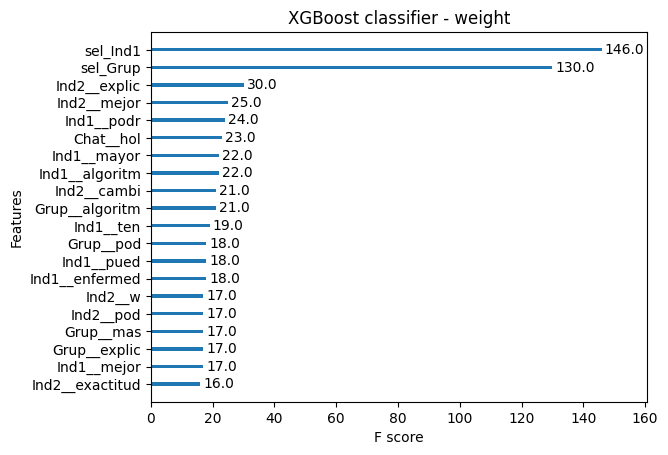

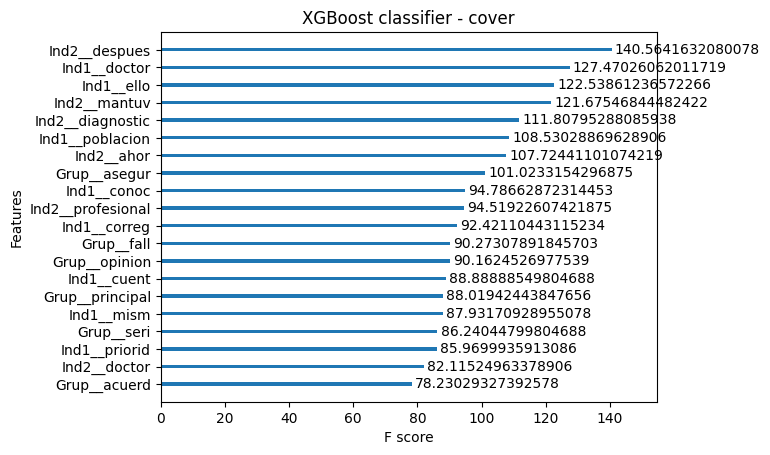

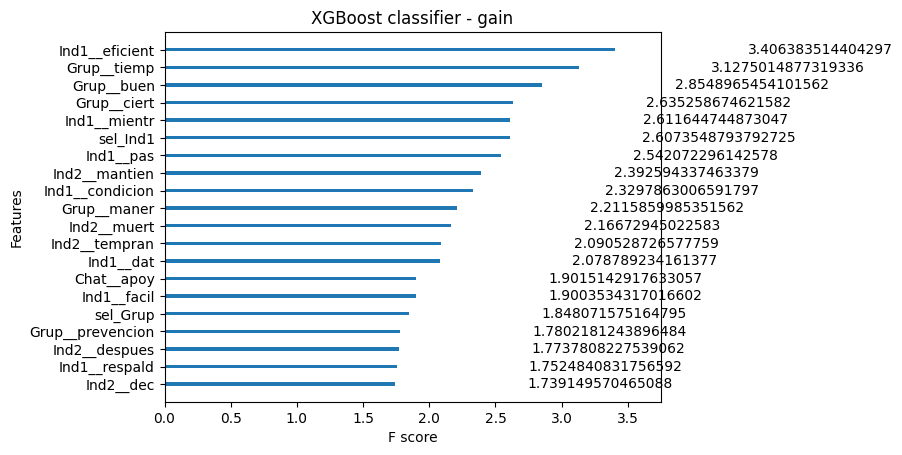

In [92]:
plot_importance_models(rf_best_model, xgb_best_model)

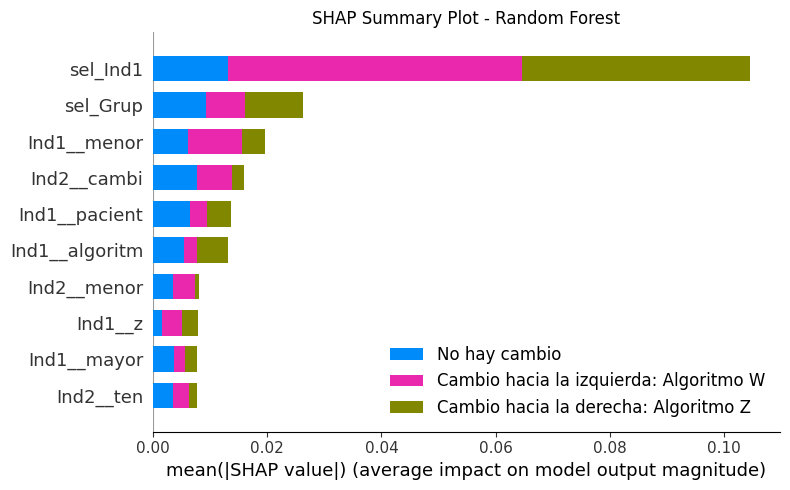

In [93]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[23:12:44] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


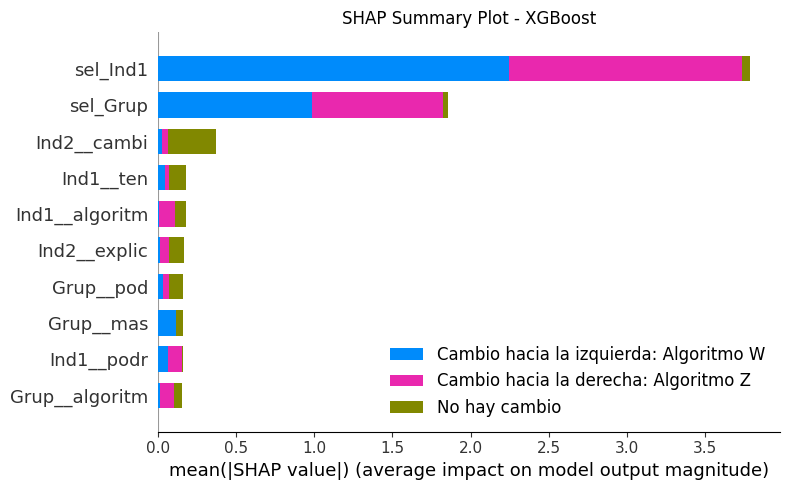

In [94]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

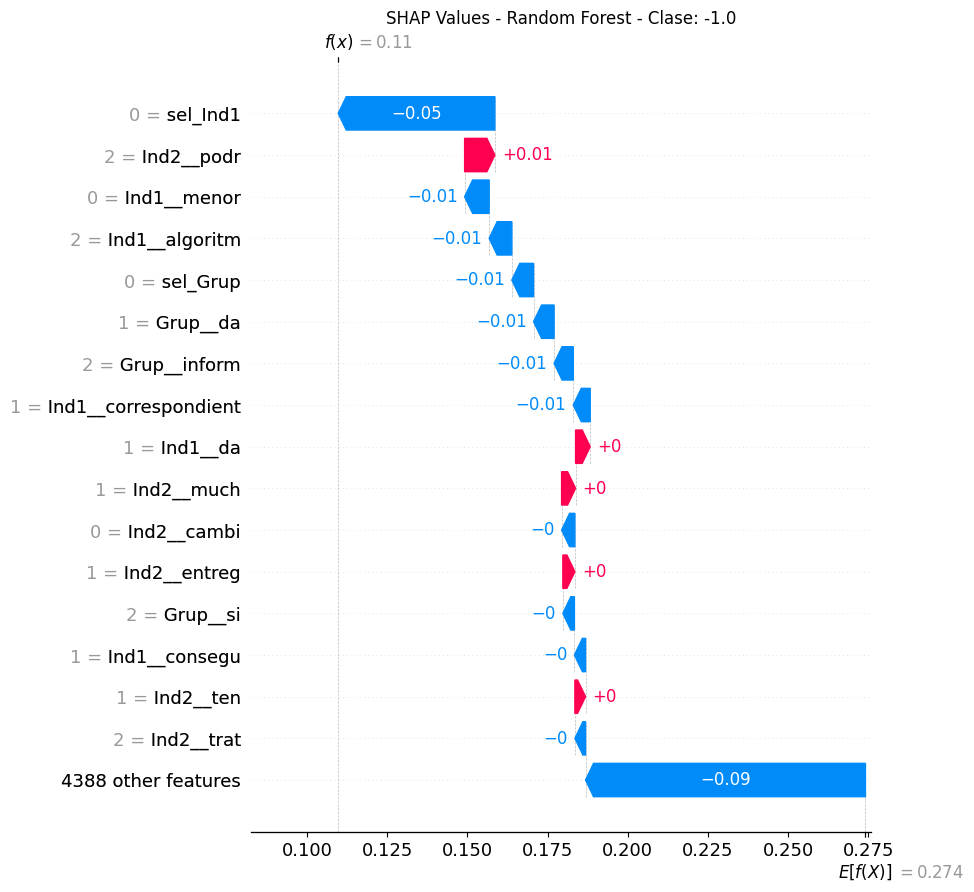

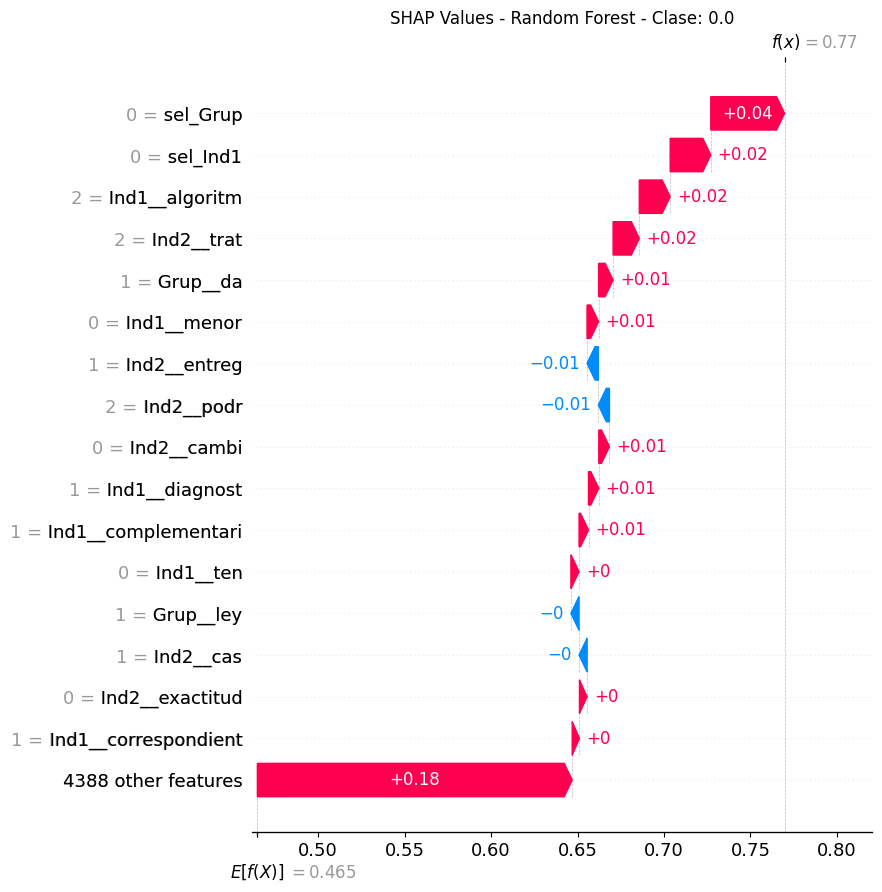

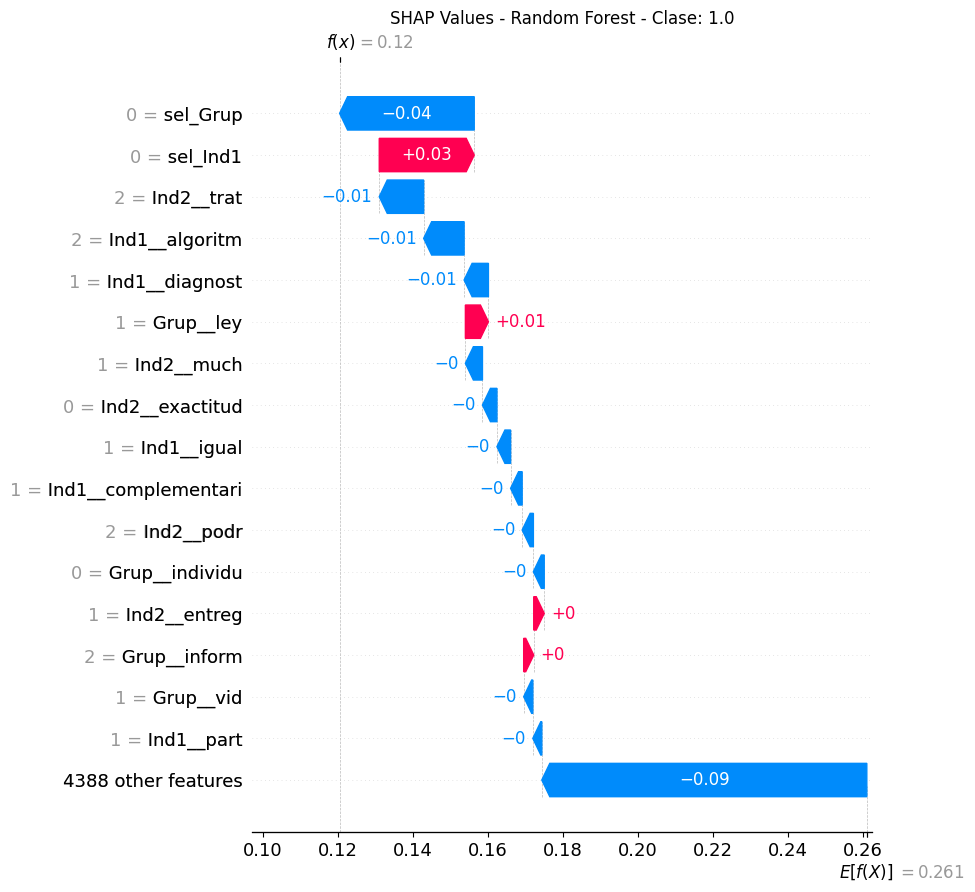

In [95]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:12:50] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


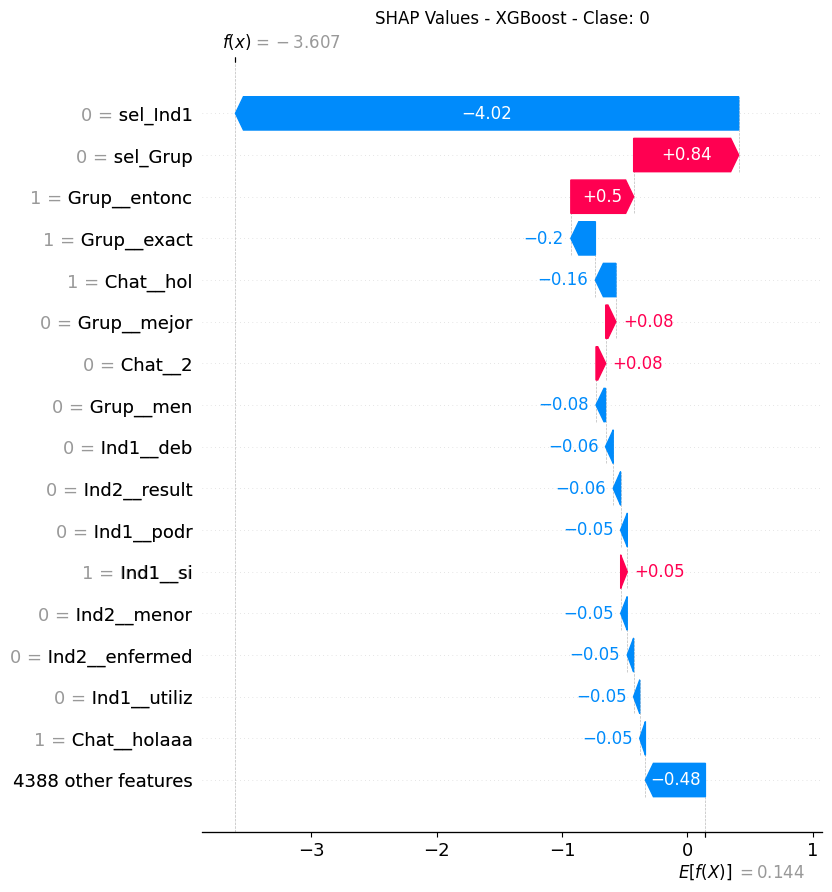

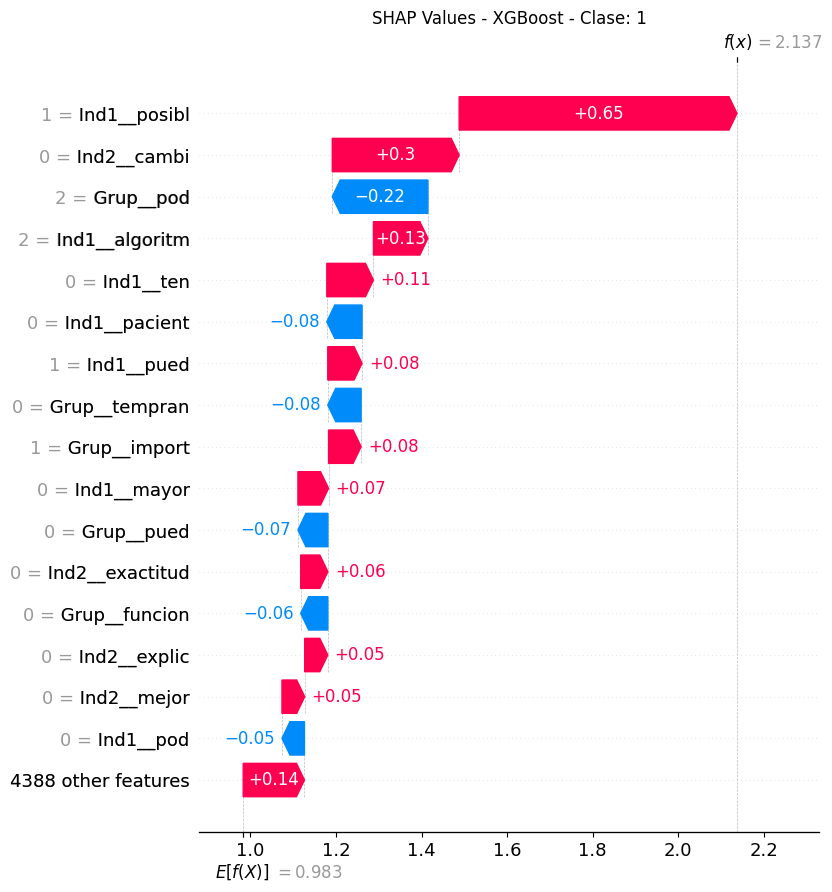

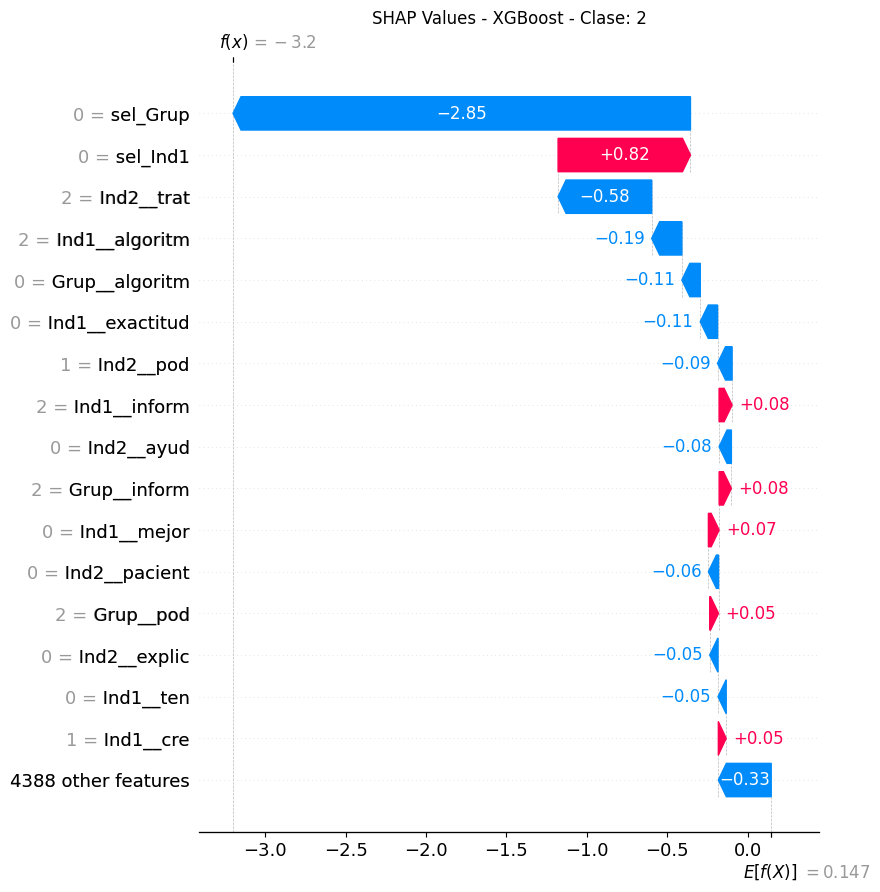

In [96]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 3. Quitar selección 1

In [97]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=True, 
    sel_Ind1=False
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Grup,gender:M,gender:F,gender:O,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,Ind1__2,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,1.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,0.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,2.0,1.0,0.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,3.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,2.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,2.0,0.0,1.0,0.0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [98]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [99]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA80882790>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA80882790>),
                                 'comment_Grup'),
                                ('Ind2',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA80882790>),
                                 'comment_Ind2'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA80882790>),
                                 'summary')])

In [100]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}
              precision    recall  f1-score   support

        -1.0       1.00      0.04      0.07        27
         0.0       0.48      1.00      0.65        47
         1.0       1.00      0.08      0.14        26

    accuracy                           0.50       100
   macro avg       0.83      0.37      0.29       100
weighted avg       0.76      0.50      0.36       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_estimators': 150}
              precision    recall  f1-score   support

        -1.0       0.30      0.22      0.26        27
         0.0       0.44      0.49      0.46        47
         1.0       0.29      0.31      0.30        26

    accuracy                           0.37       100
   macro avg       0.34      0.34      0.34       100
weighted avg       0.36      0.37      0.36       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


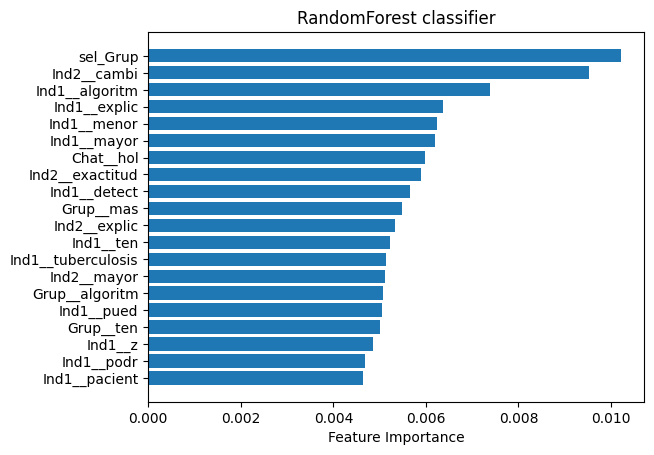

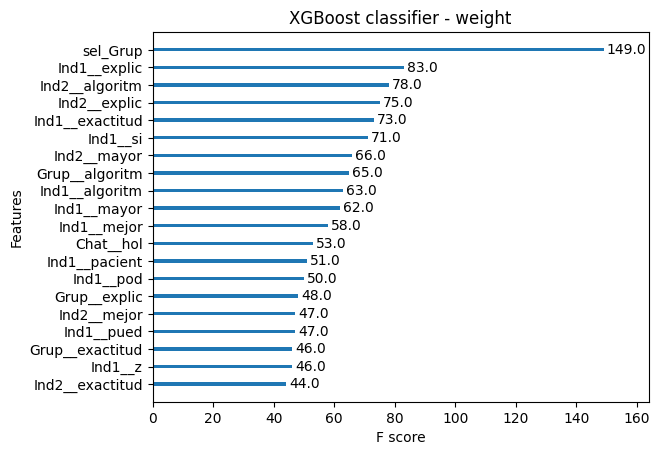

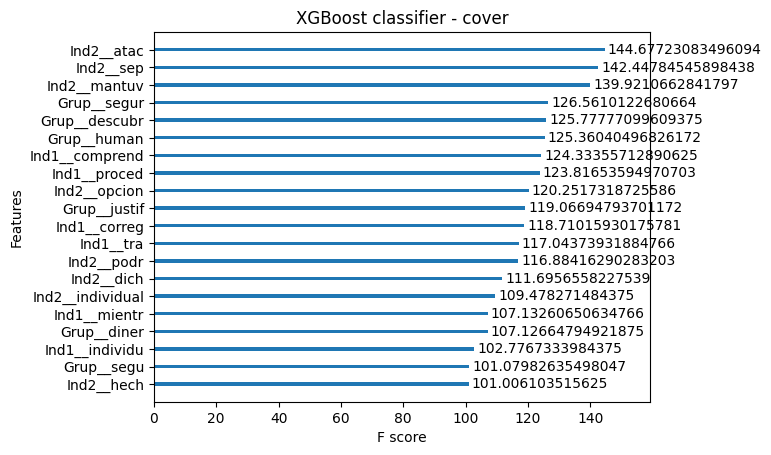

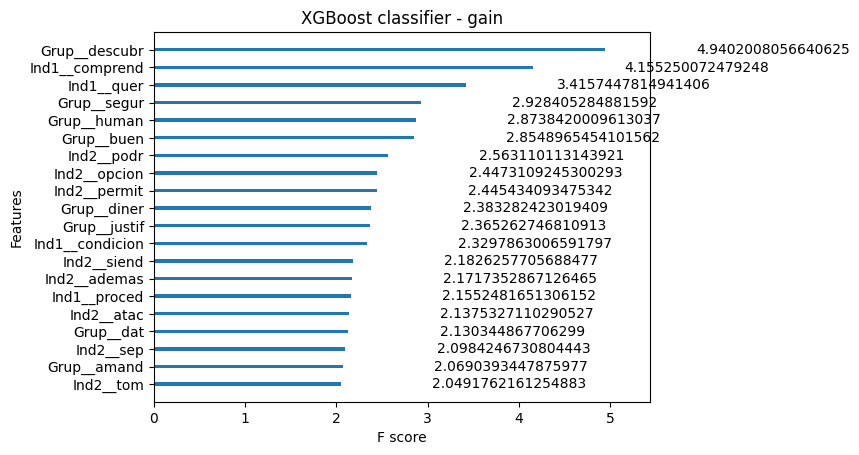

In [101]:
plot_importance_models(rf_best_model, xgb_best_model)

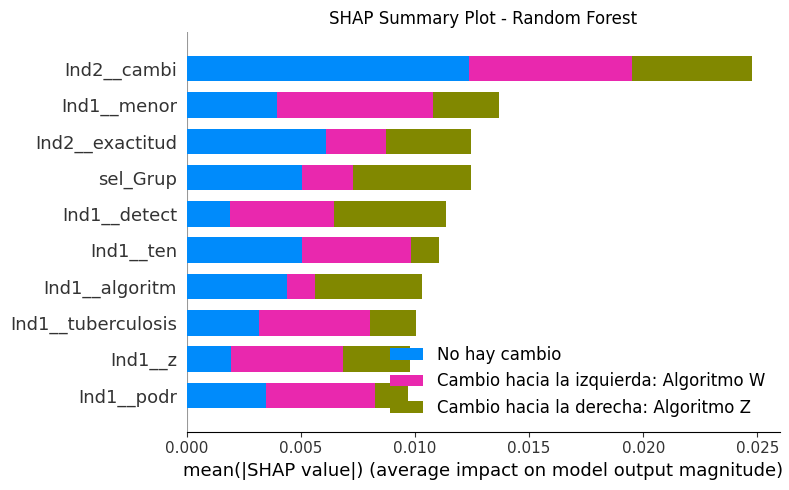

In [102]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[23:15:10] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


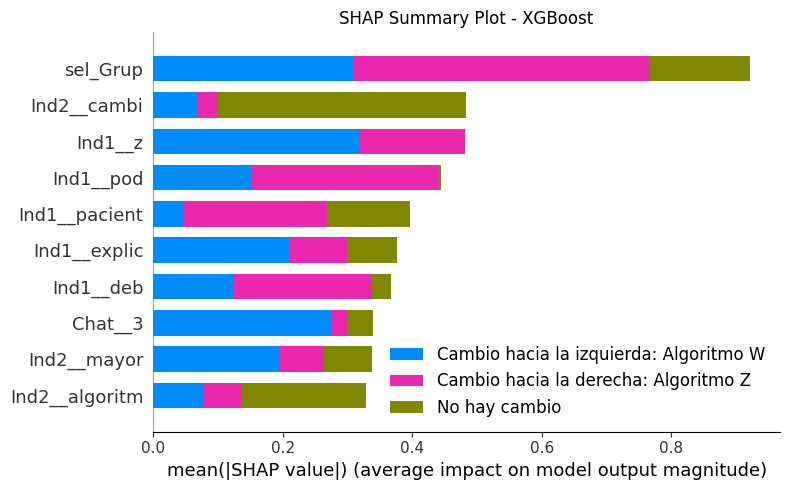

In [103]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

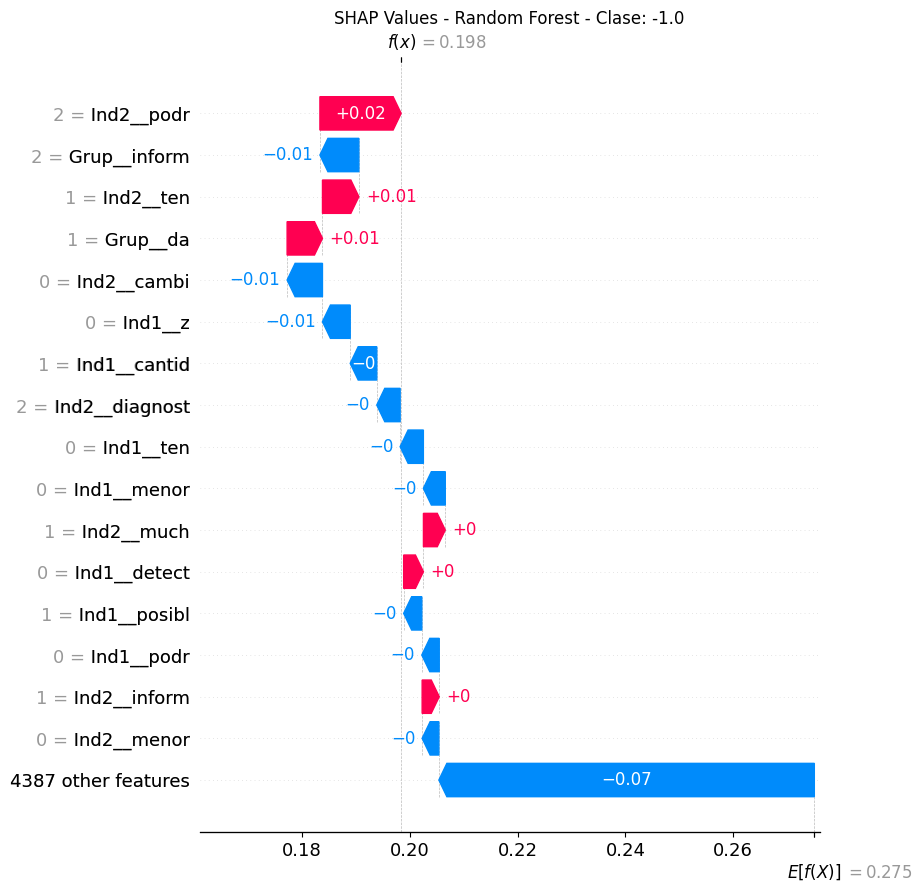

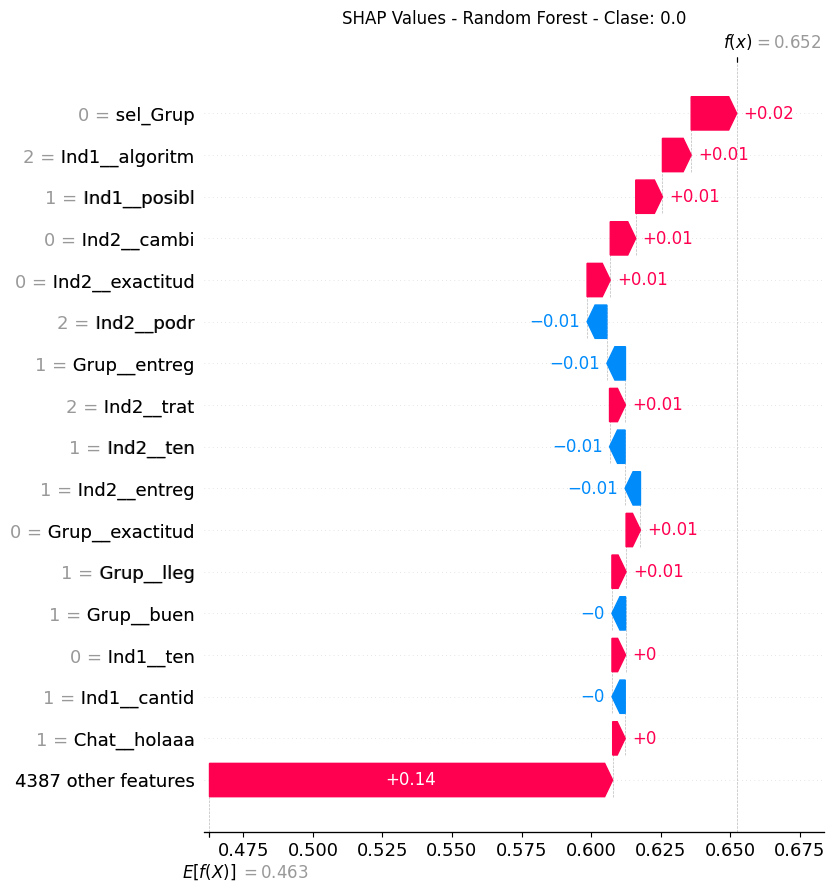

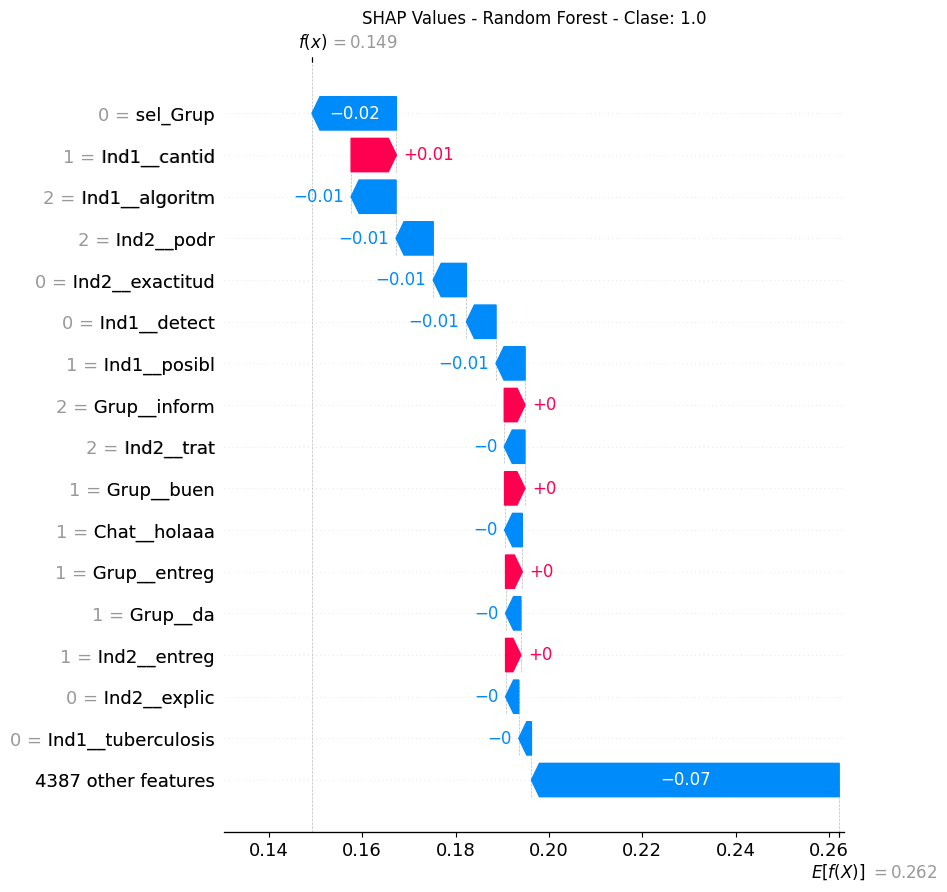

In [104]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:15:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


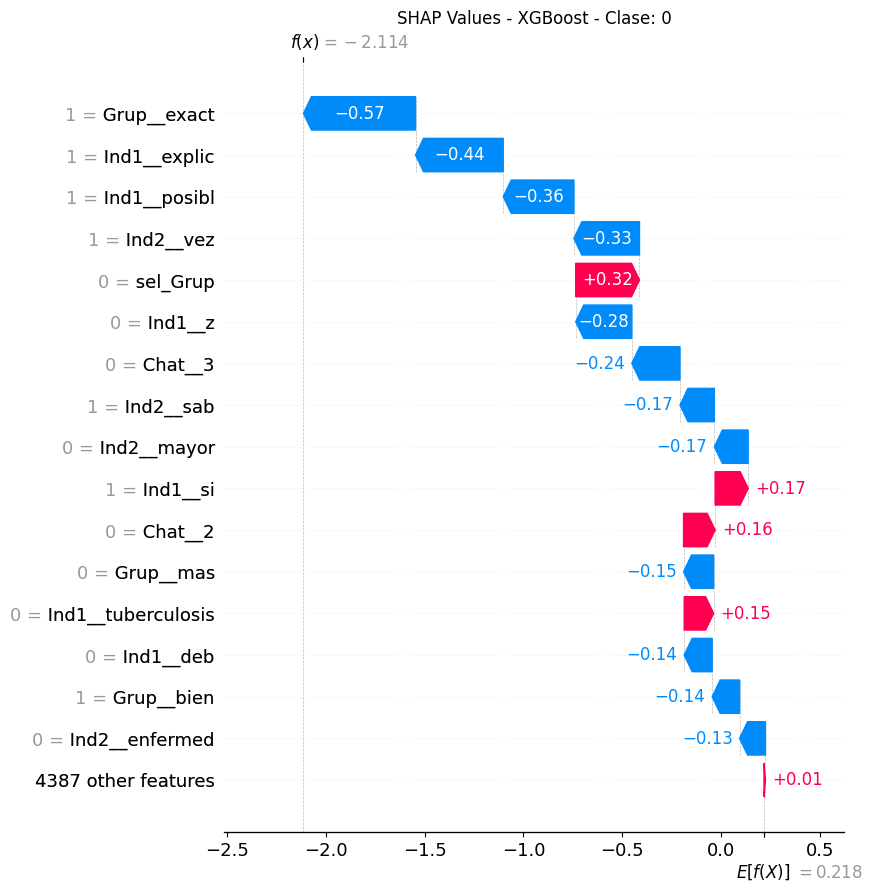

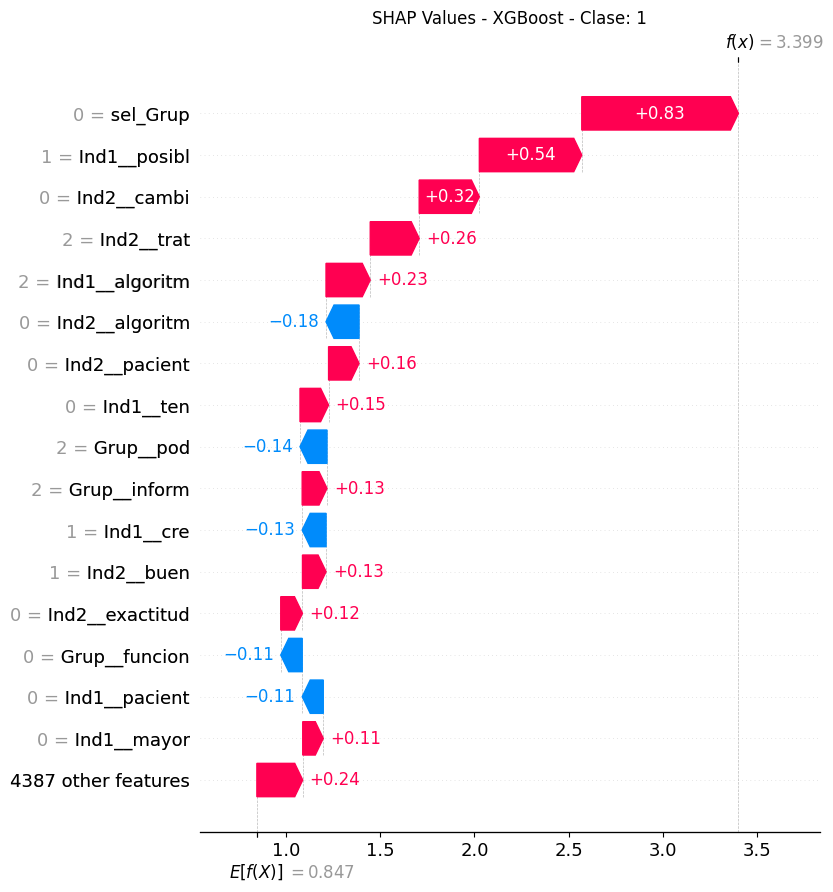

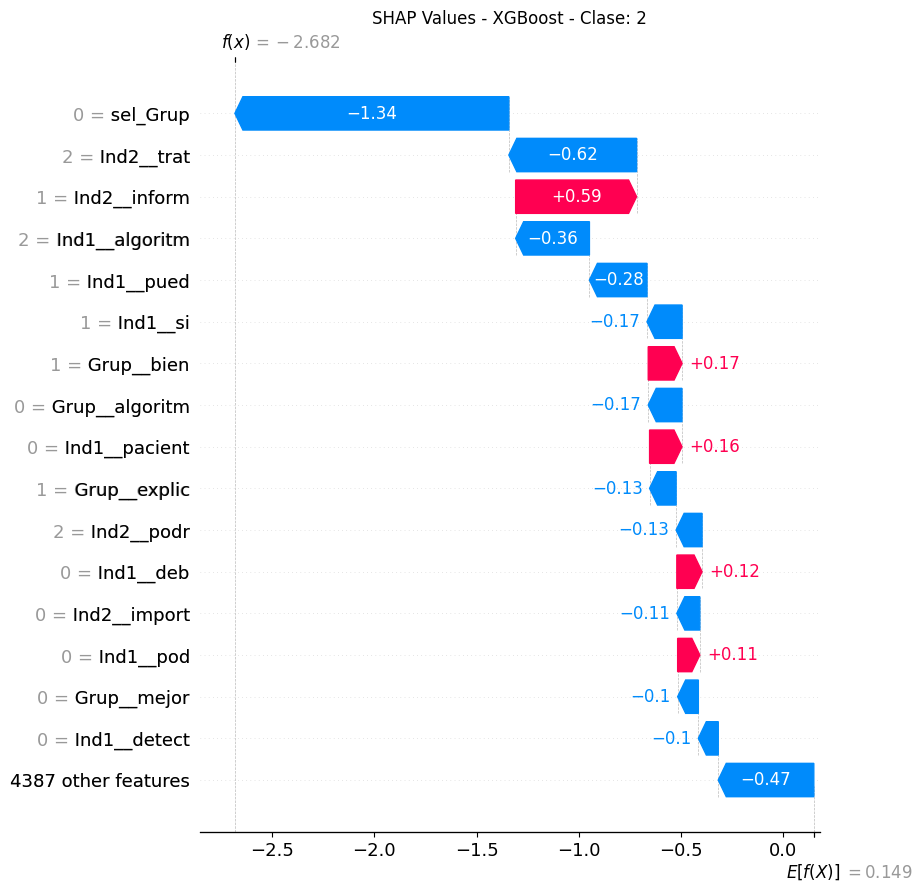

In [105]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')

## Modelo 4. Quitar justificación individual 2

In [106]:
df_train, df_test, y_train, y_test, categorical_preprocessing, text_preprocessing = preprocessing(
    dataset,
    gender=True, 
    comment_Ind2=False, 
    sel_Ind1=True
)
df_train

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

,sel_Ind1,sel_Grup,gender:M,gender:F,gender:O,Ind1__1,Ind1__10,Ind1__100,Ind1__100000,Ind1__15,...,Chat__wenass,Chat__wifi,Chat__wol,Chat__x,Chat__x2,Chat__x3,Chat__xat,Chat__xd,Chat__ª,Chat__ö
132,2.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
490,0.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
459,0.0,1.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
230,2.0,0.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
438,0.0,2.0,1.0,0.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
436,4.0,3.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
33,5.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
190,1.0,2.0,0.0,1.0,0.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [107]:
categorical_preprocessing

ColumnTransformer(transformers=[('sel_etapa',
                                 Pipeline(steps=[('ordinal_encoder',
                                                  OrdinalEncoder())]),
                                 ['sel_Ind1', 'sel_Grup', 'sel_Ind2']),
                                ('gender',
                                 Pipeline(steps=[('extract',
                                                  ColumnExtractor(columns=['gender'])),
                                                 ('onehot_encoder',
                                                  OneHotEncoder(categories=[['M',
                                                                             'F',
                                                                             'O']],
                                                                sparse_output=False))]),
                                 ['gender'])])

In [108]:
text_preprocessing

ColumnTransformer(transformers=[('Ind1',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA82975C90>),
                                 'comment_Ind1'),
                                ('Grup',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA82975C90>),
                                 'comment_Grup'),
                                ('Chat',
                                 CountVectorizer(token_pattern=None,
                                                 tokenizer=<utils.StemmerTokenizer object at 0x000002AA82975C90>),
                                 'summary')])

In [109]:
dummy_model, rf_best_model, xgb_best_model = train_models(df_train, df_test, y_train, y_test, grid_rf, grid_xgb)

is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Dummy classifier
              precision    recall  f1-score   support

        -1.0       0.00      0.00      0.00        27
         0.0       0.47      1.00      0.64        47
         1.0       0.00      0.00      0.00        26

    accuracy                           0.47       100
   macro avg       0.16      0.33      0.21       100
weighted avg       0.22      0.47      0.30       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `

Random Forest classifier
Best Hyperparameters: {'max_depth': 30, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.50      0.19      0.27        27
         0.0       0.47      0.87      0.61        47
         1.0       0.67      0.08      0.14        26

    accuracy                           0.48       100
   macro avg       0.55      0.38      0.34       100
weighted avg       0.53      0.48      0.40       100

XGBoost classifier
Best Hyperparameters: {'max_leaves': 100, 'min_child_weight': 1, 'n_estimators': 100}
              precision    recall  f1-score   support

        -1.0       0.75      0.78      0.76        27
         0.0       0.76      0.72      0.74        47
         1.0       0.74      0.77      0.75        26

    accuracy                           0.75       100
   macro avg       0.75      0.76      0.75       100
weighted avg       0.75      0.75      0.75       100



is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.


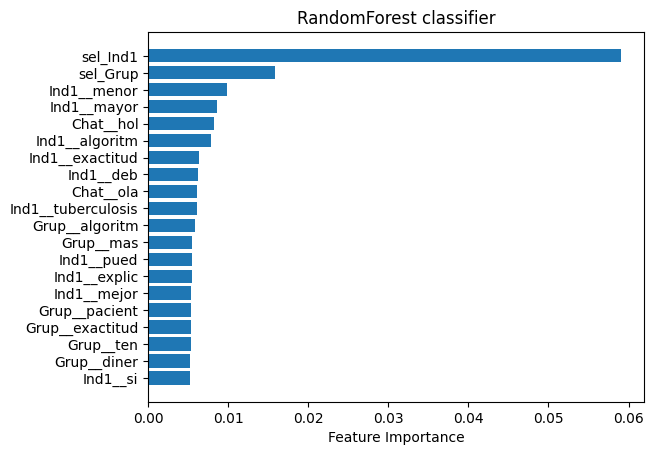

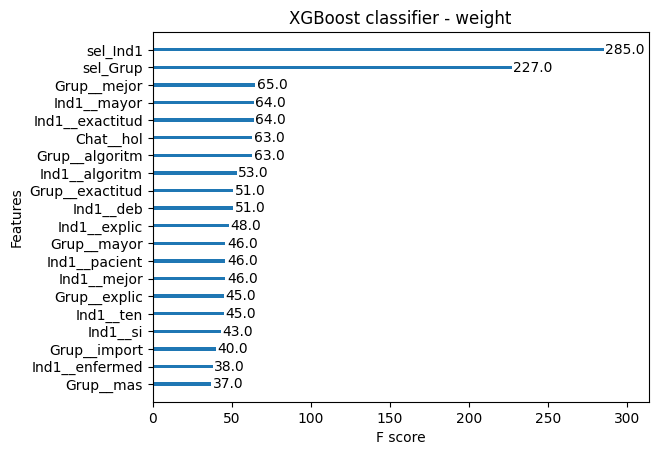

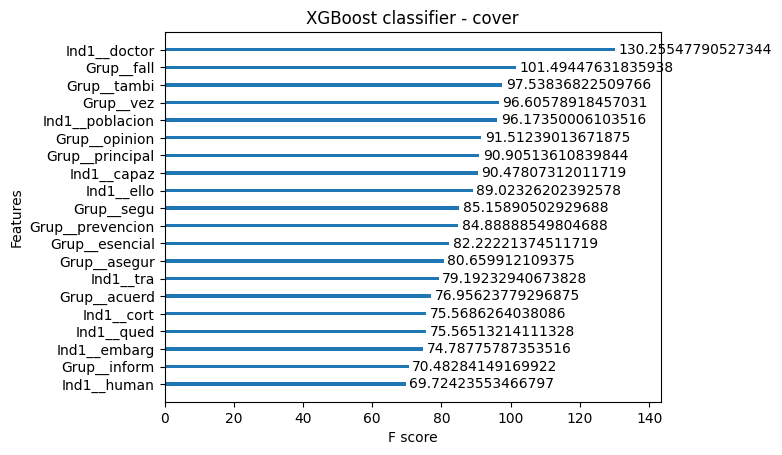

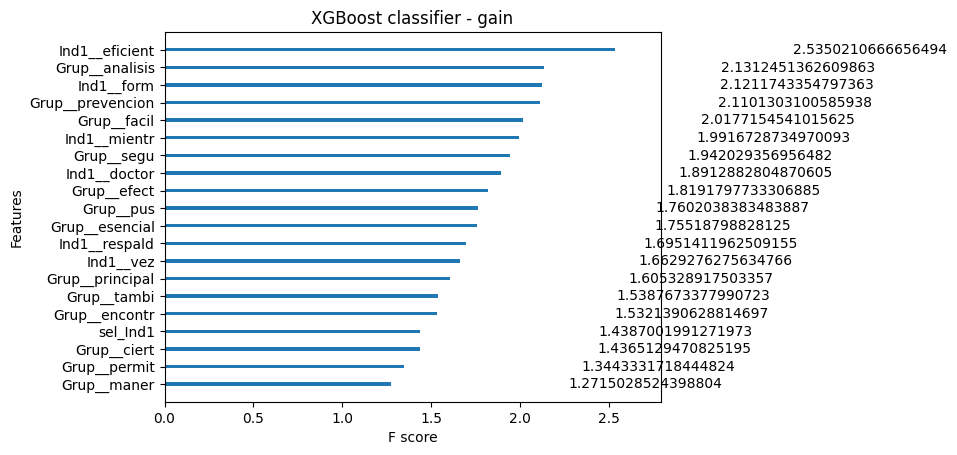

In [110]:
plot_importance_models(rf_best_model, xgb_best_model)

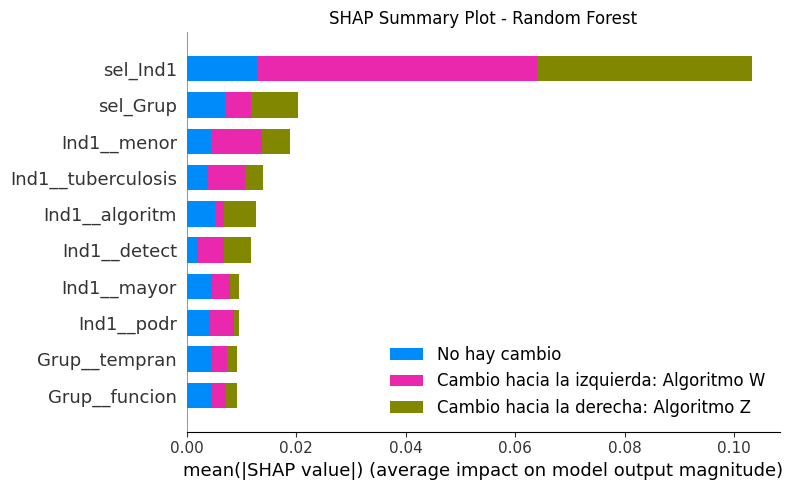

In [111]:
summary_plot(rf_best_model, df_train, 'SHAP Summary Plot - Random Forest', df=2)

[23:16:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


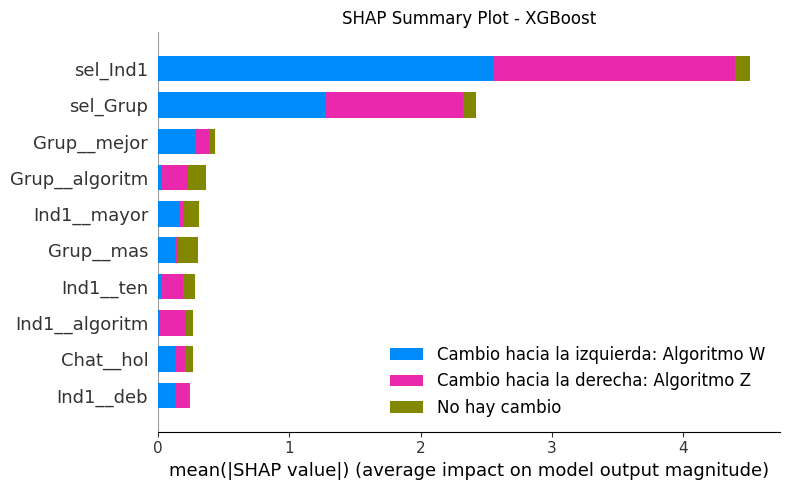

In [112]:
summary_plot(xgb_best_model, df_train, 'SHAP Summary Plot - XGBoost', df=2)

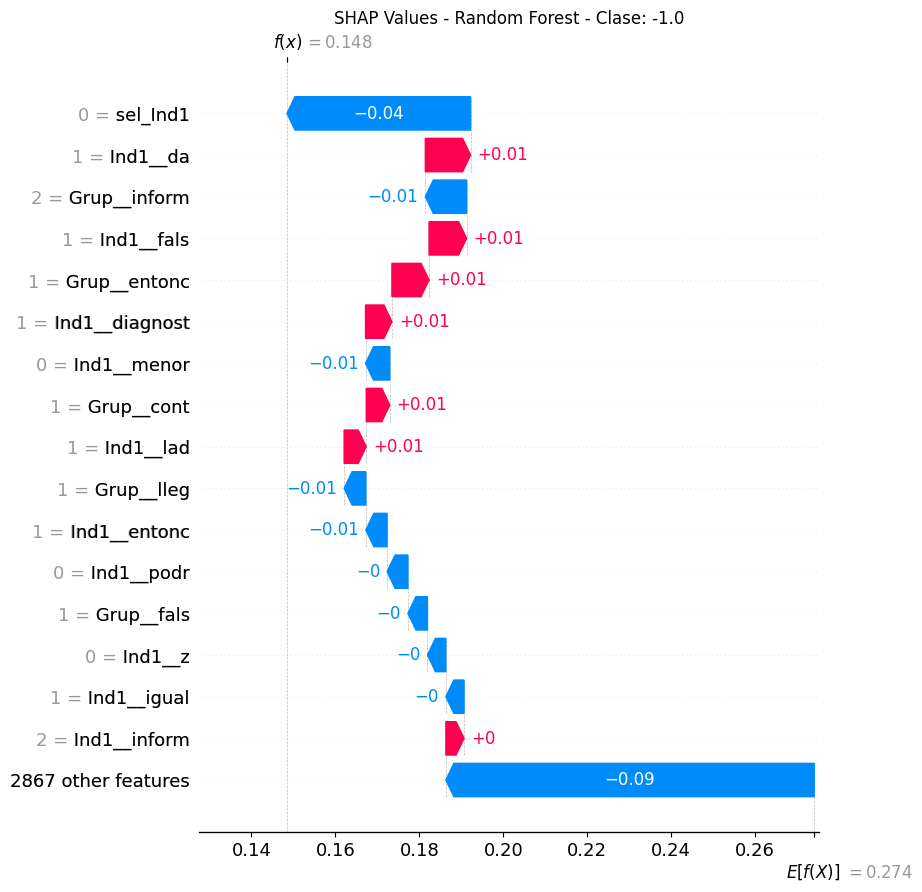

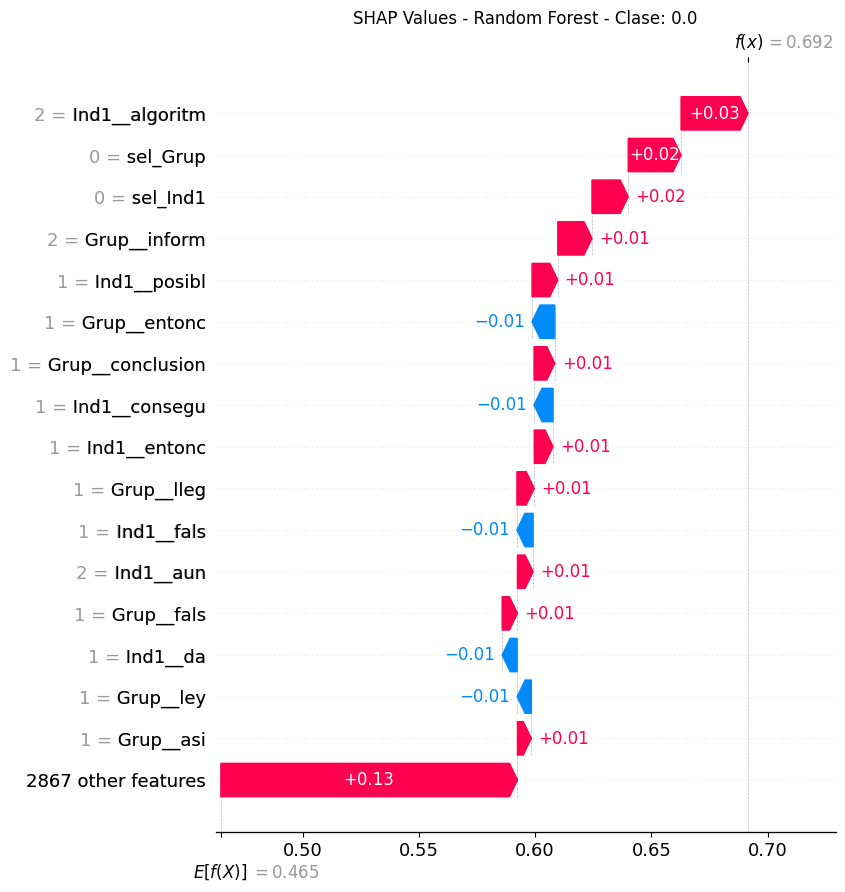

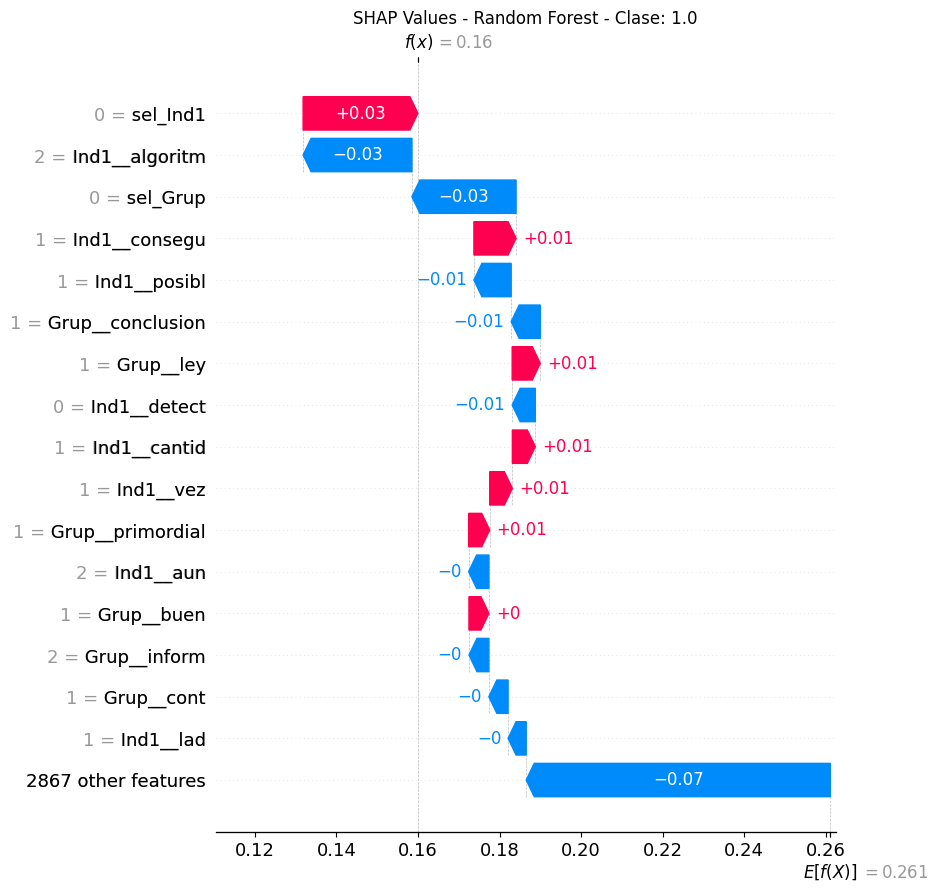

In [113]:
idx=1

individual_explanation(idx, rf_best_model, df_train, 'SHAP Values - Random Forest')

[23:17:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


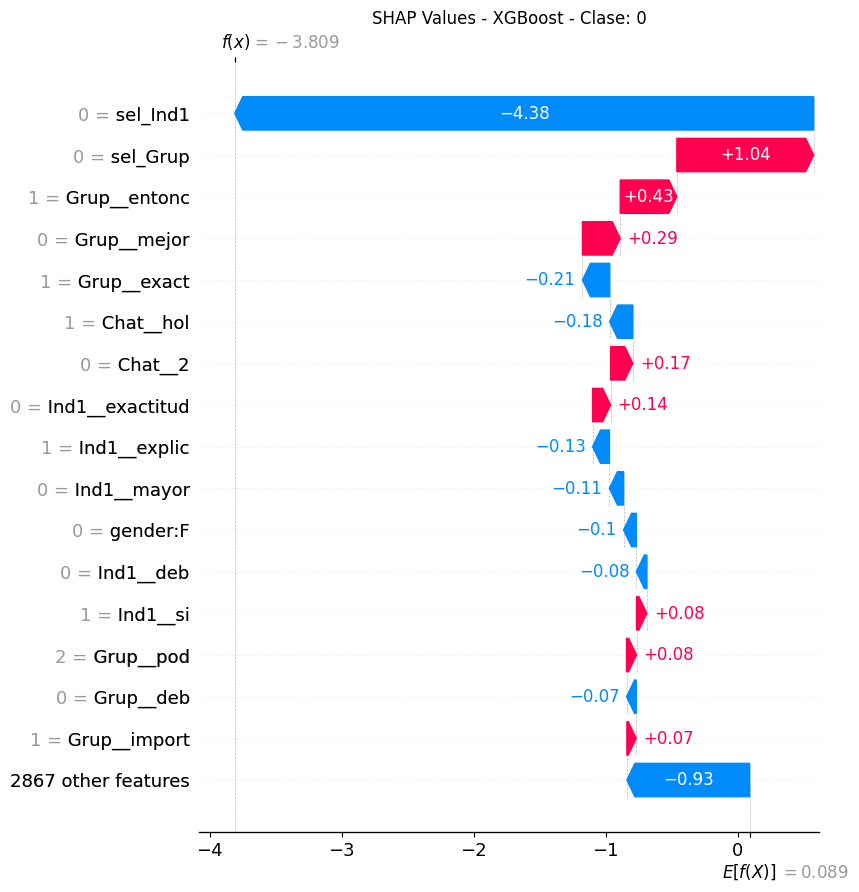

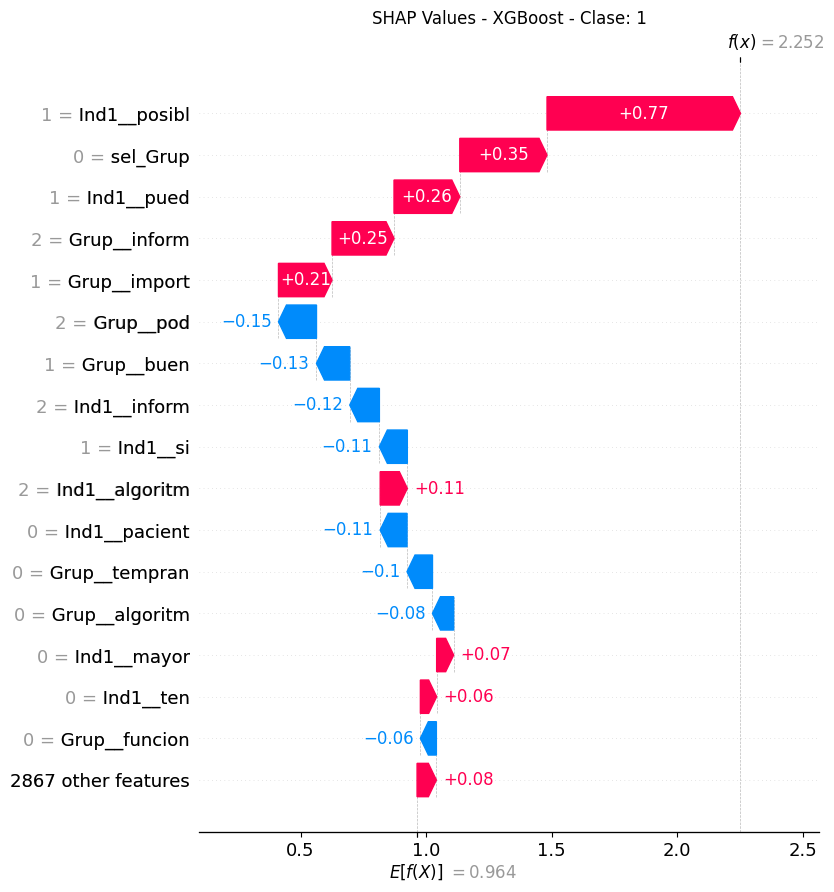

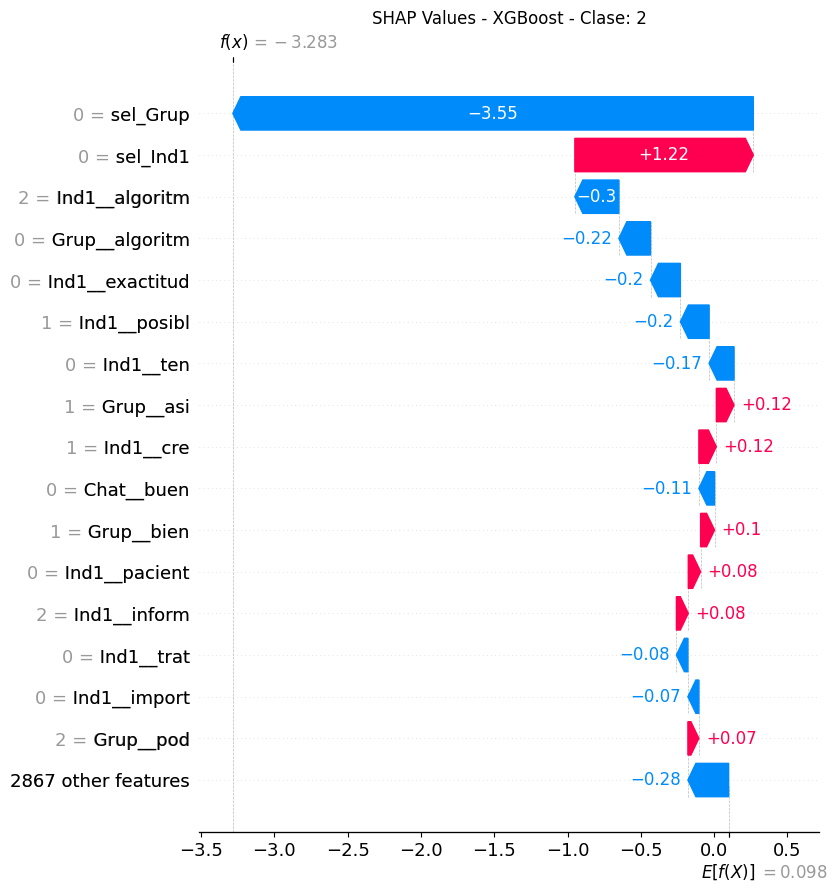

In [114]:
idx=1

individual_explanation(idx, xgb_best_model, df_train, 'SHAP Values - XGBoost')